In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv("updated_output.csv")
df

,state,apmc,commodity,min_price,modal_price,max_price,commodity_arrivals,commodity_traded,created_at,year,month,day
0,ODISHA,NIMAPARA,BETEL LEAVES,454.545455,454.545455,454.545455,673.2,673.2,2021-01-04,2021,1,4
1,ODISHA,NIMAPARA,BETEL LEAVES,454.545455,454.545455,454.545455,633.6,633.6,2021-01-03,2021,1,3
2,ODISHA,NIMAPARA,BETEL LEAVES,454.545455,454.545455,454.545455,607.2,607.2,2021-01-01,2021,1,1
3,ODISHA,NIMAPARA,BETEL LEAVES,454.545455,454.545455,454.545455,569.8,569.8,2021-01-06,2021,1,6
4,ODISHA,SAKHIGOPAL,COCONUT,3.500000,3.500000,4.500000,103200.0,103200.0,2021-01-04,2021,1,4
...,...,...,...,...,...,...,...,...,...,...,...,...
4051580,UTTARAKHAND,HARIDWAR,RIDGE GOURD (TURAI),10.300000,10.300000,10.300000,100.0,100.0,2025-09-06,2025,9,6
4051581,UTTARAKHAND,KASHIPUR,BANANA,22.000000,22.000000,22.000000,100.0,100.0,2025-09-06,2025,9,6
4051582,WEST BENGAL,JIYAGANJ KRISHAK BAZAR,RIDGE GOURD (TURAI),40.000000,40.000000,40.000000,100.0,100.0,2025-09-06,2025,9,6
4051583,WEST BENGAL,JIYAGANJ KRISHAK BAZAR,RIDGE GOURD (TURAI),40.000000,40.000000,40.000000,0.0,100.0,2025-09-05,2025,9,5


## Testing

                state            apmc               commodity  min_price  \
created_at                                                                 
2021-01-01  RAJASTHAN  SAWAI MADHOPUR       URAD (BLACK GRAM)      61.55   
2021-01-01  RAJASTHAN           SIKAR                  GINGER      20.00   
2021-01-01  RAJASTHAN       RAJSAMAND         SPINACH (PALAK)       8.00   
2021-01-01  RAJASTHAN       RAJSAMAND  FENUGREEK (HARI METHI)       7.50   
2021-01-01  RAJASTHAN       RAJSAMAND                 BRINJAL      19.00   
...               ...             ...                     ...        ...   
2025-09-06     ODISHA        BARIPADA     RIDGE GOURD (TURAI)      40.00   
2025-09-06     ODISHA        BARIPADA           BOTTLE GOURDE      20.00   
2025-09-06    HARYANA           SOHNA                   ONION      17.00   
2025-09-06    HARYANA           SIRSA        ARBI (COLACASIA)      21.00   
2025-09-06     ODISHA      MALKANGIRI                 PUMPKIN      15.00   

           

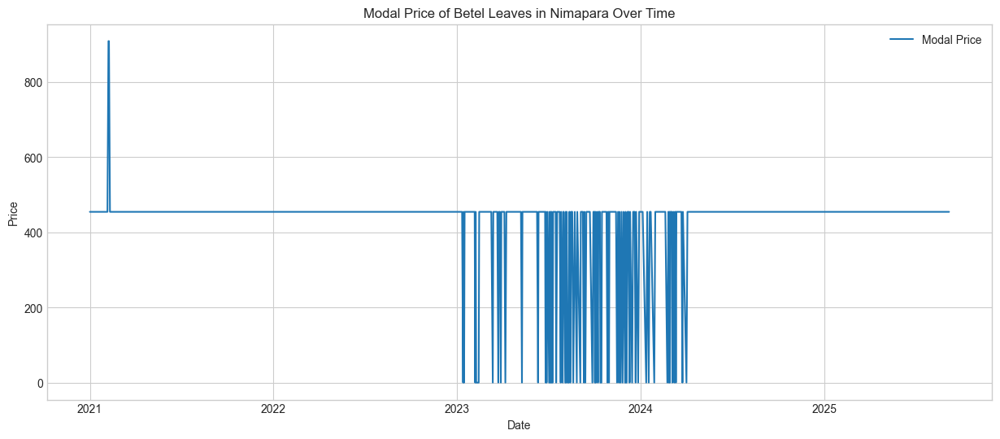

In [3]:
df['created_at'] = pd.to_datetime(df['created_at'])
df = df.set_index('created_at').sort_index()
print(df)
df_betel = df[
    (df['state'] == 'ODISHA') &
    (df['apmc'] == 'NIMAPARA') &
    (df['commodity'] == 'BETEL LEAVES')
]

plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 6))
plt.plot(df_betel.index, df_betel['modal_price'], label='Modal Price')
plt.title('Modal Price of Betel Leaves in Nimapara Over Time')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

In [4]:
# from statsmodels.tsa.seasonal import seasonal_decompose

# df_betel_daily = df_betel['modal_price'].resample('D').ffill()

# result = seasonal_decompose(df_betel_daily, model='additive', period=365) # Assuming a yearly seasonal pattern

# fig = result.plot()
# fig.set_size_inches(14, 8)
# plt.show()

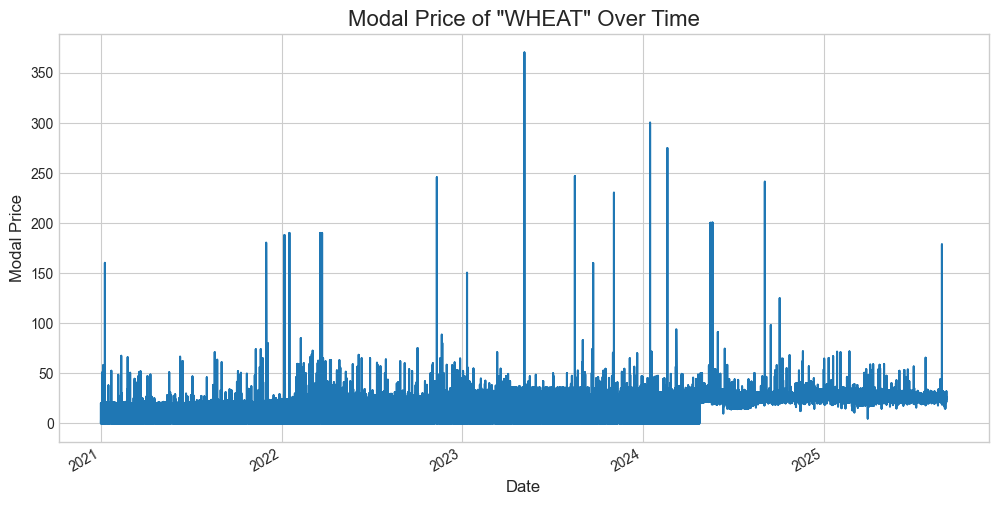

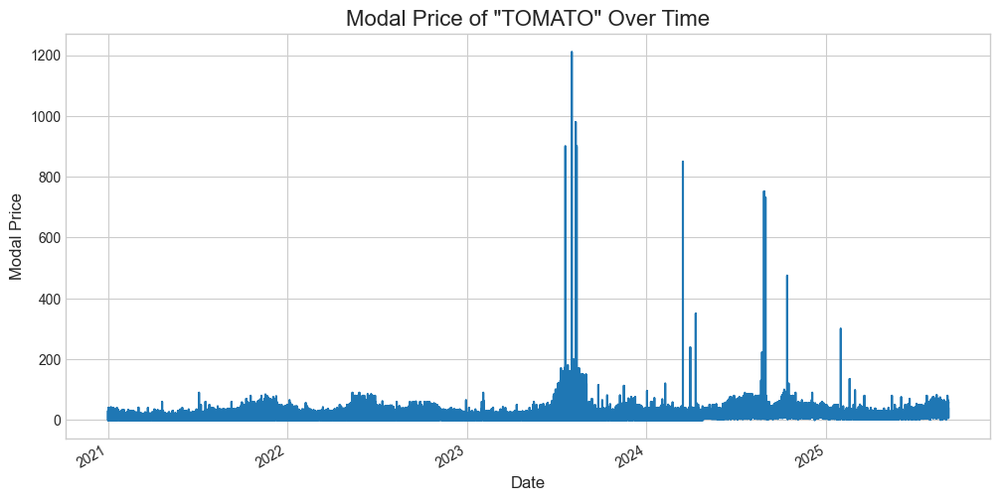

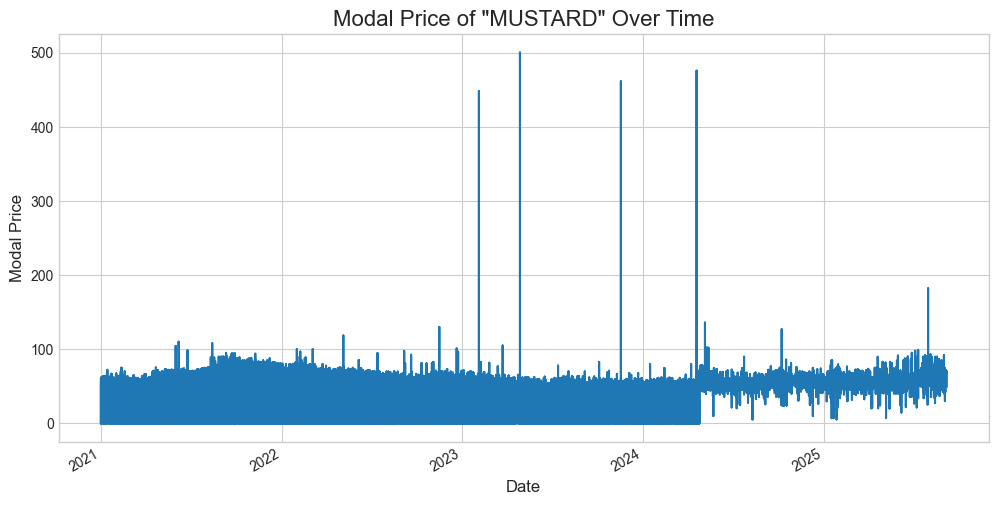

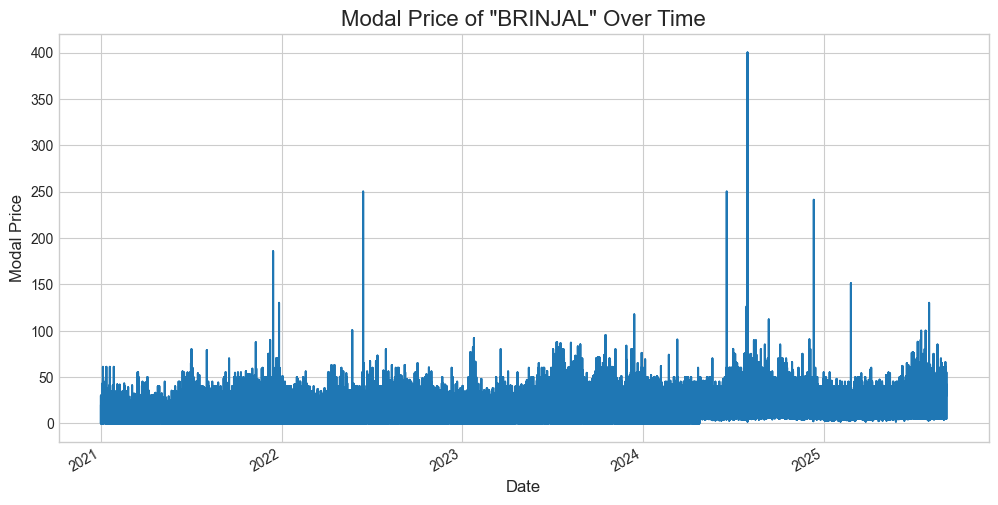

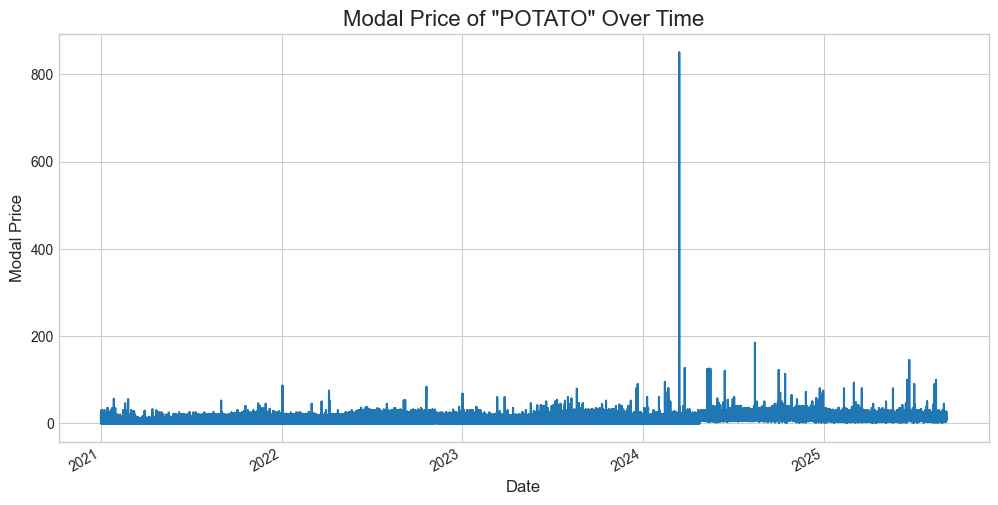

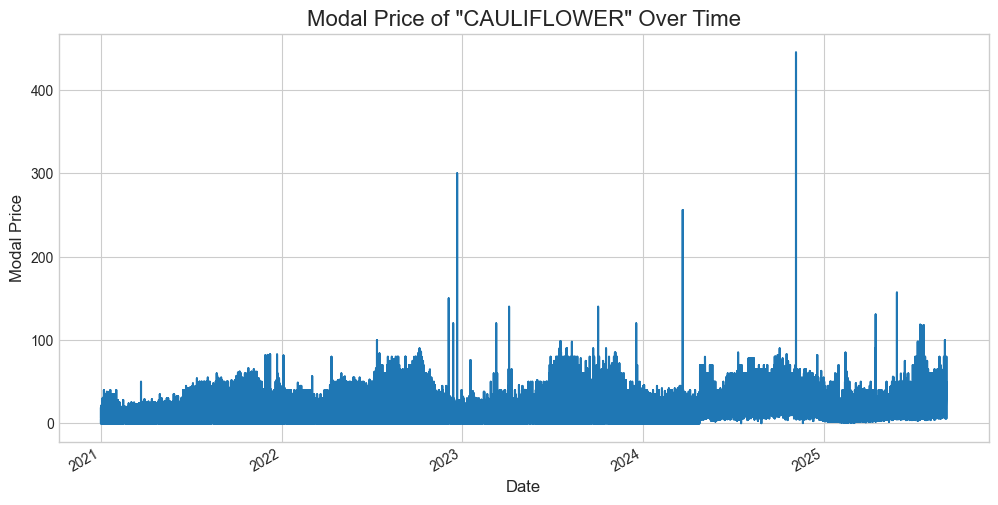

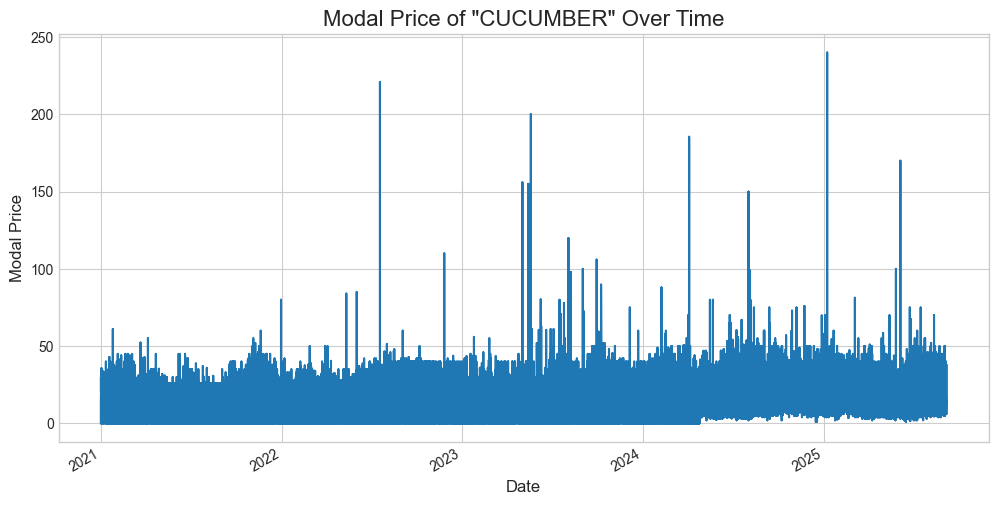

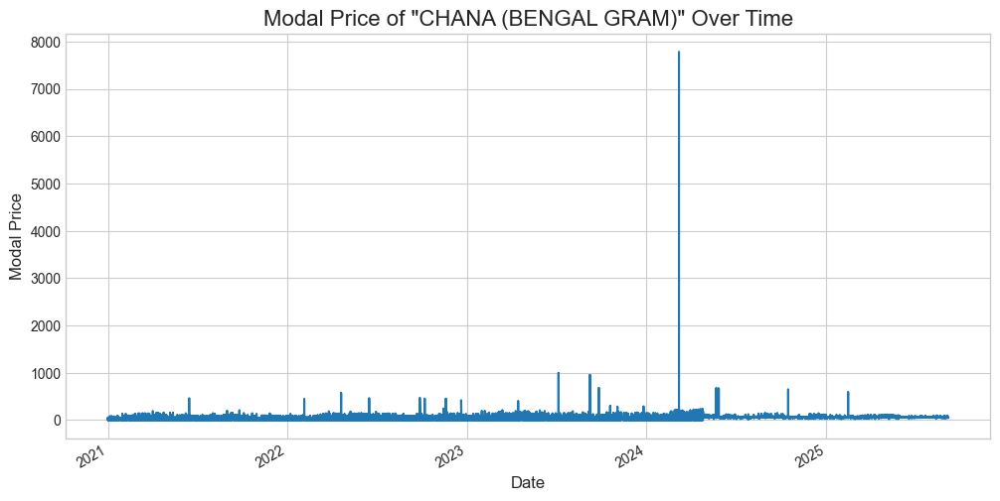

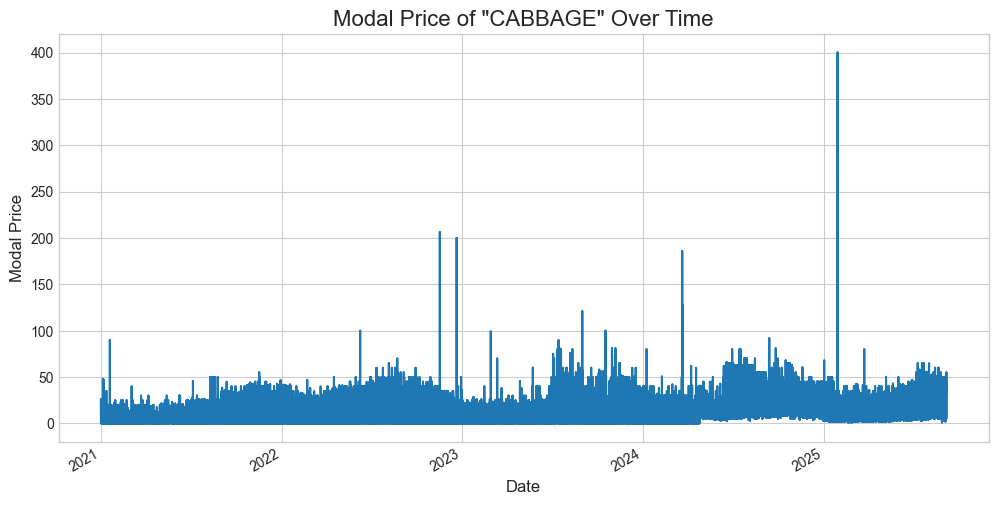

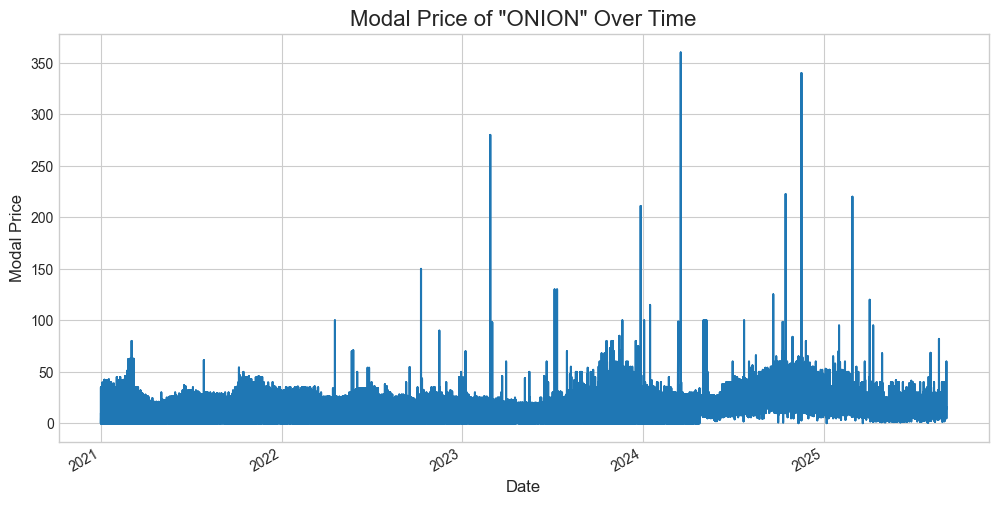

In [5]:
top_commodities = df['commodity'].value_counts().nlargest(10).index

for commodity in top_commodities:
    df_commodity = df[df['commodity'] == commodity]
    
    if len(df_commodity) < 2:
        print(f"--> Skipping plot for '{commodity}': Not enough data points to show a trend.")
        continue
        
    df_commodity = df_commodity.sort_index()

    plt.figure(figsize=(12, 6))
    plt.plot(df_commodity.index, df_commodity['modal_price'], linestyle='-')
    
    plt.gcf().autofmt_xdate()
    plt.title(f'Modal Price of "{commodity}" Over Time', fontsize=16)
    plt.xlabel('Date', fontsize=12)
    plt.ylabel('Modal Price', fontsize=12)
    plt.grid(True)


##  Removing Outliers

In [6]:
price_data = df[df['commodity'] == 'POTATO']['modal_price']

Q1 = price_data.quantile(0.25)
Q3 = price_data.quantile(0.75)
IQR = Q3 - Q1

upper_bound = Q3 + 4 * IQR

print(f"First Quartile (Q1): {Q1}")
print(f"Third Quartile (Q3): {Q3}")
print(f"Interquartile Range (IQR): {IQR}")
print(f"Outlier Threshold (Anything above this is an outlier): {upper_bound}\n")


outliers_df = df[(df['commodity'] == 'POTATO') & (df['modal_price'] > upper_bound)]

print(outliers_df)


First Quartile (Q1): 6.0
Third Quartile (Q3): 13.0
Interquartile Range (IQR): 7.0
Outlier Threshold (Anything above this is an outlier): 41.0

                    state                   apmc commodity  min_price  \
created_at                                                              
2021-01-27  UTTAR PRADESH             RAE BARELI    POTATO       6.00   
2021-02-19  UTTAR PRADESH                  BILSI    POTATO      45.70   
2021-02-25      RAJASTHAN        UDAIPUR F AND V    POTATO      55.00   
2021-09-01      RAJASTHAN  SRIGANGANAGAR F AND V    POTATO      52.00   
2021-11-15      RAJASTHAN                 BARMER    POTATO      45.51   
...                   ...                    ...       ...        ...   
2025-07-29       NAGALAND            KOHIMA APMC    POTATO      50.50   
2025-08-11       NAGALAND               LONGLENG    POTATO      44.00   
2025-08-13        HARYANA          SADHAURA APMC    POTATO      90.00   
2025-08-16        HARYANA               CH DADRI    PO

In [7]:
def calculate_upper_bound(price_series):
    """
    Calculates the outlier threshold for a series using a 5*IQR rule.
    """
    Q1 = price_series.quantile(0.25)
    Q3 = price_series.quantile(0.75)
    IQR = Q3 - Q1
    upper_bound = Q3 + 4 * IQR
    return upper_bound

df['outlier_threshold'] = df.groupby('commodity')['modal_price'].transform(calculate_upper_bound)

outliers_df = df[df['modal_price'] > df['outlier_threshold']]

print(outliers_df)


                       state           apmc              commodity  min_price  \
created_at                                                                      
2021-01-01       MAHARASHTRA        AATPADI            POMEGRANATE    1100.00   
2021-01-01         RAJASTHAN  PRATAPGARH RJ              SOYABEANS      15.00   
2021-01-01       MAHARASHTRA         KALAMB              TUR/ARHAR     490.52   
2021-01-03       MAHARASHTRA        AATPADI            POMEGRANATE    1300.00   
2021-01-04       MAHARASHTRA        AATPADI            POMEGRANATE    1100.00   
...                      ...            ...                    ...        ...   
2025-09-06        TAMIL NADU    KAVINDAPADI        JAGGERY SPECIAL      45.75   
2025-09-06         RAJASTHAN         BARMER  POMEGRANATE - BHAGAWA    4050.00   
2025-09-06  HIMACHAL PRADESH       PALAMPUR           BOTTLE GOURD      80.00   
2025-09-06           HARYANA         GOHANA                 CARROT      80.00   
2025-09-06           HARYANA

In [8]:
df_cleaned = df[df['modal_price'] <= df['outlier_threshold']].copy()

df_cleaned.drop(columns=['outlier_threshold'], inplace=True)

print(f"Original DataFrame size: {len(df)} rows")
print(f"Number of outliers removed: {len(outliers_df)} rows")
print(f"Cleaned DataFrame size: {len(df_cleaned)} rows\n")

print(df_cleaned)


Original DataFrame size: 4051585 rows
Number of outliers removed: 7437 rows
Cleaned DataFrame size: 4044148 rows

                state            apmc               commodity  min_price  \
created_at                                                                 
2021-01-01  RAJASTHAN  SAWAI MADHOPUR       URAD (BLACK GRAM)      61.55   
2021-01-01  RAJASTHAN           SIKAR                  GINGER      20.00   
2021-01-01  RAJASTHAN       RAJSAMAND         SPINACH (PALAK)       8.00   
2021-01-01  RAJASTHAN       RAJSAMAND  FENUGREEK (HARI METHI)       7.50   
2021-01-01  RAJASTHAN       RAJSAMAND                 BRINJAL      19.00   
...               ...             ...                     ...        ...   
2025-09-06     ODISHA        BARIPADA     RIDGE GOURD (TURAI)      40.00   
2025-09-06     ODISHA        BARIPADA           BOTTLE GOURDE      20.00   
2025-09-06    HARYANA           SOHNA                   ONION      17.00   
2025-09-06    HARYANA           SIRSA        ARBI 

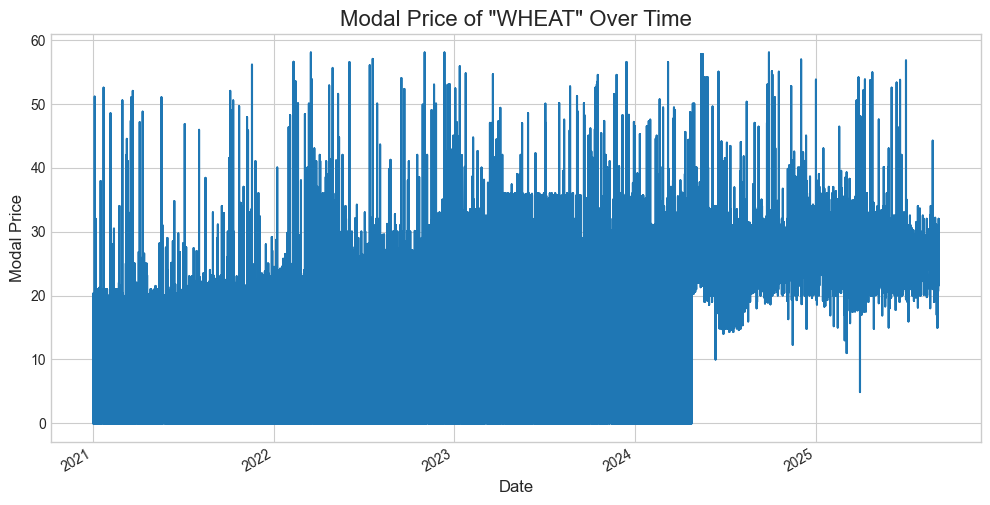

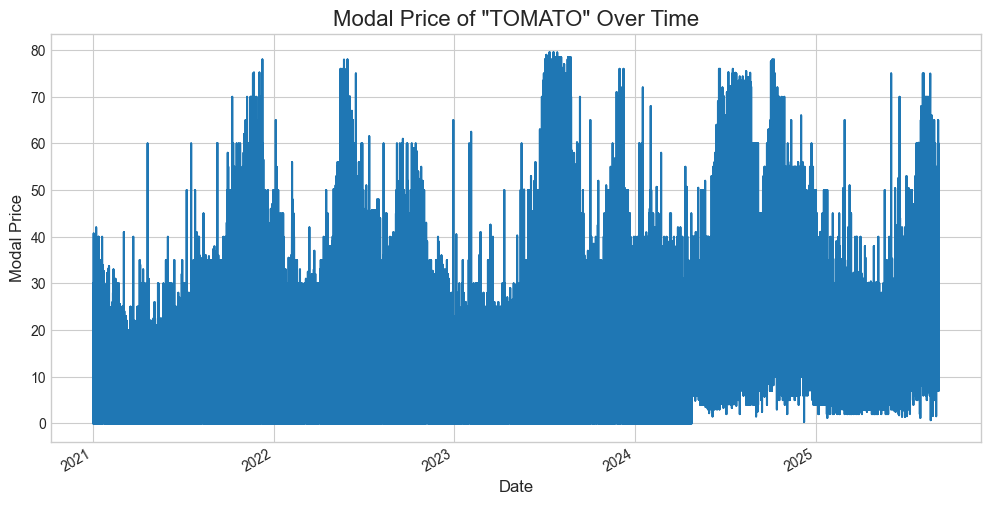

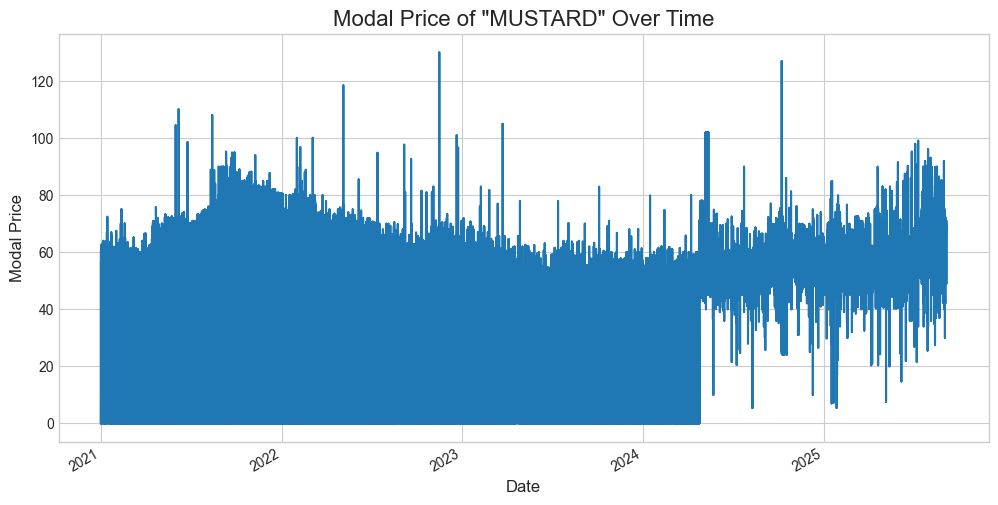

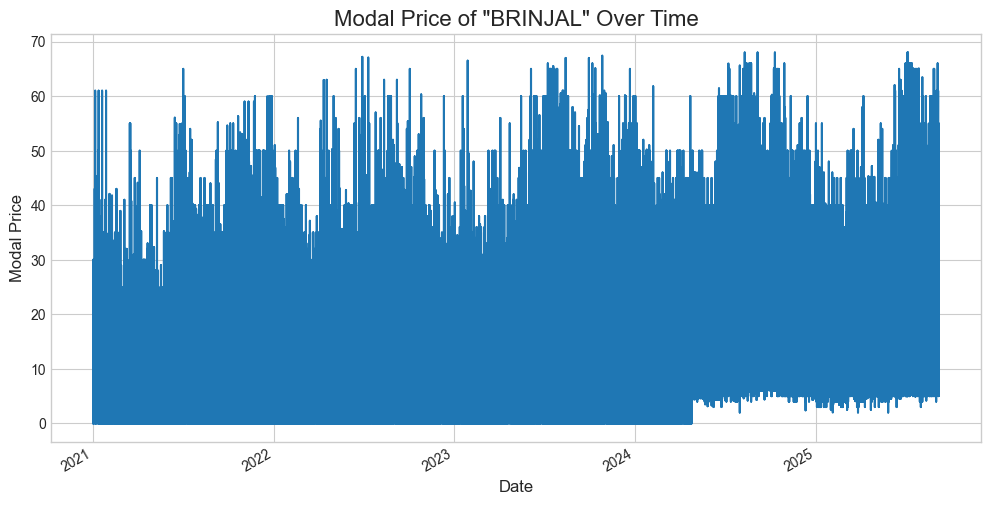

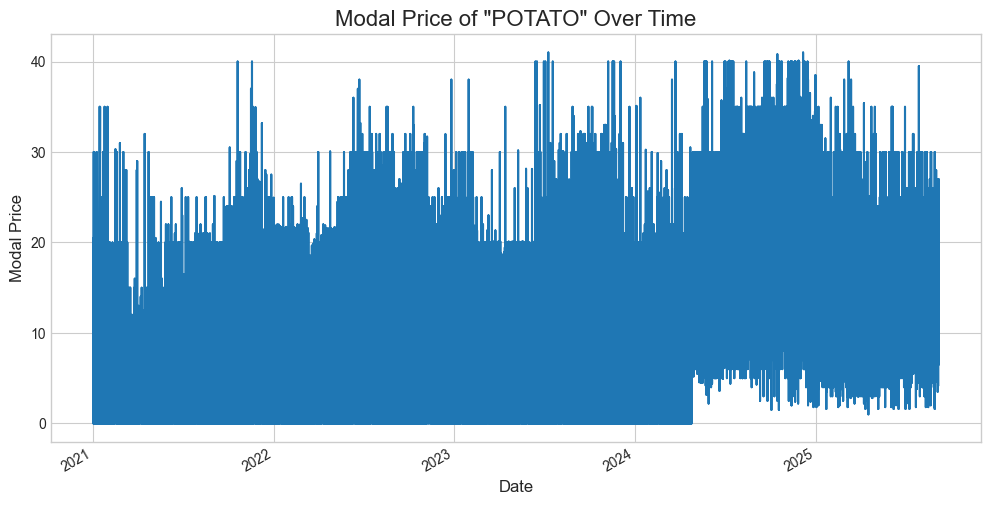

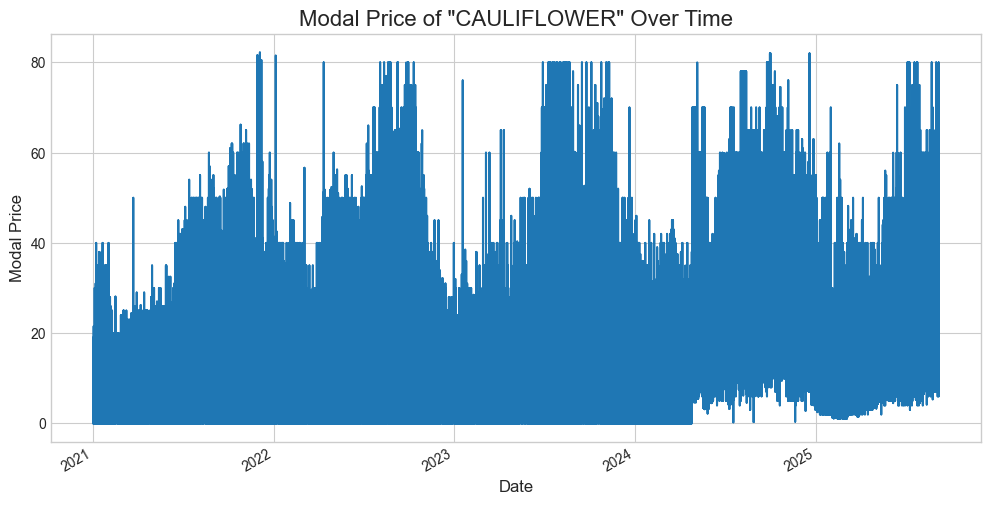

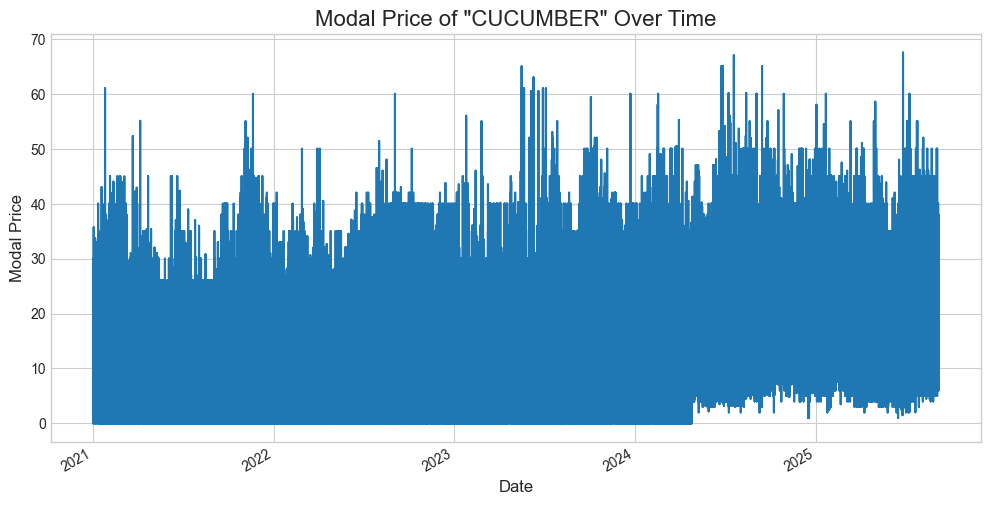

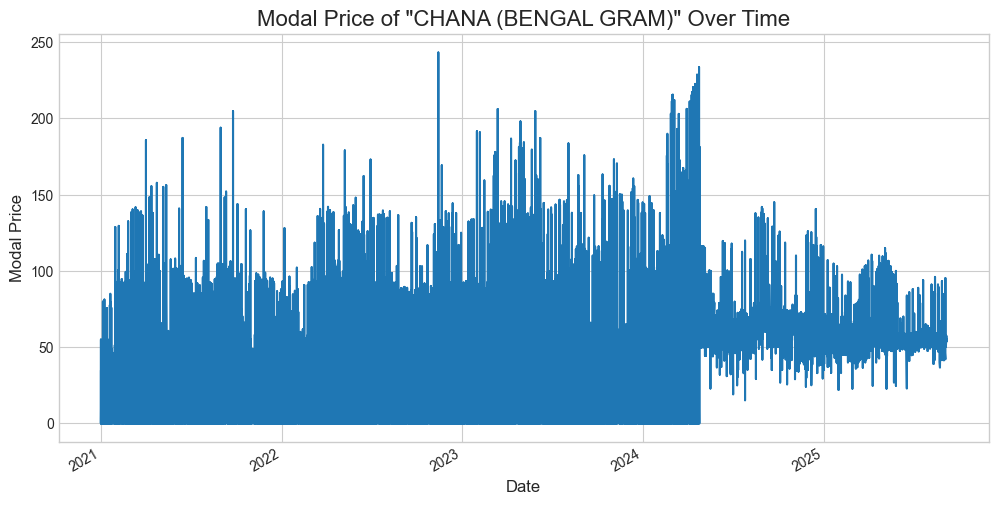

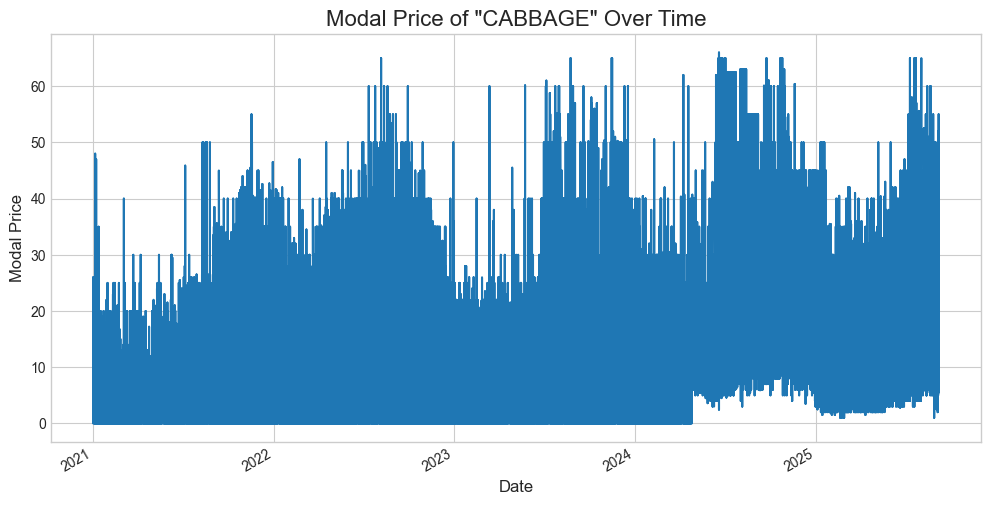

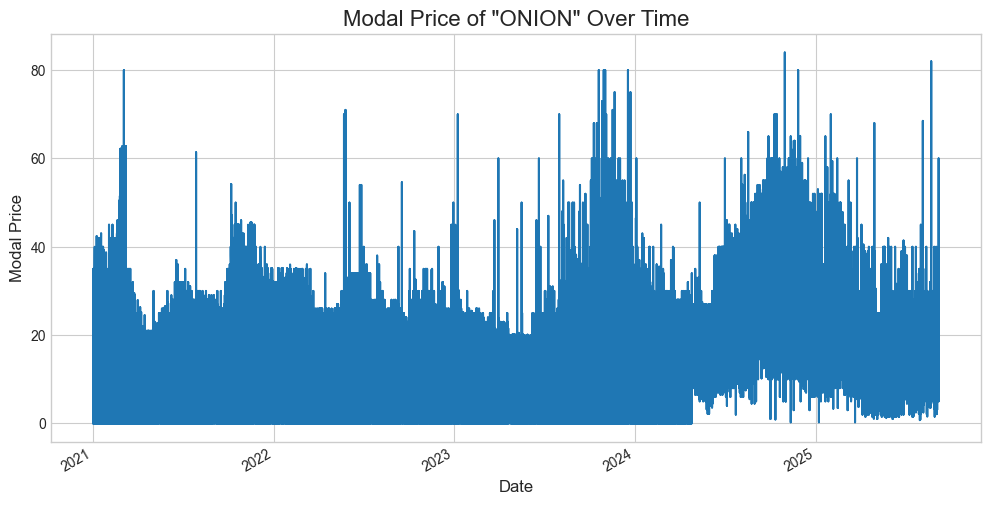

In [9]:
top_commodities = df_cleaned['commodity'].value_counts().nlargest(10).index

for commodity in top_commodities:
    df_commodity = df_cleaned[df_cleaned['commodity'] == commodity]
    
    if len(df_commodity) < 2:
        print(f"--> Skipping plot for '{commodity}': Not enough data points to show a trend.")
        continue
        
    df_commodity = df_commodity.sort_index()

    plt.figure(figsize=(12, 6))
    plt.plot(df_commodity.index, df_commodity['modal_price'], linestyle='-')
    
    plt.gcf().autofmt_xdate()
    plt.title(f'Modal Price of "{commodity}" Over Time', fontsize=16)
    plt.xlabel('Date', fontsize=12)
    plt.ylabel('Modal Price', fontsize=12)
    plt.grid(True)


In [10]:
zero_price_df = df_cleaned[df_cleaned['max_price'] == 0]

if not zero_price_df.empty:
    print(f"Found {len(zero_price_df)} entries with a modal price of 0:")
    print("======================================================")
    print(zero_price_df)
else:
    print("No entries with a modal price of 0 were found in the cleaned dataset.")

Found 841853 entries with a modal price of 0:
                  state        apmc            commodity  min_price  \
created_at                                                            
2021-01-01  MAHARASHTRA  HINGANGHAT                WHEAT        0.0   
2021-01-01  MAHARASHTRA  HINGANGHAT  CHANA (BENGAL GRAM)        0.0   
2021-01-01  MAHARASHTRA    BARAMATI            SOYABEANS        0.0   
2021-01-01  MAHARASHTRA      Basmat        TURMERIC BULB        0.0   
2021-01-01  MAHARASHTRA      Basmat      TURMERIC FINGER        0.0   
...                 ...         ...                  ...        ...   
2024-04-25      HARYANA      REWARI               GRAPES        0.0   
2024-04-25      HARYANA      REWARI               BANANA        0.0   
2024-04-25      HARYANA      REWARI              COCONUT        0.0   
2024-04-25      HARYANA      REWARI         BITTER GOURD        0.0   
2024-04-25      HARYANA      KARNAL         WHEAT-BHANSI        0.0   

            modal_price  max_p

In [11]:
df_final = df_cleaned[df_cleaned['max_price'] != 0].copy()

print(f"Original cleaned DataFrame size: {len(df_cleaned)} rows")
print(f"DataFrame size after removing zero-price entries: {len(df_final)} rows")
print(f"Number of rows removed: {len(df_cleaned) - len(df_final)}")

Original cleaned DataFrame size: 4044148 rows
DataFrame size after removing zero-price entries: 3202295 rows
Number of rows removed: 841853


In [12]:
df_final.to_csv('final_output.csv', index=True) 

In [13]:
import pandas as pd


def find_top_apmc_with_count(commodity_name, df):
    
    print(f"--- Finding Top APMC and its Count for '{commodity_name.upper()}' in Each State ---")

    commodity_df = df[df['commodity'].str.upper() == commodity_name.upper()]

    if commodity_df.empty:
        print(f"No data found for commodity: {commodity_name}")
        return

    counts = commodity_df.groupby(['state', 'apmc']).size().reset_index(name='count')
    idx = counts.groupby('state')['count'].idxmax()
    result_df = counts.loc[idx]

    result_df = result_df.sort_values(by='count', ascending=False).reset_index(drop=True)
    print(result_df.to_string(index=False))

find_top_apmc_with_count('WHEAT', df_final)

print("\n")

find_top_apmc_with_count('CABBAGE', df_final)

--- Finding Top APMC and its Count for 'WHEAT' in Each State ---
         state                           apmc  count
     RAJASTHAN                          DOONI   1365
   MAHARASHTRA                         NAGPUR   1103
MADHYA PRADESH                           GUNA   1101
 UTTAR PRADESH                      LAKHIMPUR   1000
  CHHATTISGARH                        MUNGELI    932
       GUJARAT                         SANAND    731
   UTTARAKHAND                         LAKSAR    473
       HARYANA                          SIRSA    231
     JHARKHAND                     HAZARIBAGH    186
     TELANGANA                        JAGTIAL     11
   WEST BENGAL ISLAMPUR PRINCIPAL MARKET YARD      7
         BIHAR                        SASARAM      4
     KARNATAKA                  APMC KALBURGI      3
        PUNJAB                         AJNALA      1


--- Finding Top APMC and its Count for 'CABBAGE' in Each State ---
            state                           apmc  count
   ANDHRA PRADE

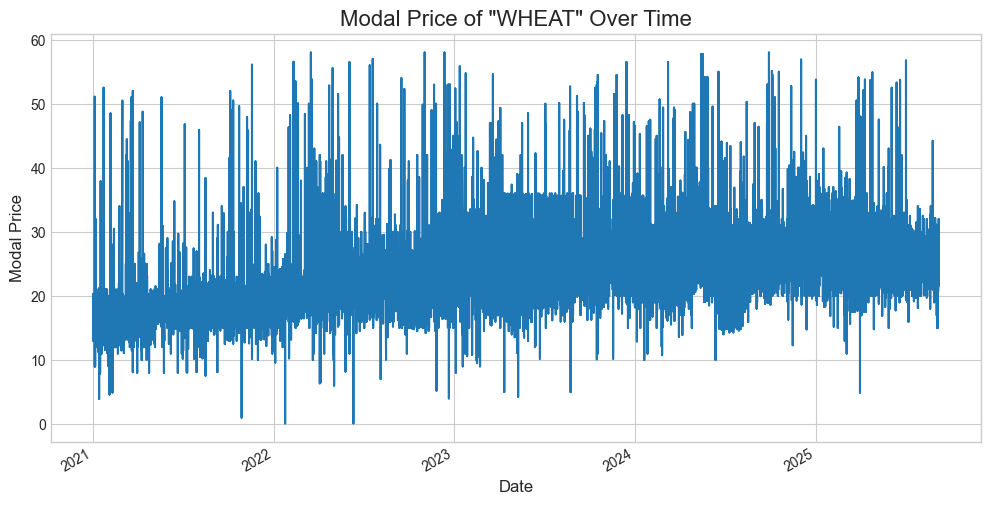

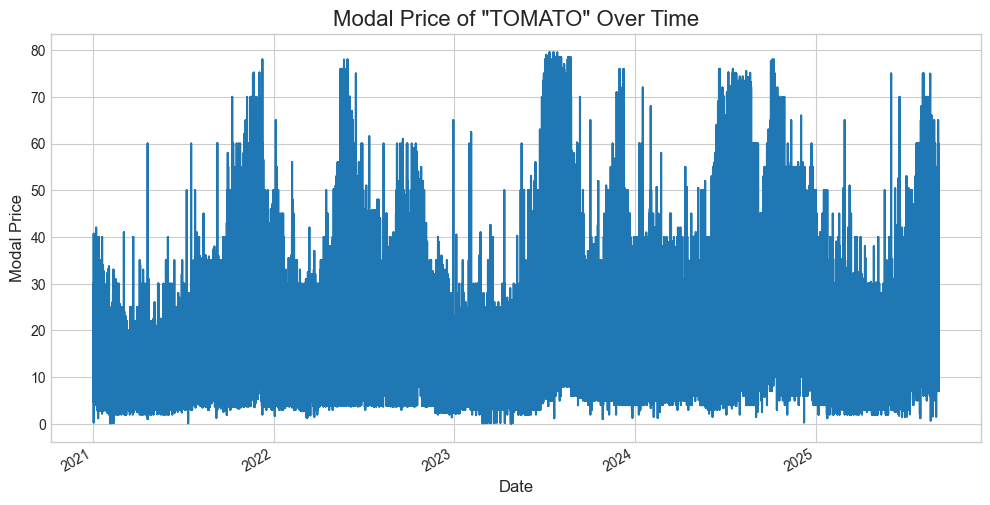

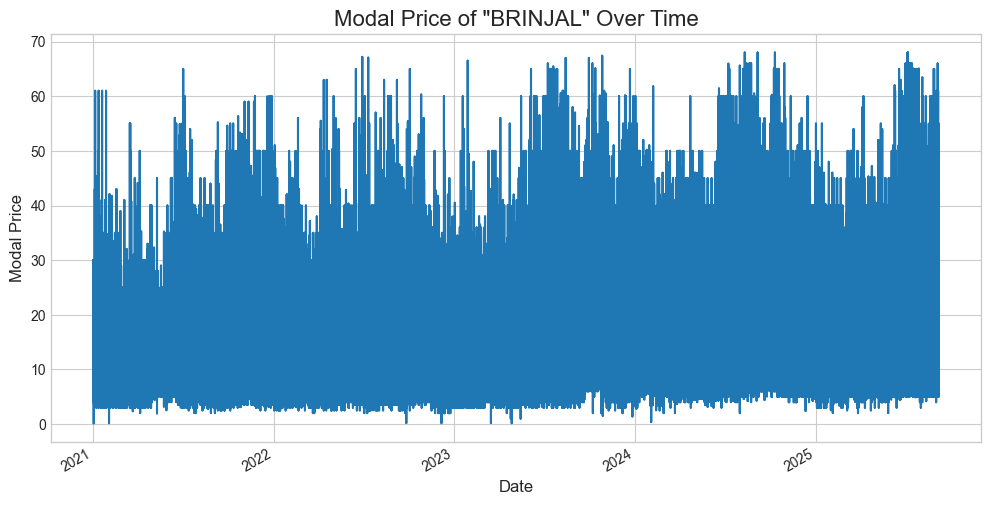

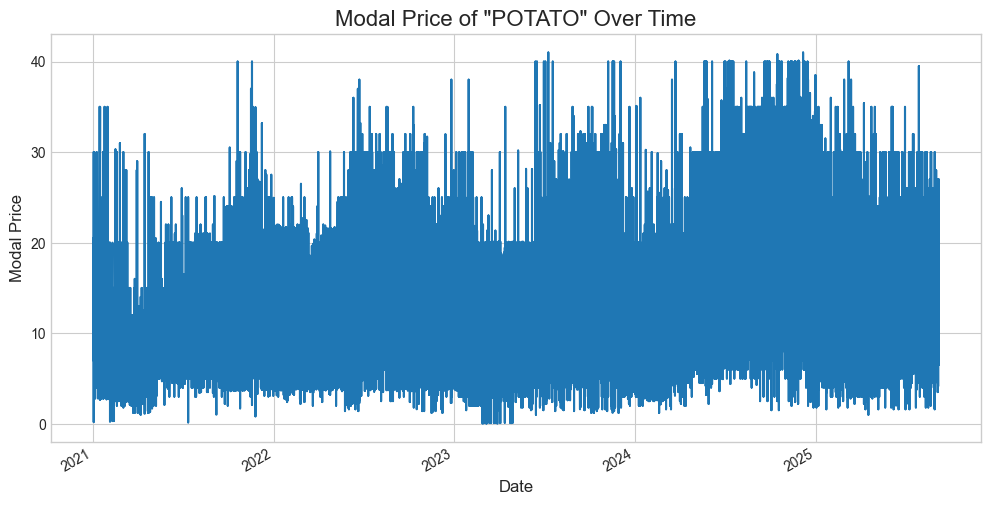

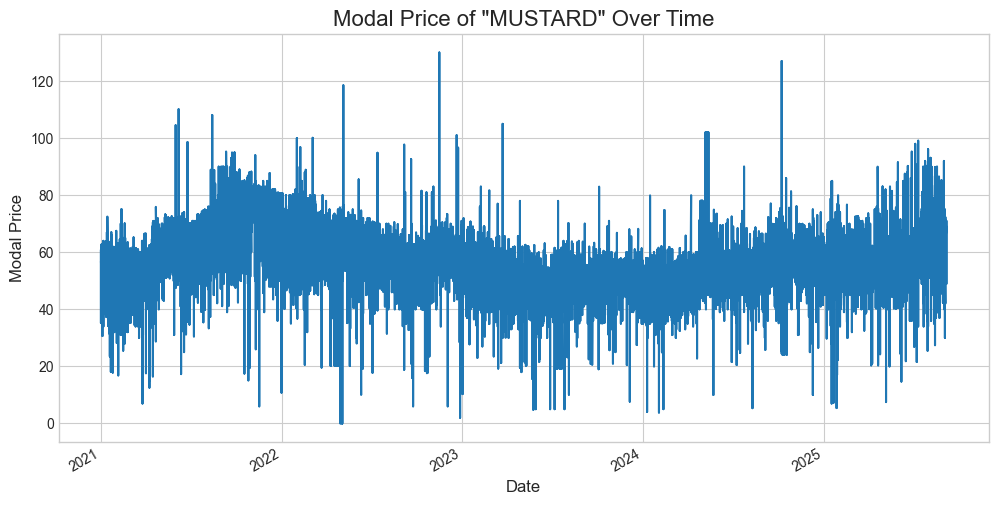

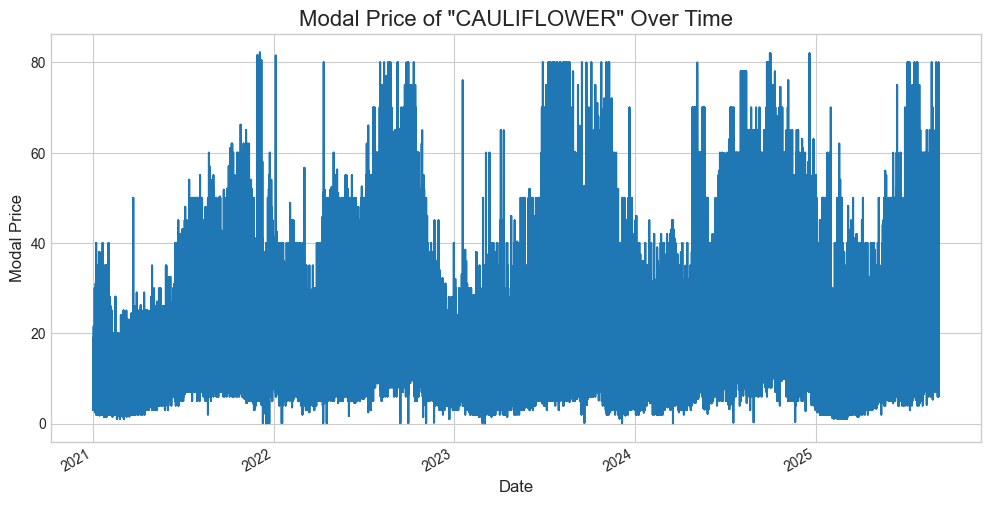

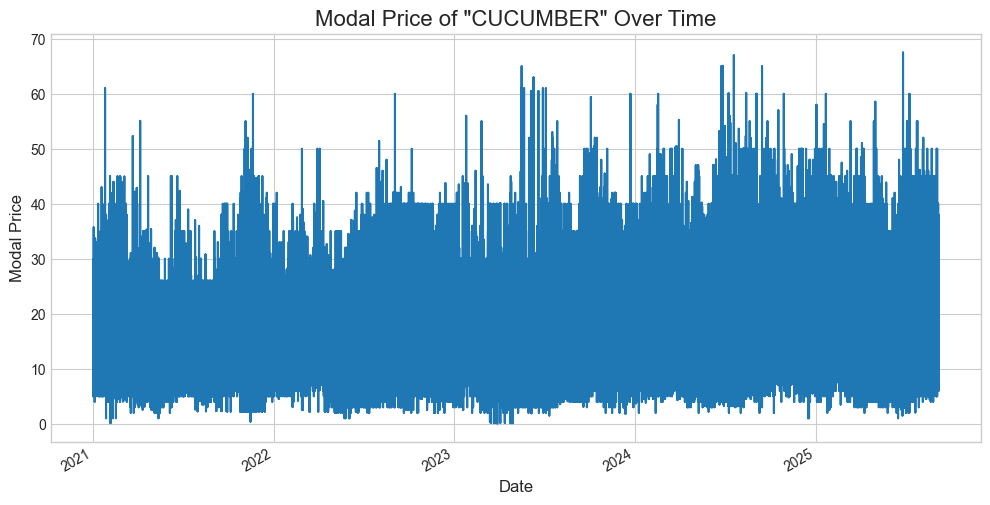

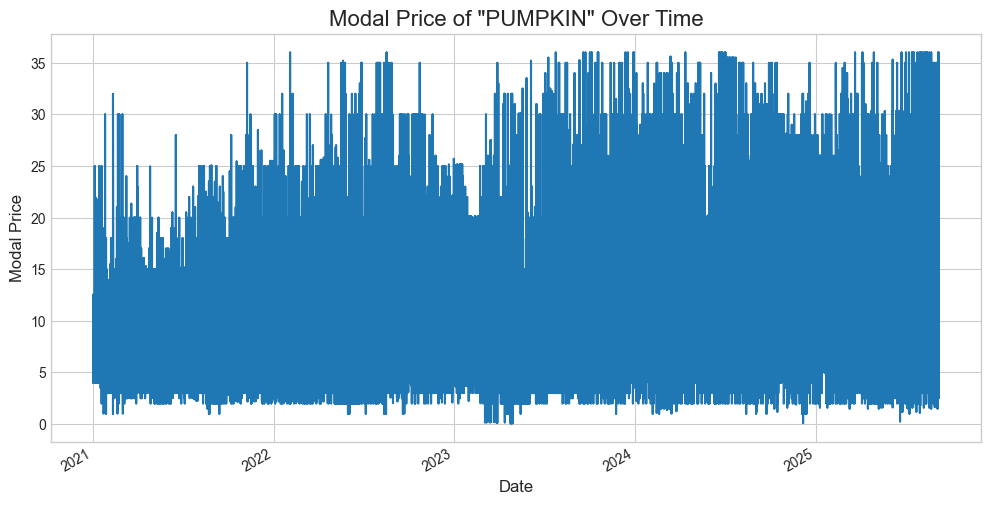

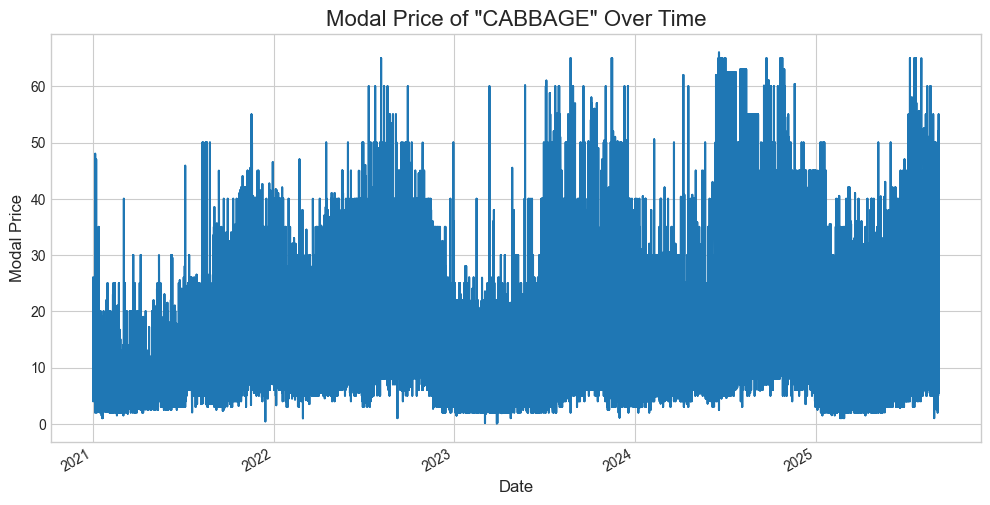

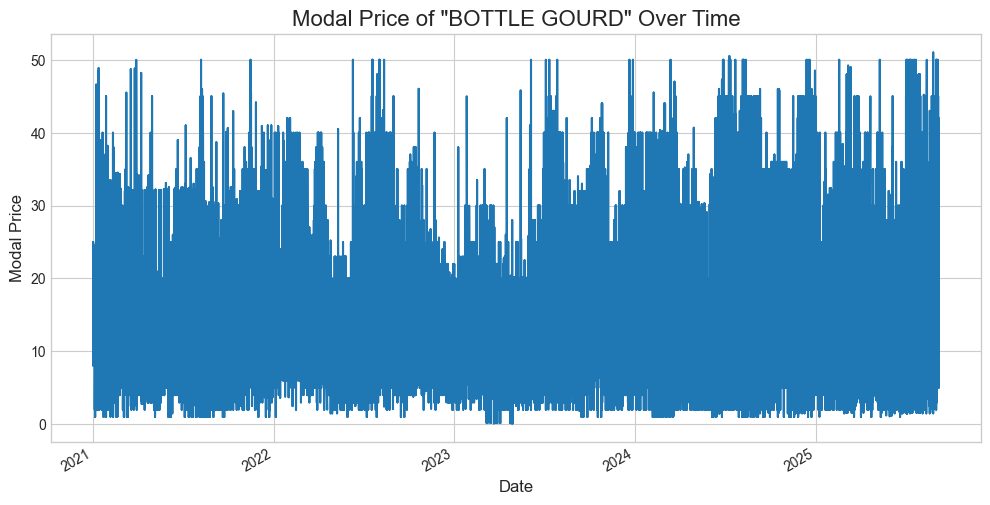

In [14]:
top_commodities = df_final['commodity'].value_counts().nlargest(10).index

for commodity in top_commodities:
    df_commodity = df_final[df_final['commodity'] == commodity]
    
    if len(df_commodity) < 2:
        print(f"--> Skipping plot for '{commodity}': Not enough data points to show a trend.")
        continue
        
    df_commodity = df_commodity.sort_index()

    plt.figure(figsize=(12, 6))
    plt.plot(df_commodity.index, df_commodity['modal_price'], linestyle='-')
    
    plt.gcf().autofmt_xdate()
    plt.title(f'Modal Price of "{commodity}" Over Time', fontsize=16)
    plt.xlabel('Date', fontsize=12)
    plt.ylabel('Modal Price', fontsize=12)
    plt.grid(True)


### ML

In [15]:
def create_time_features(df):
    df = df.copy()
    df['dayofweek'] = df.index.dayofweek
    df['dayofyear'] = df.index.dayofyear
    df['month'] = df.index.month
    df['year'] = df.index.year
    df['quarter'] = df.index.quarter
    df['weekofyear'] = df.index.isocalendar().week
    return df

[0]	validation_0-mae:3.97204	validation_1-mae:5.26440
[100]	validation_0-mae:1.68800	validation_1-mae:3.73119
[200]	validation_0-mae:0.93657	validation_1-mae:3.48651
[300]	validation_0-mae:0.71708	validation_1-mae:3.39756
[308]	validation_0-mae:0.70761	validation_1-mae:3.39837

Model's Mean Absolute Error on the Test Set: 3.40
R-squared (R²): 0.54


C:\Users\WELCOME\AppData\Local\Temp\ipykernel_12480\2654778559.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['prediction'] = predictions


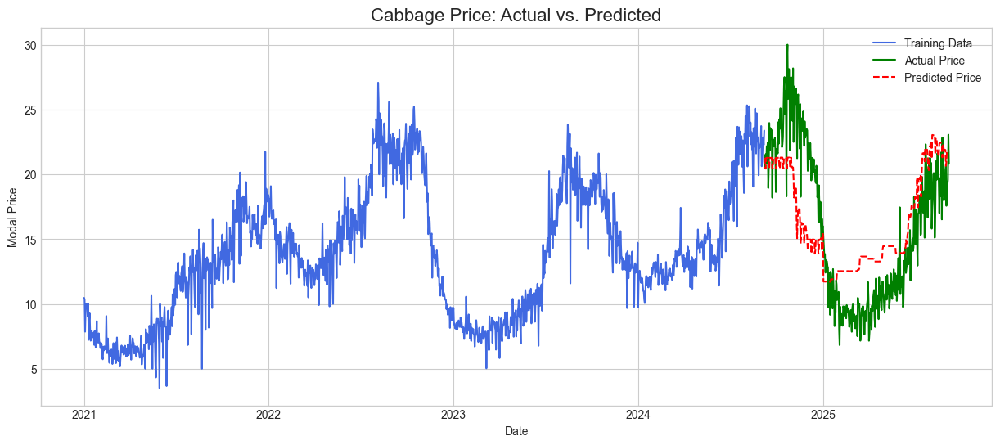

In [16]:
import xgboost as xgb
from sklearn.metrics import mean_absolute_error, r2_score

df_cabbage = df_final[df_final['commodity'] == 'CABBAGE'].copy()
df_cabbage = df_cabbage.groupby(df_cabbage.index).mean(numeric_only=True) # Aggregate daily prices

# Resample to ensure one entry per day, filling missing days with the last known price
df_cabbage = df_cabbage['modal_price'].resample('D').ffill().to_frame()


df_cabbage = create_time_features(df_cabbage)

split_date = df_cabbage.index.max() - pd.Timedelta(days=365)
train_df = df_cabbage.loc[df_cabbage.index <= split_date]
test_df = df_cabbage.loc[df_cabbage.index > split_date]

FEATURES = ['dayofweek', 'dayofyear', 'month', 'year', 'quarter', 'weekofyear']
TARGET = 'modal_price'

X_train = train_df[FEATURES]
y_train = train_df[TARGET]

X_test = test_df[FEATURES]
y_test = test_df[TARGET]


model = xgb.XGBRegressor(
    n_estimators=1000,    
    learning_rate=0.01,   
    objective='reg:squarederror',
    eval_metric='mae',
    early_stopping_rounds=20 
)

model.fit(X_train, y_train,
          eval_set=[(X_train, y_train), (X_test, y_test)],
          verbose=100) 


predictions = model.predict(X_test)
mae = mean_absolute_error(y_test, predictions)
print(f"\nModel's Mean Absolute Error on the Test Set: {mae:.2f}")

r2 = r2_score(y_test, predictions)
print(f"R-squared (R²): {r2:.2f}")


test_df['prediction'] = predictions

plt.figure(figsize=(15, 6))
plt.style.use('seaborn-v0_8-whitegrid')

plt.plot(train_df.index, train_df['modal_price'], label='Training Data', color='royalblue')
plt.plot(test_df.index, test_df['modal_price'], label='Actual Price', color='green')
plt.plot(test_df.index, test_df['prediction'], label='Predicted Price', color='red', linestyle='--')

plt.title('Cabbage Price: Actual vs. Predicted', fontsize=16)
plt.xlabel('Date')
plt.ylabel('Modal Price')
plt.legend()
plt.show()

[0]	validation_0-mae:6.70477	validation_1-mae:9.21381
[100]	validation_0-mae:2.70582	validation_1-mae:7.79712
[200]	validation_0-mae:1.29583	validation_1-mae:7.70197
[300]	validation_0-mae:0.84395	validation_1-mae:7.65647
[400]	validation_0-mae:0.69871	validation_1-mae:7.64667
[406]	validation_0-mae:0.69374	validation_1-mae:7.64657

Model's Mean Absolute Error on the Test Set: 7.65
R-squared (R²): 0.10


C:\Users\WELCOME\AppData\Local\Temp\ipykernel_12480\3420166314.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['prediction'] = predictions


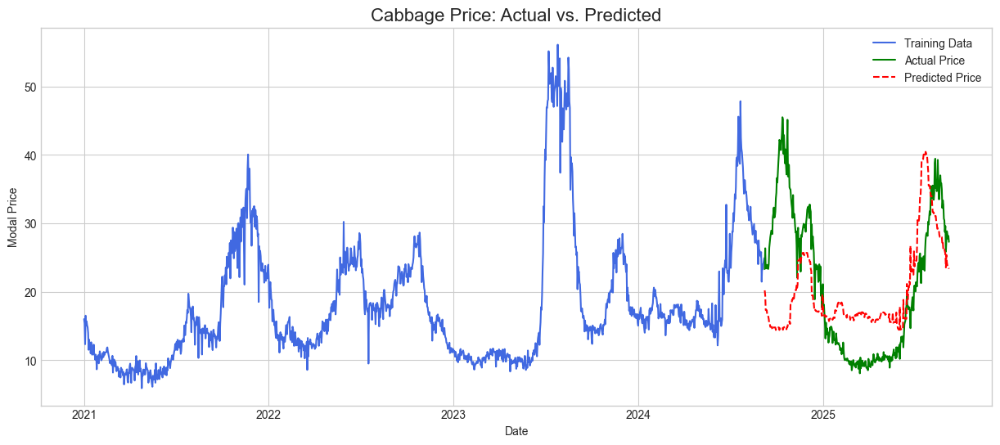

In [17]:
import xgboost as xgb
from sklearn.metrics import mean_absolute_error, r2_score

df_cabbage = df_final[df_final['commodity'] == 'TOMATO'].copy()
df_cabbage = df_cabbage.groupby(df_cabbage.index).mean(numeric_only=True) # Aggregate daily prices

# Resample to ensure one entry per day, filling missing days with the last known price
df_cabbage = df_cabbage['modal_price'].resample('D').ffill().to_frame()


df_cabbage = create_time_features(df_cabbage)

split_date = df_cabbage.index.max() - pd.Timedelta(days=365)
train_df = df_cabbage.loc[df_cabbage.index <= split_date]
test_df = df_cabbage.loc[df_cabbage.index > split_date]

FEATURES = ['dayofweek', 'dayofyear', 'month', 'year', 'quarter', 'weekofyear']
TARGET = 'modal_price'

X_train = train_df[FEATURES]
y_train = train_df[TARGET]

X_test = test_df[FEATURES]
y_test = test_df[TARGET]


model = xgb.XGBRegressor(
    n_estimators=1000,    
    learning_rate=0.01,   
    objective='reg:squarederror',
    eval_metric='mae',
    early_stopping_rounds=20 
)

model.fit(X_train, y_train,
          eval_set=[(X_train, y_train), (X_test, y_test)],
          verbose=100) 


predictions = model.predict(X_test)
mae = mean_absolute_error(y_test, predictions)
print(f"\nModel's Mean Absolute Error on the Test Set: {mae:.2f}")

r2 = r2_score(y_test, predictions)
print(f"R-squared (R²): {r2:.2f}")


test_df['prediction'] = predictions

plt.figure(figsize=(15, 6))
plt.style.use('seaborn-v0_8-whitegrid')

plt.plot(train_df.index, train_df['modal_price'], label='Training Data', color='royalblue')
plt.plot(test_df.index, test_df['modal_price'], label='Actual Price', color='green')
plt.plot(test_df.index, test_df['prediction'], label='Predicted Price', color='red', linestyle='--')

plt.title('Cabbage Price: Actual vs. Predicted', fontsize=16)
plt.xlabel('Date')
plt.ylabel('Modal Price')
plt.legend()
plt.show()

In [18]:
# df_model = df_final[
#     (df_final['state'] == 'ODISHA') &
#     (df_final['apmc'] == 'NIMAPARA') &
#     (df_final['commodity'] == 'TOMATO')
# ].copy()

# # 2. Feature Engineering (Lags and Rolling Windows)
# # ==================================================
# df_model['price_lag_1'] = df_model['modal_price'].shift(1)
# df_model['price_lag_7'] = df_model['modal_price'].shift(7)
# df_model['price_lag_14'] = df_model['modal_price'].shift(14)
# df_model['rolling_mean_7'] = df_model['modal_price'].shift(1).rolling(window=7).mean()
# df_model['rolling_mean_14'] = df_model['modal_price'].shift(1).rolling(window=14).mean()
# df_model['rolling_std_7'] = df_model['modal_price'].shift(1).rolling(window=7).std()
# df_model = df_model.dropna()

# # 3. Create Time-Based Features
# # ===============================
# def create_time_features(df_to_feature):
#     df_to_feature['dayofyear'] = df_to_feature.index.dayofyear
#     df_to_feature['dayofweek'] = df_to_feature.index.dayofweek
#     df_to_feature['quarter'] = df_to_feature.index.quarter
#     df_to_feature['month'] = df_to_feature.index.month
#     df_to_feature['year'] = df_to_feature.index.year
#     return df_to_feature

# df_model = create_time_features(df_model)

# # 4. Define Features and Target, then Split Data
# # =================================================
# FEATURES = [
#     'dayofyear', 'dayofweek', 'quarter', 'month', 'year',
#     'price_lag_1', 'price_lag_7', 'price_lag_14',
#     'rolling_mean_7', 'rolling_mean_14', 'rolling_std_7'
# ]
# TARGET = 'modal_price'

# split_date = df_model.index.max() - pd.Timedelta(days=365)
# train_df = df_model.loc[df_model.index <= split_date]
# test_df = df_model.loc[df_model.index > split_date]

# X_train = train_df[FEATURES]
# y_train = train_df[TARGET]
# X_test = test_df[FEATURES]
# y_test = test_df[TARGET]

# # 5. Train the XGBoost Model (CORRECTED)
# # ======================================
# reg = xgb.XGBRegressor(
#     n_estimators=1000,
#     early_stopping_rounds=50
# )

# # The eval_set parameter is now correctly placed inside the .fit() method
# reg.fit(
#     X_train,
#     y_train,
#     eval_set=[(X_test, y_test)],
#     verbose=False
# )

# # 6. Evaluate and Predict
# # =========================
# predictions = reg.predict(X_test)
# test_df['prediction'] = predictions

# r2 = r2_score(y_test, predictions)
# mae = mean_absolute_error(y_test, predictions)
# print(f"R-squared (R²): {r2:.3f}")
# print(f"Mean Absolute Error (MAE): {mae:.3f}")

# # 7. Plot the Results
# # =====================
# plt.figure(figsize=(15, 6))
# plt.style.use('seaborn-v0_8-whitegrid')

# plt.plot(train_df.index, train_df['modal_price'], label='Training Data', color='royalblue')
# plt.plot(test_df.index, test_df['modal_price'], label='Actual Price', color='green')
# plt.plot(test_df.index, test_df['prediction'], label='Predicted Price', color='red', linestyle='--')

# plt.title('Betel Leaves Price: Actual vs. Predicted', fontsize=16)
# plt.xlabel('Date')
# plt.ylabel('Modal Price')
# plt.legend()
# plt.show()


[0]	validation_0-mae:6.31072	validation_1-mae:7.55358
[100]	validation_0-mae:4.68936	validation_1-mae:6.41215
[200]	validation_0-mae:4.09456	validation_1-mae:6.01840
[300]	validation_0-mae:3.76081	validation_1-mae:5.87434
[385]	validation_0-mae:3.58963	validation_1-mae:5.82502

Model's Mean Absolute Error on the Test Set: 5.82
R-squared (R²): 0.39


C:\Users\WELCOME\AppData\Local\Temp\ipykernel_12480\556515210.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['prediction'] = predictions


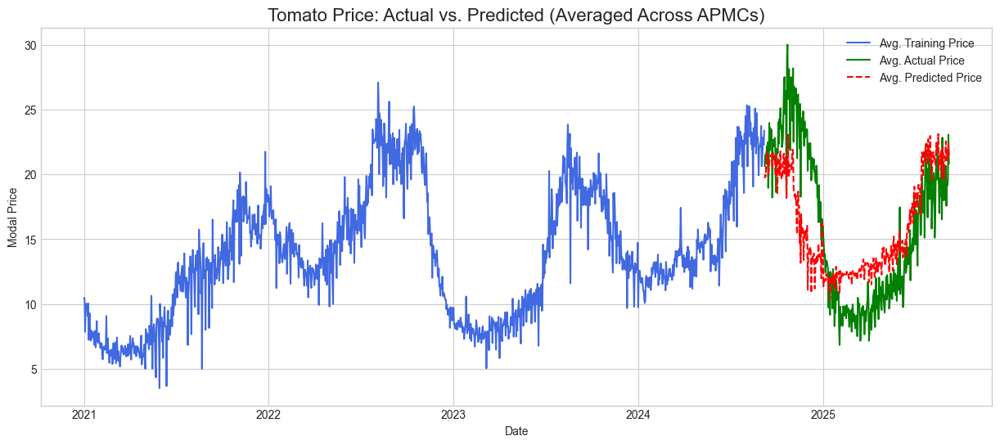

In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import xgboost as xgb
from sklearn.metrics import mean_absolute_error, r2_score



# 1. 🚀 NEW: Encode Categorical Features
# =======================================
# Convert 'state' and 'apmc' text to numbers the model can use.
df_final['state_code'] = df_final['state'].astype('category').cat.codes
df_final['apmc_code'] = df_final['apmc'].astype('category').cat.codes


# 2. Prepare the Data
# =====================
# Select the commodity you want to model
df_tomato = df_final[df_final['commodity'] == 'CABBAGE'].copy()

# Note: The resampling logic from your code is best for a single time series.
# Since we now model across different APMCs, we will not aggregate/resample,
# as we want to predict the price for each unique APMC on a given day.
# If you have multiple entries for the same APMC on the same day, you would group here.
# For now, we assume the data is clean (one entry per APMC per day).

def create_time_features(df_to_feature):
    """Creates time series features from a datetime index."""
    df_to_feature['dayofweek'] = df_to_feature.index.dayofweek
    df_to_feature['dayofyear'] = df_to_feature.index.dayofyear
    df_to_feature['month'] = df_to_feature.index.month
    df_to_feature['year'] = df_to_feature.index.year
    df_to_feature['quarter'] = df_to_feature.index.quarter
    df_to_feature['weekofyear'] = df_to_feature.index.isocalendar().week.astype(int)
    return df_to_feature

df_tomato = create_time_features(df_tomato)


# 3. Define Features and Split Data
# ===================================
split_date = df_tomato.index.max() - pd.Timedelta(days=365)
train_df = df_tomato.loc[df_tomato.index <= split_date]
test_df = df_tomato.loc[df_tomato.index > split_date]

# 🚀 NEW: Add the encoded state and apmc codes to the feature list
FEATURES = [
    'dayofweek', 'dayofyear', 'month', 'year', 'quarter', 'weekofyear',
    'state_code', 'apmc_code'  # <-- Added new features
]
TARGET = 'modal_price'

X_train = train_df[FEATURES]
y_train = train_df[TARGET]
X_test = test_df[FEATURES]
y_test = test_df[TARGET]


# 4. Train the XGBoost Model
# ============================
model = xgb.XGBRegressor(
    n_estimators=1000,
    learning_rate=0.01,
    objective='reg:squarederror',
    eval_metric='mae',
    early_stopping_rounds=20
)

model.fit(X_train, y_train,
          eval_set=[(X_train, y_train), (X_test, y_test)],
          verbose=100)


# 5. Evaluate and Plot
# ======================
predictions = model.predict(X_test)
mae = mean_absolute_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

print(f"\nModel's Mean Absolute Error on the Test Set: {mae:.2f}")
print(f"R-squared (R²): {r2:.2f}")

# Plotting becomes more complex with multiple series (one for each APMC).
# Here, we'll plot the average prediction against the average actual price for simplicity.
test_df['prediction'] = predictions

# Group by date to get a single line for actual and predicted values
plot_test_df = test_df.groupby(test_df.index).mean(numeric_only=True)
plot_train_df = train_df.groupby(train_df.index).mean(numeric_only=True)

plt.figure(figsize=(15, 6))
plt.style.use('seaborn-v0_8-whitegrid')

plt.plot(plot_train_df.index, plot_train_df['modal_price'], label='Avg. Training Price', color='royalblue')
plt.plot(plot_test_df.index, plot_test_df['modal_price'], label='Avg. Actual Price', color='green')
plt.plot(plot_test_df.index, plot_test_df['prediction'], label='Avg. Predicted Price', color='red', linestyle='--')

plt.title('Tomato Price: Actual vs. Predicted (Averaged Across APMCs)', fontsize=16)
plt.xlabel('Date')
plt.ylabel('Modal Price')
plt.legend()
plt.show()

### Function

In [20]:
# Create these mappers once after you load df_final
state_mapper = dict(zip(df_final['state'].astype('category').cat.categories, range(len(df_final['state'].unique()))))
apmc_mapper = dict(zip(df_final['apmc'].astype('category').cat.categories, range(len(df_final['apmc'].unique()))))

# Add a reverse mapper to see the names later if needed
reverse_state_mapper = {v: k for k, v in state_mapper.items()}


def predict_price(prediction_date, state, apmc, model_to_use):
    """
    Prepares input data and predicts the price using a trained model.

    Args:
        prediction_date (str): The date for the prediction (e.g., '2025-09-21').
        state (str): The name of the state.
        apmc (str): The name of the APMC.
        model_to_use: The trained XGBoost model.

    Returns:
        float: The predicted modal price.
    """
    # 1. Create a DataFrame from the inputs
    input_data = pd.DataFrame({
        'date': [pd.to_datetime(prediction_date)],
        'state': [state],
        'apmc': [apmc]
    })
    input_data = input_data.set_index('date')

    # 2. Apply the same feature engineering
    # a) Create time features
    input_data = create_time_features(input_data) # Your function from before

    # b) Convert state/apmc to codes using the mappers
    try:
        input_data['state_code'] = input_data['state'].map(state_mapper)
        input_data['apmc_code'] = input_data['apmc'].map(apmc_mapper)
    except KeyError as e:
        print(f"Error: Category '{e.args[0]}' not seen during training.")
        return None

    # 3. Ensure columns are in the same order as training
    # Your FEATURES list from before
    FEATURES = [
        'dayofweek', 'dayofyear', 'month', 'year', 'quarter', 'weekofyear',
        'state_code', 'apmc_code'
    ]
    final_input = input_data[FEATURES]

    # 4. Make the prediction
    prediction = model_to_use.predict(final_input)

    return prediction[0]


# Use the cabbage model you already trained
cabbage_price = predict_price(
    prediction_date='2025-09-21',
    state='ODISHA',
    apmc='NIMAPARA',
    model_to_use=model # Your trained cabbage model
)

print(f"Predicted Cabbage Price: {cabbage_price:.2f}")

Predicted Cabbage Price: 23.52


In [40]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import xgboost as xgb
from sklearn.metrics import mean_absolute_error, r2_score

class CommodityPricePredictor:
    """
    A class to train, evaluate, and predict prices for multiple commodities
    using separate XGBoost models.
    """
    def __init__(self, df):
        """
        Initializes the predictor with the full dataframe.
        """
        if not isinstance(df.index, pd.DatetimeIndex):
            raise TypeError("DataFrame index must be a DatetimeIndex.")
        self.df_full = df.copy()
        self.models = {} # To store a trained model for each commodity
        print("✅ Predictor initialized.")

    def _create_features(self, df):
        """
        Creates time-series features for the given dataframe.
        """
        df = df.copy()
        # Time-based features
        df['dayofweek'] = df.index.dayofweek
        df['dayofyear'] = df.index.dayofyear
        df['month'] = df.index.month
        df['year'] = df.index.year
        df['quarter'] = df.index.quarter
        df['weekofyear'] = df.index.isocalendar().week.astype(int)

        # Lag features (price from previous periods)
        df['price_lag_7'] = df['modal_price'].shift(7)
        df['price_lag_14'] = df['modal_price'].shift(14)
        df['price_lag_30'] = df['modal_price'].shift(30)

        # Rolling window features (trend over the last month)
        df['rolling_mean_30'] = df['modal_price'].shift(1).rolling(window=30).mean()
        df['rolling_std_30'] = df['modal_price'].shift(1).rolling(window=30).std()

        return df.dropna()

    def train(self, commodity):
        """
        Trains a new XGBoost model for a specific commodity.
        """
        print(f"--- Training model for: {commodity} ---")

        # 1. Filter data for the specific commodity and APMC
        df_commodity = self.df_full[self.df_full['commodity'] == commodity]
        if df_commodity.empty:
            print(f"⚠️ Warning: No data found for {commodity}. Skipping training.")
            return

        # Aggregate data to have one price per day for the commodity
        df_daily = df_commodity.groupby(df_commodity.index).agg({
            'modal_price': 'mean' # Use the average price for that day
        })

        # 2. Create features
        df_featured = self._create_features(df_daily)

        # 3. Split data as requested (Train up to 2023 end, test on 2024+)
        train_df = df_featured.loc[df_featured.index < '2024-01-01']
        test_df = df_featured.loc[df_featured.index >= '2024-01-01']

        if test_df.empty or train_df.empty:
            print(f"⚠️ Warning: Not enough data to perform train/test split for {commodity}.")
            return

        print(f"Training data from {train_df.index.min().date()} to {train_df.index.max().date()}")
        print(f"Testing data from {test_df.index.min().date()} to {test_df.index.max().date()}")

        FEATURES = [col for col in df_featured.columns if col != 'modal_price']
        TARGET = 'modal_price'

        X_train, y_train = train_df[FEATURES], train_df[TARGET]
        X_test, y_test = test_df[FEATURES], test_df[TARGET]

        # 4. Train the XGBoost model
        model = xgb.XGBRegressor(
            n_estimators=1000,
            learning_rate=0.01,
            eval_metric='mae',
            early_stopping_rounds=20
        )

        model.fit(X_train, y_train,
                  eval_set=[(X_test, y_test)],
                  verbose=False)

        # 5. Store the trained model
        self.models[commodity] = model
        print(f"✅ Model for {commodity} trained and stored.")
        self.evaluate(commodity, test_df) # Evaluate right after training

    def evaluate(self, commodity, test_df):
        """
        Evaluates the model on the test set and plots the results.
        """
        if commodity not in self.models:
            print(f"❌ Error: Model for {commodity} not found. Please train it first.")
            return

        model = self.models[commodity]
        FEATURES = [col for col in test_df.columns if col != 'modal_price']
        TARGET = 'modal_price'

        X_test, y_test = test_df[FEATURES], test_df[TARGET]
        predictions = model.predict(X_test)

        mae = mean_absolute_error(y_test, predictions)
        r2 = r2_score(y_test, predictions)

        print(f"\n--- Evaluation Results for {commodity} ---")
        print(f"R-squared (R²): {r2:.3f}")
        print(f"Mean Absolute Error (MAE): {mae:.2f}")
        print("--------------------------------------")

        # Plotting
        plt.figure(figsize=(15, 6))
        plt.style.use('seaborn-v0_8-whitegrid')
        plt.plot(y_test.index, y_test, label='Actual Price', color='green')
        plt.plot(y_test.index, predictions, label='Predicted Price', color='red', linestyle='--')
        plt.title(f'{commodity} Price: Actual vs. Predicted (2024 onwards)', fontsize=16)
        plt.xlabel('Date')
        plt.ylabel('Modal Price')
        plt.legend()
        plt.show()

    def predict_future(self, prediction_date_str, commodity):
        """
        Predicts the price for a future date.
        Note: This is a simplified prediction that uses historical data up to the present.
        """
        if commodity not in self.models:
            print(f"❌ Error: Model for {commodity} not found. Please train it first.")
            return None

        prediction_date = pd.to_datetime(prediction_date_str)
        model = self.models[commodity]

        # To predict, we need to create features for the prediction date.
        # This requires looking at data *before* that date to create lags/rolling features.
        df_commodity = self.df_full[self.df_full['commodity'] == commodity]
        df_daily = df_commodity.groupby(df_commodity.index).agg({'modal_price': 'mean'})

        # Append a dummy row for our future date to generate features
        future_df = pd.DataFrame(index=[prediction_date], columns=df_daily.columns)
        df_extended = pd.concat([df_daily, future_df])

        # Create features for the entire extended history
        df_featured = self._create_features(df_extended)

        # Get the very last row, which corresponds to our prediction date
        input_data = df_featured.iloc[-1:]
        
        if input_data.index != prediction_date:
            print(f"⚠️ Could not generate features for {prediction_date_str}. Date may be too far from data.")
            return None

        FEATURES = [col for col in input_data.columns if col != 'modal_price']
        final_input = input_data[FEATURES]

        prediction = model.predict(final_input)
        print(f"📈 Predicted price for {commodity} on {prediction_date.date()}: {prediction[0]:.2f}")
        return prediction[0]

✅ Predictor initialized in high-accuracy (multi-model) mode.

--- Training model for: WHEAT ---
Training data from 2021-01-31 to 2023-12-31
Testing data from 2024-01-01 to 2025-09-06
✅ Model for WHEAT trained and stored.

--- Evaluation Results for WHEAT ---
R-squared (R²): 0.079
Mean Absolute Error (MAE): 1.07
--------------------------------------


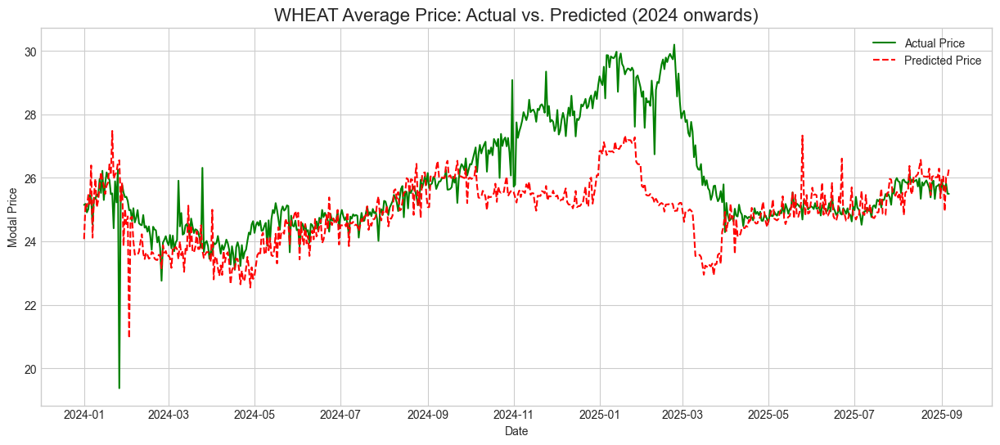


--- Training model for: TOMATO ---
Training data from 2021-01-31 to 2023-12-31
Testing data from 2024-01-01 to 2025-09-06
✅ Model for TOMATO trained and stored.

--- Evaluation Results for TOMATO ---
R-squared (R²): 0.789
Mean Absolute Error (MAE): 2.78
--------------------------------------


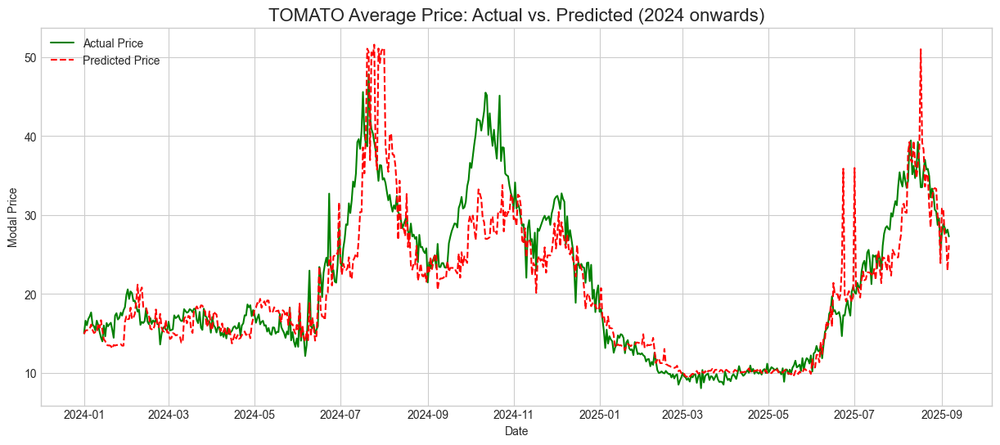

In [43]:
predictor = CommodityPricePredictor(df_final)

# 2. Train a model for 'CABBAGE'.
# It will automatically train and show you the evaluation results and plot.
predictor.train(commodity='CABBAGE')

# 3. Train a model for another commodity, like 'TOMATO'.
predictor.train(commodity='TOMATO')



In [23]:
# 4. Now, predict a future price for a commodity you've trained.
future_price = predictor.predict_future(
    prediction_date_str='2024-01-01',
    commodity='CABBAGE'
)

⚠️ Could not generate features for 2024-01-01. Date may be too far from data.


C:\Users\WELCOME\AppData\Local\Temp\ipykernel_12480\740154514.py:153: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_extended = pd.concat([df_daily, future_df])


## Final

In [24]:
# import pandas as pd
# import numpy as np
# import matplotlib.pyplot as plt
# import xgboost as xgb
# from sklearn.metrics import mean_absolute_error, r2_score

# class CommodityPricePredictor:
#     """
#     Trains a single, global XGBoost model to predict prices based on
#     commodity, state, apmc, and date.
#     """
#     def __init__(self, df):
#         if not isinstance(df.index, pd.DatetimeIndex):
#             raise TypeError("DataFrame index must be a DatetimeIndex.")
#         self.df_full = df.copy()
#         self.model = None
#         self.mappers = {}
#         self.prepared_data = None
#         print("✅ Predictor initialized in Single-Model Mode.")

#     def _prepare_data(self):
#         """
#         Performs all feature engineering on the entire dataset.
#         This is the most crucial step.
#         """
#         df = self.df_full.copy()

#         # 1. Encode all categorical features
#         for col in ['commodity', 'state', 'apmc']:
#             df[f'{col}_code'] = df[col].astype('category').cat.codes
#             self.mappers[col] = dict(enumerate(df[col].astype('category').cat.categories))

#         # 2. Create time-based features
#         df['dayofweek'] = df.index.dayofweek
#         df['dayofyear'] = df.index.dayofyear
#         df['month'] = df.index.month
#         df['year'] = df.index.year
#         df['weekofyear'] = df.index.isocalendar().week.astype(int)

#         # 3. Create lag/rolling features *per item* to prevent data leakage
#         # This is an advanced step that calculates lags for each time series independently
#         df = df.sort_index()
#         grouped = df.groupby(['commodity_code', 'state_code', 'apmc_code'])
#         df['price_lag_7'] = grouped['modal_price'].shift(7)
#         df['price_lag_30'] = grouped['modal_price'].shift(30)
#         df['rolling_mean_30'] = grouped['modal_price'].shift(1).rolling(window=30).mean()

#         # 4. Store the fully prepared data and drop rows with NaNs
#         self.prepared_data = df.dropna()
#         print("✅ Data preparation and feature engineering complete.")

#     def train(self):
#         """
#         Trains the single, global XGBoost model.
#         """
#         self._prepare_data() # Prepare the entire dataset

#         # Split data: train up to 2023 end, test on 2024+
#         train_df = self.prepared_data.loc[self.prepared_data.index < '2024-01-01']
#         test_df = self.prepared_data.loc[self.prepared_data.index >= '2024-01-01']

#         print(f"Training data from {train_df.index.min().date()} to {train_df.index.max().date()}")
#         print(f"Testing data from {test_df.index.min().date()} to {test_df.index.max().date()}")

#         FEATURES = [col for col in self.prepared_data.columns if col not in ['modal_price', 'commodity', 'state', 'apmc']]
#         TARGET = 'modal_price'

#         X_train, y_train = train_df[FEATURES], train_df[TARGET]
#         X_test, y_test = test_df[FEATURES], test_df[TARGET]

#         self.model = xgb.XGBRegressor(
#             n_estimators=1000,
#             learning_rate=0.01,
#             eval_metric='mae',
#             early_stopping_rounds=25,
#             n_jobs=-1 # Use all available CPU cores
#         )

#         print("--- Training Global Model ---")
#         self.model.fit(X_train, y_train,
#                        eval_set=[(X_test, y_test)],
#                        verbose=100)
#         print("✅ Global model trained.")
#         self.evaluate(test_df)

#     def evaluate(self, test_df):
#         FEATURES = [col for col in test_df.columns if col not in ['modal_price', 'commodity', 'state', 'apmc']]
#         X_test, y_test = test_df[FEATURES], test_df[TARGET]
#         predictions = self.model.predict(X_test)
#         r2 = r2_score(y_test, predictions)
#         mae = mean_absolute_error(y_test, predictions)
#         print("\n--- Global Model Evaluation (on 2024+ data) ---")
#         print(f"R-squared (R²): {r2:.3f}")
#         print(f"Mean Absolute Error (MAE): {mae:.2f}")
#         print("---------------------------------------------")

#     def predict(self, prediction_date_str, commodity, state, apmc):
#         """
#         Predicts price for a given date, commodity, state, and APMC.
#         If the date exists in the data, it also evaluates the prediction.
#         """
#         if self.model is None:
#             print("❌ Error: Model has not been trained yet. Please run predictor.train()")
#             return
    
#         prediction_date = pd.to_datetime(prediction_date_str).normalize()
    
#         mask = (self.prepared_data.index == prediction_date) & \
#                 (self.prepared_data['commodity'] == commodity) & \
#                 (self.prepared_data['state'] == state) & \
#                 (self.prepared_data['apmc'] == apmc)
        
#         target_row = self.prepared_data[mask]
    
#         if not target_row.empty:
#             # --- SCENARIO 1: DATA EXISTS (EVALUATION MODE) ---
#             print(f"🔍 Found historical data for {prediction_date.date()}. Running in evaluation mode.")
#             actual_price = target_row['modal_price'].values[0]
#             FEATURES = [col for col in self.prepared_data.columns if col not in ['modal_price', 'commodity', 'state', 'apmc']]
#             input_features = target_row[FEATURES]
#             predicted_price = self.model.predict(input_features)[0]
#             error = abs(actual_price - predicted_price)
            
#             print("\n--- Single Point Evaluation ---")
#             print(f"  Actual Price:    {actual_price:.2f}")
#             print(f"  Predicted Price: {predicted_price:.2f}")
#             print(f"  Absolute Error:  {error:.2f}")
#             print("-----------------------------")
#             return predicted_price
    
#         else:
#             # --- SCENARIO 2: FUTURE OR UNSEEN DATA (PREDICTION MODE) ---
#             print(f"🔮 No historical data found for {prediction_date.date()}. Running in prediction mode.")
            
#             series_mask = (self.prepared_data['commodity'] == commodity) & \
#                           (self.prepared_data['state'] == state) & \
#                           (self.prepared_data['apmc'] == apmc)
#             series_data = self.prepared_data[series_mask]
    
#             # 🚀 --- THIS IS THE FIX --- 🚀
#             # Check if this series has any data at all before trying to predict
#             if series_data.empty:
#                 print(f"❌ Error: Cannot predict. The combination of '{commodity}' in '{apmc}', '{state}' was not found in the trained dataset.")
#                 return None
#             # 🚀 --- END OF FIX --- 🚀
    
#             input_df = pd.DataFrame(index=[prediction_date])
#             input_df['dayofweek'] = input_df.index.dayofweek
#             input_df['dayofyear'] = input_df.index.dayofyear
#             input_df['month'] = input_df.index.month
#             input_df['year'] = input_df.index.year
#             input_df['weekofyear'] = input_df.index.isocalendar().week.astype(int)
    
#             reverse_mappers = {col: {v: k for k, v in self.mappers[col].items()} for col in self.mappers}
#             try:
#                 input_df['commodity_code'] = reverse_mappers['commodity'][commodity]
#                 input_df['state_code'] = reverse_mappers['state'][state]
#                 input_df['apmc_code'] = reverse_mappers['apmc'][apmc]
#             except KeyError as e:
#                 print(f"❌ Error: Unknown category '{e.args[0]}'. It was not in the training data.")
#                 return
    
#             last_known_data = series_data.iloc[-1]
#             input_df['price_lag_7'] = last_known_data['modal_price']
#             input_df['price_lag_30'] = last_known_data['modal_price']
#             input_df['rolling_mean_30'] = last_known_data['rolling_mean_30']
    
#             FEATURES = [col for col in self.prepared_data.columns if col not in ['modal_price', 'commodity', 'state', 'apmc']]
            
#             predicted_price = self.model.predict(input_df[FEATURES])[0]
#             print(f"📈 Predicted price for {commodity} in {apmc}, {state} on {prediction_date.date()}: {predicted_price:.2f}")
#             return predicted_price
        

In [25]:
# predictor = CommodityPricePredictor(df_final)

# # 2. Train the single, global model.
# # This will prepare all data and train the model on data before 2024.
# # It will also automatically evaluate it on data from 2024 onwards.
# predictor.train()

# # 3. Predict a date that EXISTS in your dataset to see the evaluation


# # # 4. Predict a date in the FUTURE
# # print("\n--- Example 2: Predicting a date in the future ---")
# # predictor.predict(
# #     prediction_date_str='2025-11-01', # A future date
# #     commodity='WHEAT',
# #     state='UTTAR PRADESH',
# #     apmc='DOONI'
# # )

✅ Predictor initialized in Single-Model Mode.
✅ Data preparation and feature engineering complete.
Training data from 2021-01-31 to 2023-12-31
Testing data from 2024-01-01 to 2025-09-06
--- Training Global Model ---
[0]	validation_0-mae:95.50663
[100]	validation_0-mae:36.52978
[200]	validation_0-mae:16.89883
[300]	validation_0-mae:10.91484
[400]	validation_0-mae:9.55065
[429]	validation_0-mae:9.69309
✅ Global model trained.

--- Global Model Evaluation (on 2024+ data) ---
R-squared (R²): 0.937
Mean Absolute Error (MAE): 9.52
---------------------------------------------


In [26]:
# import pandas as pd
# import numpy as np
# import matplotlib.pyplot as plt
# import xgboost as xgb
# from sklearn.metrics import mean_absolute_error, r2_score

# class CommodityPricePredictor:
#     """
#     Trains a single, global XGBoost model to predict prices and find optimal selling dates.
#     """
#     def __init__(self, df):
#         if not isinstance(df.index, pd.DatetimeIndex):
#             raise TypeError("DataFrame index must be a DatetimeIndex.")
#         self.df_full = df.copy()
#         self.model = None
#         self.mappers = {}
#         self.prepared_data = None
#         self.feature_names = [] # To store the correct list of features
#         print("✅ Predictor initialized in Single-Model Mode.")

#     def _prepare_data(self):
#         df = self.df_full.copy()
#         for col in ['commodity', 'state', 'apmc']:
#             df[f'{col}_code'] = df[col].astype('category').cat.codes
#             self.mappers[col] = dict(enumerate(df[col].astype('category').cat.categories))
#         df['dayofweek'] = df.index.dayofweek
#         df['dayofyear'] = df.index.dayofyear
#         df['month'] = df.index.month
#         df['year'] = df.index.year
#         df['weekofyear'] = df.index.isocalendar().week.astype(int)
#         df = df.sort_index()
#         grouped = df.groupby(['commodity_code', 'state_code', 'apmc_code'])
#         df['price_lag_7'] = grouped['modal_price'].shift(7)
#         df['price_lag_30'] = grouped['modal_price'].shift(30)
#         df['rolling_mean_30'] = grouped['modal_price'].shift(1).rolling(window=30).mean()
#         self.prepared_data = df.dropna()
#         print("✅ Data preparation and feature engineering complete.")

#     def train(self):
#         self._prepare_data()
#         train_df = self.prepared_data.loc[self.prepared_data.index < '2024-01-01']
#         test_df = self.prepared_data.loc[self.prepared_data.index >= '2024-01-01']
#         print(f"Training data from {train_df.index.min().date()} to {train_df.index.max().date()}")
#         print(f"Testing data from {test_df.index.min().date()} to {test_df.index.max().date()}")

#         # 🚀 --- THIS IS THE FIX --- 🚀
#         # Explicitly define the features we want to train on. This prevents
#         # columns like 'min_price' or 'max_price' from being included.
#         self.feature_names = [
#             'dayofweek', 'dayofyear', 'month', 'year', 'weekofyear',
#             'commodity_code', 'state_code', 'apmc_code',
#             'price_lag_7', 'price_lag_30', 'rolling_mean_30'
#         ]
#         # 🚀 --- END OF FIX --- 🚀

#         TARGET = 'modal_price'
#         X_train, y_train = train_df[self.feature_names], train_df[TARGET]
#         X_test, y_test = test_df[self.feature_names], test_df[TARGET]
        
#         self.model = xgb.XGBRegressor(n_estimators=1000, learning_rate=0.01, eval_metric='mae', early_stopping_rounds=25, n_jobs=-1)
#         print("--- Training Global Model ---")
#         self.model.fit(X_train, y_train, eval_set=[(X_test, y_test)], verbose=100)
#         print("✅ Global model trained.")
#         self.evaluate(test_df)

#     def evaluate(self, test_df):
#         TARGET = 'modal_price'
#         X_test, y_test = test_df[self.feature_names], test_df[TARGET]
#         predictions = self.model.predict(X_test)
#         r2 = r2_score(y_test, predictions)
#         mae = mean_absolute_error(y_test, predictions)
#         print(f"\n--- Global Model Evaluation (on 2024+ data) ---")
#         print(f"R-squared (R²): {r2:.3f}")
#         print(f"Mean Absolute Error (MAE): {mae:.2f}")
#         print("---------------------------------------------")

#     def predict(self, prediction_date_str, commodity, state, apmc):
#         if self.model is None: return print("❌ Error: Model has not been trained yet.")
#         prediction_date = pd.to_datetime(prediction_date_str).normalize()
#         mask = (self.prepared_data.index == prediction_date) & (self.prepared_data['commodity'] == commodity) & (self.prepared_data['state'] == state) & (self.prepared_data['apmc'] == apmc)
#         target_row = self.prepared_data[mask]
#         if not target_row.empty:
#             print(f"🔍 Found historical data for {prediction_date.date()}. Running in evaluation mode.")
#             actual_price = target_row['modal_price'].values[0]
#             input_features = target_row[self.feature_names]
#             predicted_price = self.model.predict(input_features)[0]
#             error = abs(actual_price - predicted_price)
#             print(f"\n--- Single Point Evaluation ---\n  Actual Price:    {actual_price:.2f}\n  Predicted Price: {predicted_price:.2f}\n  Absolute Error:  {error:.2f}\n-----------------------------")
#             return predicted_price
#         else:
#             print(f"🔮 No historical data found. Running in prediction mode.")
#             series_mask = (self.prepared_data['commodity'] == commodity) & (self.prepared_data['state'] == state) & (self.prepared_data['apmc'] == apmc)
#             series_data = self.prepared_data[series_mask]
#             if series_data.empty: return print(f"❌ Error: Cannot predict. The combination of '{commodity}' in '{apmc}', '{state}' was not found in the trained dataset.")
#             input_df = pd.DataFrame(index=[prediction_date])
#             input_df['dayofweek'], input_df['dayofyear'], input_df['month'], input_df['year'] = input_df.index.dayofweek, input_df.index.dayofyear, input_df.index.month, input_df.index.year
#             input_df['weekofyear'] = input_df.index.isocalendar().week.astype(int)
#             reverse_mappers = {col: {v: k for k, v in self.mappers[col].items()} for col in self.mappers}
#             try:
#                 input_df['commodity_code'], input_df['state_code'], input_df['apmc_code'] = reverse_mappers['commodity'][commodity], reverse_mappers['state'][state], reverse_mappers['apmc'][apmc]
#             except KeyError as e: return print(f"❌ Error: Unknown category '{e.args[0]}'.")
#             last_known_data = series_data.iloc[-1]
#             input_df['price_lag_7'], input_df['price_lag_30'], input_df['rolling_mean_30'] = last_known_data['modal_price'], last_known_data['modal_price'], last_known_data['rolling_mean_30']
#             predicted_price = self.model.predict(input_df[self.feature_names])[0]
#             print(f"📈 Predicted price for {commodity} in {apmc}, {state} on {prediction_date.date()}: {predicted_price:.2f}")
#             return predicted_price

#     def find_best_selling_date(self, commodity, state, apmc=None, forecast_days=30):
#         if self.model is None: return print("❌ Error: Model has not been trained yet.")
#         print(f"\nForecasting next {forecast_days} days for '{commodity}' in '{state}'...")
#         if apmc: apmc_list = [apmc]
#         else:
#             mask = (self.prepared_data['commodity'] == commodity) & (self.prepared_data['state'] == state)
#             apmc_list = self.prepared_data[mask]['apmc'].unique()
#             if len(apmc_list) == 0: return print(f"❌ Error: No historical data found for '{commodity}' in '{state}'.")
#             print(f"No specific APMC provided. Analyzing {len(apmc_list)} APMC(s).")
#         for current_apmc in apmc_list:
#             try:
#                 series_mask = (self.prepared_data['commodity'] == commodity) & (self.prepared_data['state'] == state) & (self.prepared_data['apmc'] == current_apmc)
#                 history = self.prepared_data[series_mask].copy()
#                 if history.empty: print(f"\n--- Skipping {current_apmc} (No training data) ---"); continue
#                 future_dates = pd.date_range(start=pd.Timestamp.now().normalize() + pd.Timedelta(days=1), periods=forecast_days)
#                 predictions = []
#                 for date in future_dates:
#                     last_known_row = history.iloc[-1]
#                     input_df = pd.DataFrame(index=[date])
#                     input_df['dayofweek'], input_df['dayofyear'], input_df['month'], input_df['year'] = input_df.index.dayofweek, input_df.index.dayofyear, input_df.index.month, input_df.index.year
#                     input_df['weekofyear'] = input_df.index.isocalendar().week.astype(int)
#                     input_df['commodity_code'], input_df['state_code'], input_df['apmc_code'] = last_known_row['commodity_code'], last_known_row['state_code'], last_known_row['apmc_code']
#                     input_df['price_lag_7'] = history['modal_price'].iloc[-7] if len(history) >= 7 else last_known_row['modal_price']
#                     input_df['price_lag_30'] = history['modal_price'].iloc[-30] if len(history) >= 30 else last_known_row['modal_price']
#                     input_df['rolling_mean_30'] = history['modal_price'].rolling(window=30).mean().iloc[-1]
#                     predicted_price = self.model.predict(input_df[self.feature_names])[0]
#                     predictions.append(predicted_price)
#                     new_row_data = input_df[self.feature_names].iloc[0].to_dict()
#                     new_row_data['modal_price'] = predicted_price
#                     new_row_df = pd.DataFrame(new_row_data, index=[date])
#                     history = pd.concat([history, new_row_df])
#                 forecast_df = pd.DataFrame({'date': future_dates, 'predicted_price': predictions})
#                 best_day = forecast_df.loc[forecast_df['predicted_price'].idxmax()]
#                 print(f"\n--- Results for APMC: {current_apmc} ---")
#                 print(f"💰 Best day to sell is: {best_day['date'].strftime('%A, %B %d, %Y')}")
#                 print(f"📈 With a predicted price of: {best_day['predicted_price']:.2f}")
#             except Exception as e:
#                 print(f"\n--- Could not generate forecast for {current_apmc}: {e} ---")

In [27]:
# predictor = CommodityPricePredictor(df_final)


# predictor.train()



✅ Predictor initialized in Single-Model Mode.
✅ Data preparation and feature engineering complete.
Training data from 2021-01-31 to 2023-12-31
Testing data from 2024-01-01 to 2025-09-06
--- Training Global Model ---
[0]	validation_0-mae:95.62219
[100]	validation_0-mae:45.75789
[200]	validation_0-mae:30.61478
[300]	validation_0-mae:26.57391
[400]	validation_0-mae:25.84329
[418]	validation_0-mae:25.84929
✅ Global model trained.

--- Global Model Evaluation (on 2024+ data) ---
R-squared (R²): 0.662
Mean Absolute Error (MAE): 25.84
---------------------------------------------


In [28]:
# # --- Example 2: Find the best selling date for ALL APMCs of a commodity in a state ---
# predictor.find_best_selling_date(
#     commodity='WHEAT',
#     state='UTTAR PRADESH'
# )

In [29]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import xgboost as xgb
from sklearn.metrics import mean_absolute_error, r2_score

class CommodityPricePredictor:
    """
    Trains a single, global XGBoost model to predict prices and find optimal selling dates.
    """
    def __init__(self, df):
        if not isinstance(df.index, pd.DatetimeIndex):
            raise TypeError("DataFrame index must be a DatetimeIndex.")
        self.df_full = df.copy()
        self.model = None
        self.mappers = {}
        self.prepared_data = None
        self.feature_names = [] # To store the correct list of features
        print("✅ Predictor initialized in Single-Model Mode.")

    def _prepare_data(self):
        df = self.df_full.copy()
        for col in ['commodity', 'state', 'apmc']:
            df[f'{col}_code'] = df[col].astype('category').cat.codes
            self.mappers[col] = dict(enumerate(df[col].astype('category').cat.categories))
        df['dayofweek'] = df.index.dayofweek
        df['dayofyear'] = df.index.dayofyear
        df['month'] = df.index.month
        df['year'] = df.index.year
        df['weekofyear'] = df.index.isocalendar().week.astype(int)
        df = df.sort_index()
        grouped = df.groupby(['commodity_code', 'state_code', 'apmc_code'])
        df['price_lag_7'] = grouped['modal_price'].shift(7)
        df['price_lag_30'] = grouped['modal_price'].shift(30)
        df['rolling_mean_30'] = grouped['modal_price'].shift(1).rolling(window=30).mean()
        self.prepared_data = df.dropna()
        print("✅ Data preparation and feature engineering complete.")

    def train(self):
        self._prepare_data()
        train_df = self.prepared_data.loc[self.prepared_data.index < '2024-01-01']
        test_df = self.prepared_data.loc[self.prepared_data.index >= '2024-01-01']
        print(f"Training data from {train_df.index.min().date()} to {train_df.index.max().date()}")
        print(f"Testing data from {test_df.index.min().date()} to {test_df.index.max().date()}")
        self.feature_names = [
            'dayofweek', 'dayofyear', 'month', 'year', 'weekofyear',
            'commodity_code', 'state_code', 'apmc_code',
            'price_lag_7', 'price_lag_30', 'rolling_mean_30'
        ]
        TARGET = 'modal_price'
        X_train, y_train = train_df[self.feature_names], train_df[TARGET]
        X_test, y_test = test_df[self.feature_names], test_df[TARGET]
        self.model = xgb.XGBRegressor(n_estimators=1000, learning_rate=0.01, eval_metric='mae', early_stopping_rounds=25, n_jobs=-1)
        print("--- Training Global Model ---")
        self.model.fit(X_train, y_train, eval_set=[(X_test, y_test)], verbose=100)
        print("✅ Global model trained.")
        self.evaluate(test_df)

    def evaluate(self, test_df):
        TARGET = 'modal_price'
        X_test, y_test = test_df[self.feature_names], test_df[TARGET]
        predictions = self.model.predict(X_test)
        r2 = r2_score(y_test, predictions)
        mae = mean_absolute_error(y_test, predictions)
        print(f"\n--- Global Model Evaluation (on 2024+ data) ---")
        print(f"R-squared (R²): {r2:.3f}")
        print(f"Mean Absolute Error (MAE): {mae:.2f}")
        print("---------------------------------------------")

    def predict(self, prediction_date_str, commodity, state, apmc):
        if self.model is None: return print("❌ Error: Model has not been trained yet.")
        prediction_date = pd.to_datetime(prediction_date_str).normalize()
        mask = (self.prepared_data.index == prediction_date) & (self.prepared_data['commodity'] == commodity) & (self.prepared_data['state'] == state) & (self.prepared_data['apmc'] == apmc)
        target_row = self.prepared_data[mask]
        if not target_row.empty:
            print(f"🔍 Found historical data for {prediction_date.date()}. Running in evaluation mode.")
            actual_price = target_row['modal_price'].values[0]
            input_features = target_row[self.feature_names]
            predicted_price = self.model.predict(input_features)[0]
            error = abs(actual_price - predicted_price)
            print(f"\n--- Single Point Evaluation ---\n  Actual Price:    {actual_price:.2f}\n  Predicted Price: {predicted_price:.2f}\n  Absolute Error:  {error:.2f}\n-----------------------------")
            return predicted_price
        else:
            print(f"🔮 No historical data found. Running in prediction mode.")
            series_mask = (self.prepared_data['commodity'] == commodity) & (self.prepared_data['state'] == state) & (self.prepared_data['apmc'] == apmc)
            series_data = self.prepared_data[series_mask]
            if series_data.empty: return print(f"❌ Error: Cannot predict. The combination of '{commodity}' in '{apmc}', '{state}' was not found in the trained dataset.")
            input_df = pd.DataFrame(index=[prediction_date])
            input_df['dayofweek'], input_df['dayofyear'], input_df['month'], input_df['year'] = input_df.index.dayofweek, input_df.index.dayofyear, input_df.index.month, input_df.index.year
            input_df['weekofyear'] = input_df.index.isocalendar().week.astype(int)
            reverse_mappers = {col: {v: k for k, v in self.mappers[col].items()} for col in self.mappers}
            try:
                input_df['commodity_code'], input_df['state_code'], input_df['apmc_code'] = reverse_mappers['commodity'][commodity], reverse_mappers['state'][state], reverse_mappers['apmc'][apmc]
            except KeyError as e: return print(f"❌ Error: Unknown category '{e.args[0]}'.")
            last_known_data = series_data.iloc[-1]
            input_df['price_lag_7'], input_df['price_lag_30'], input_df['rolling_mean_30'] = last_known_data['modal_price'], last_known_data['modal_price'], last_known_data['rolling_mean_30']
            predicted_price = self.model.predict(input_df[self.feature_names])[0]
            print(f"📈 Predicted price for {commodity} in {apmc}, {state} on {prediction_date.date()}: {predicted_price:.2f}")
            return predicted_price

    # <<< METHOD UPDATED WITH PLOTTING >>>
    def find_best_selling_date(self, commodity, state, apmc=None, forecast_days=30):
        if self.model is None: return print("❌ Error: Model has not been trained yet.")
        print(f"\nForecasting next {forecast_days} days for '{commodity}' in '{state}'...")
        if apmc: apmc_list = [apmc]
        else:
            mask = (self.prepared_data['commodity'] == commodity) & (self.prepared_data['state'] == state)
            apmc_list = self.prepared_data[mask]['apmc'].unique()
            if len(apmc_list) == 0: return print(f"❌ Error: No historical data found for '{commodity}' in '{state}'.")
            print(f"No specific APMC provided. Analyzing {len(apmc_list)} APMC(s).")
        for current_apmc in apmc_list:
            try:
                series_mask = (self.prepared_data['commodity'] == commodity) & (self.prepared_data['state'] == state) & (self.prepared_data['apmc'] == current_apmc)
                history_orig = self.prepared_data[series_mask].copy()
                if history_orig.empty: print(f"\n--- Skipping {current_apmc} (No training data) ---"); continue
                
                history_recursive = history_orig.copy()
                future_dates = pd.date_range(start=pd.Timestamp.now().normalize() + pd.Timedelta(days=1), periods=forecast_days)
                predictions = []

                for date in future_dates:
                    last_known_row = history_recursive.iloc[-1]
                    input_df = pd.DataFrame(index=[date])
                    input_df['dayofweek'], input_df['dayofyear'], input_df['month'], input_df['year'] = date.dayofweek, date.dayofyear, date.month, date.year
                    input_df['weekofyear'] = date.isocalendar().week
                    input_df['commodity_code'], input_df['state_code'], input_df['apmc_code'] = last_known_row['commodity_code'], last_known_row['state_code'], last_known_row['apmc_code']
                    input_df['price_lag_7'] = history_recursive['modal_price'].iloc[-7] if len(history_recursive) >= 7 else last_known_row['modal_price']
                    input_df['price_lag_30'] = history_recursive['modal_price'].iloc[-30] if len(history_recursive) >= 30 else last_known_row['modal_price']
                    input_df['rolling_mean_30'] = history_recursive['modal_price'].rolling(window=30, min_periods=1).mean().iloc[-1]
                    
                    predicted_price = self.model.predict(input_df[self.feature_names])[0]
                    predictions.append(predicted_price)
                    
                    new_row_data = input_df[self.feature_names].iloc[0].to_dict()
                    new_row_data['modal_price'] = predicted_price
                    new_row_df = pd.DataFrame(new_row_data, index=[date])
                    history_recursive = pd.concat([history_recursive, new_row_df])
                
                forecast_df = pd.DataFrame({'date': future_dates, 'predicted_price': predictions})
                best_day = forecast_df.loc[forecast_df['predicted_price'].idxmax()]

                print(f"\n--- Results for APMC: {current_apmc} ---")
                print(f"💰 Best day to sell is: {best_day['date'].strftime('%A, %B %d, %Y')}")
                print(f"📈 With a predicted price of: {best_day['predicted_price']:.2f}")

                # --- PLOTTING CODE ---
                plt.figure(figsize=(15, 6))
                plt.style.use('seaborn-v0_8-whitegrid')
                
                # Plot last 90 days of actual prices for context
                plt.plot(history_orig.index[-90:], history_orig['modal_price'][-90:], 
                         label='Historical Actual Price', color='royalblue', marker='.', markersize=4)
                
                # Plot the 30-day forecast
                plt.plot(forecast_df['date'], forecast_df['predicted_price'], 
                         label='Forecasted Price', color='red', linestyle='--')
                
                # Highlight the best day to sell
                plt.axvline(x=best_day['date'], color='green', linestyle=':', lw=2,
                            label=f"Best Day: {best_day['date'].strftime('%b %d')}")
                
                plt.title(f"30-Day Price Forecast for {commodity} in {current_apmc}", fontsize=16)
                plt.xlabel("Date")
                plt.ylabel("Predicted Modal Price")
                plt.legend()
                plt.grid(True, which='both', linestyle='--', linewidth=0.5)
                plt.show()

            except Exception as e:
                print(f"\n--- Could not generate forecast for {current_apmc}: {e} ---")

In [30]:
predictor = CommodityPricePredictor(df_final)

# 2. Train the single, global model.
# This will prepare all data and train the model on data before 2024.
# It will also automatically evaluate it on data from 2024 onwards.
predictor.train()



✅ Predictor initialized in Single-Model Mode.
✅ Data preparation and feature engineering complete.
Training data from 2021-01-31 to 2023-12-31
Testing data from 2024-01-01 to 2025-09-06
--- Training Global Model ---
[0]	validation_0-mae:95.62219
[100]	validation_0-mae:45.75789
[200]	validation_0-mae:30.61478
[300]	validation_0-mae:26.57391
[400]	validation_0-mae:25.84329
[418]	validation_0-mae:25.84929
✅ Global model trained.

--- Global Model Evaluation (on 2024+ data) ---
R-squared (R²): 0.662
Mean Absolute Error (MAE): 25.84
---------------------------------------------



Forecasting next 30 days for 'WHEAT' in 'UTTAR PRADESH'...
No specific APMC provided. Analyzing 67 APMC(s).

--- Results for APMC: URAI ---
💰 Best day to sell is: Monday, October 13, 2025
📈 With a predicted price of: 27.74


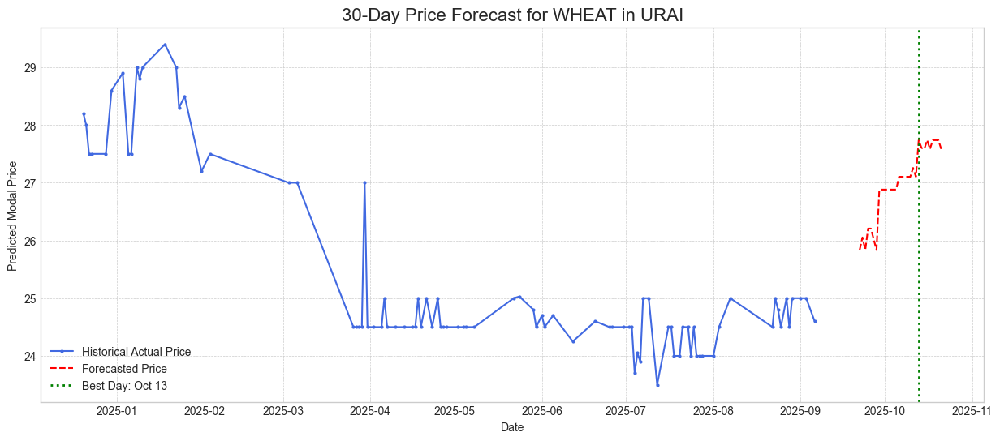


--- Results for APMC: JALAUN ---
💰 Best day to sell is: Monday, October 06, 2025
📈 With a predicted price of: 27.74


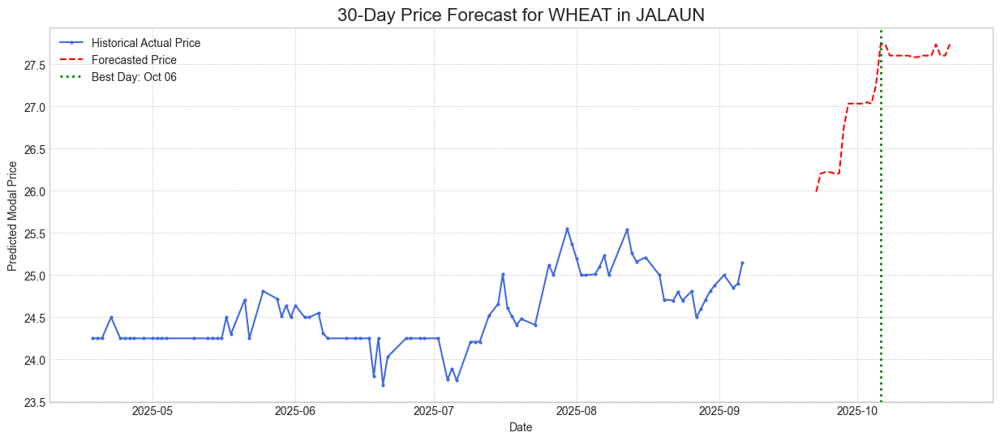


--- Results for APMC: MUSKERA ---
💰 Best day to sell is: Wednesday, October 15, 2025
📈 With a predicted price of: 27.75


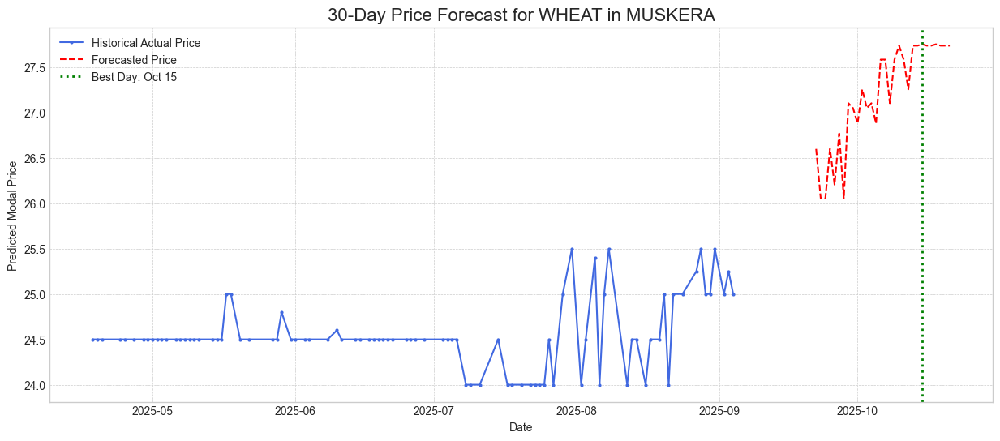


--- Results for APMC: GHAZIABAD ---
💰 Best day to sell is: Tuesday, October 21, 2025
📈 With a predicted price of: 27.84


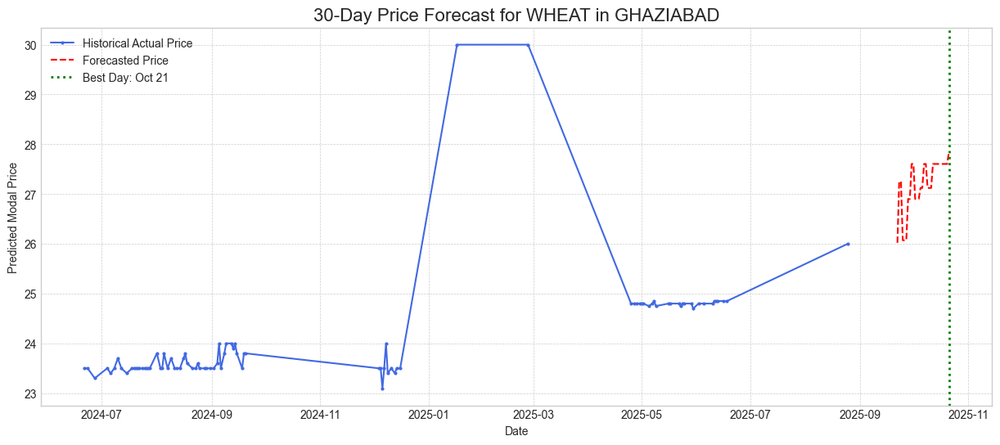


--- Results for APMC: BAHRAICH ---
💰 Best day to sell is: Thursday, October 09, 2025
📈 With a predicted price of: 27.74


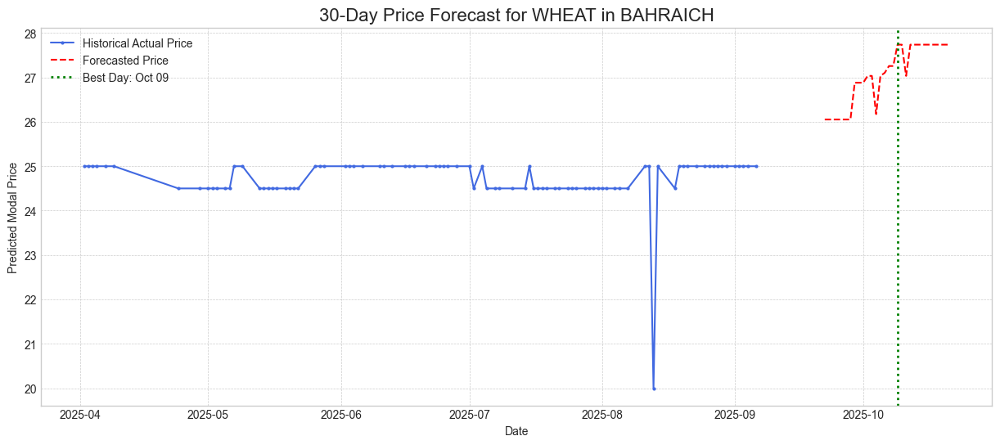


--- Results for APMC: ACHNERA ---
💰 Best day to sell is: Friday, October 10, 2025
📈 With a predicted price of: 27.75


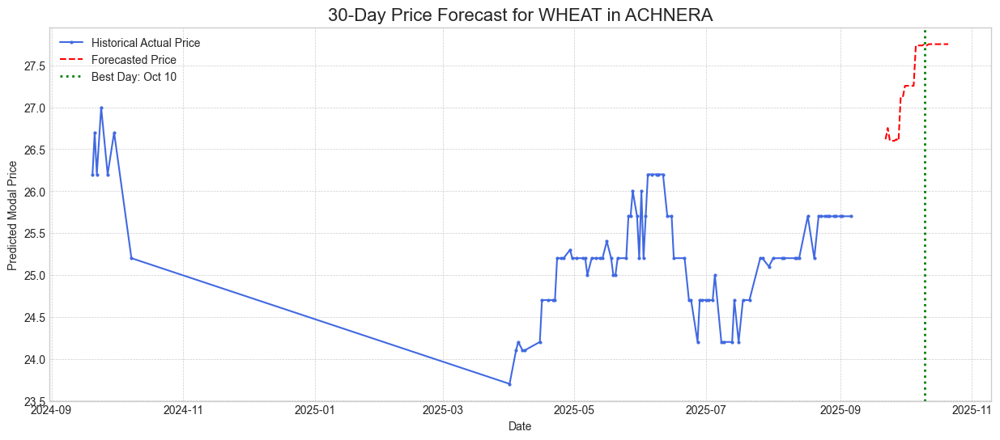


--- Results for APMC: MAHMUDABAD ---
💰 Best day to sell is: Monday, October 06, 2025
📈 With a predicted price of: 27.75


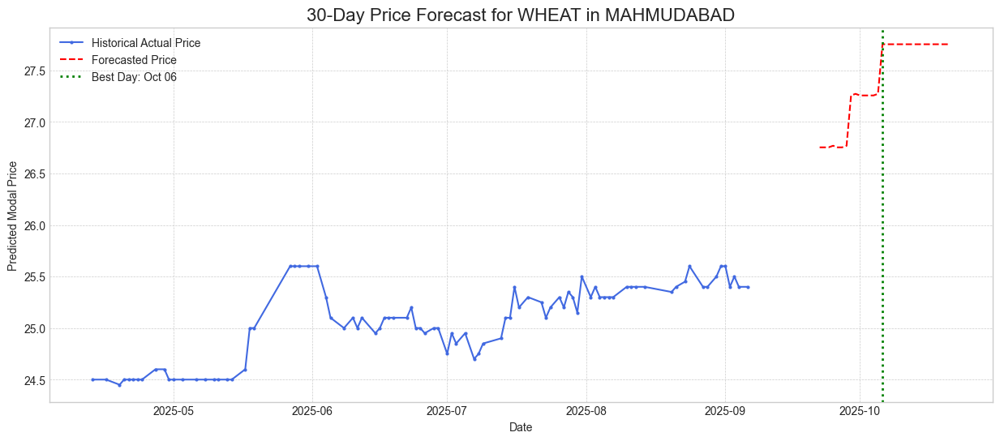


--- Results for APMC: SHIKOHABAD ---
💰 Best day to sell is: Tuesday, October 21, 2025
📈 With a predicted price of: 27.74


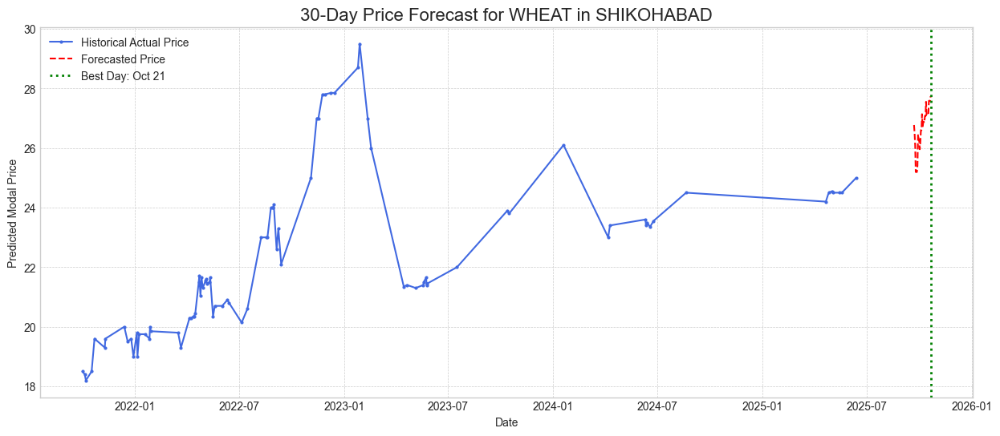


--- Results for APMC: LAKHIMPUR ---
💰 Best day to sell is: Tuesday, October 14, 2025
📈 With a predicted price of: 27.75


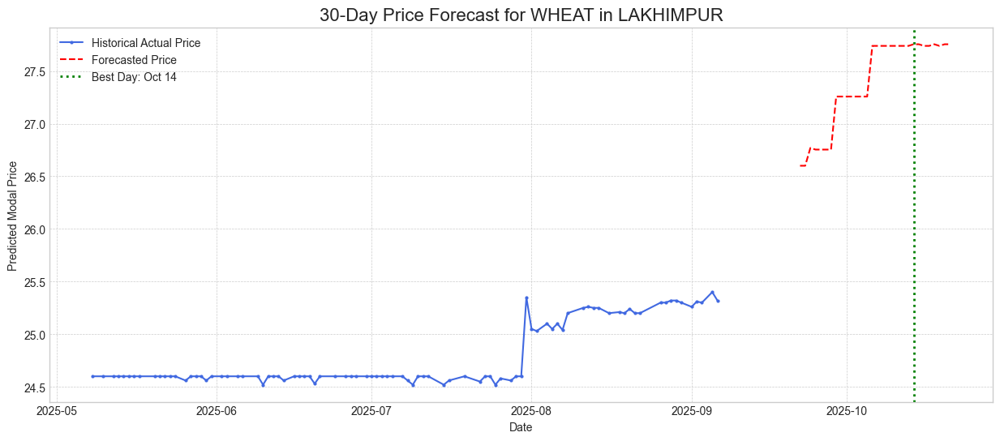


--- Results for APMC: MADHOGANJ ---
💰 Best day to sell is: Tuesday, October 07, 2025
📈 With a predicted price of: 27.74


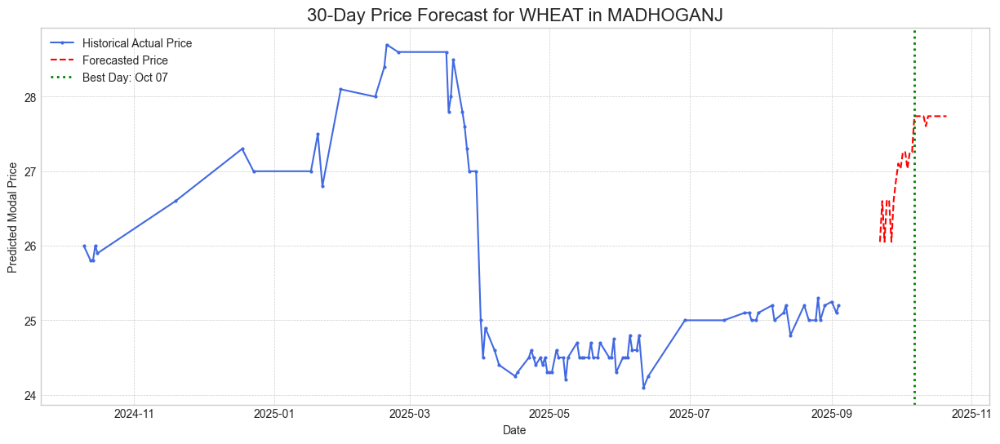


--- Results for APMC: SITAPUR ---
💰 Best day to sell is: Monday, October 13, 2025
📈 With a predicted price of: 27.74


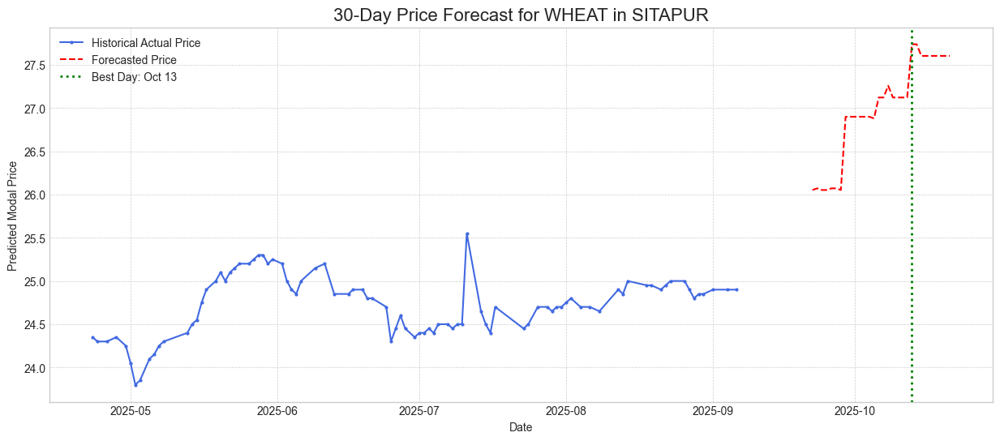


--- Results for APMC: BASTI ---
💰 Best day to sell is: Monday, October 13, 2025
📈 With a predicted price of: 27.75


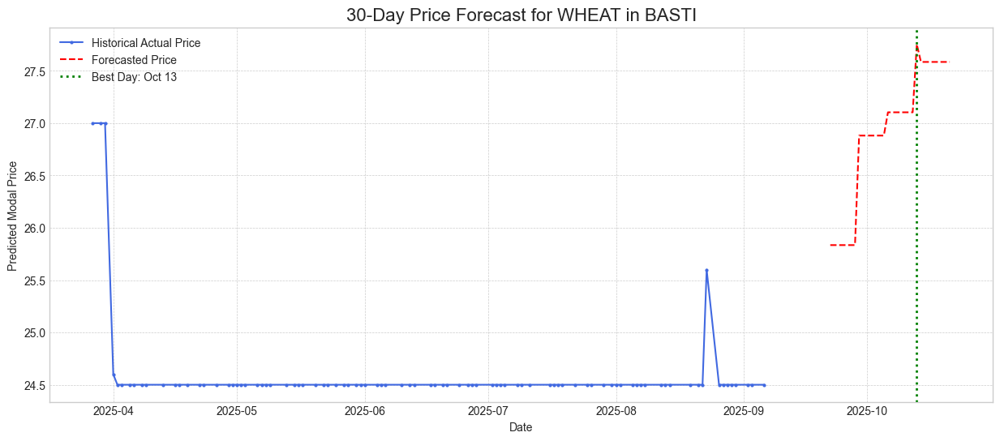


--- Results for APMC: GOLAGOKARNATH ---
💰 Best day to sell is: Tuesday, October 14, 2025
📈 With a predicted price of: 27.75


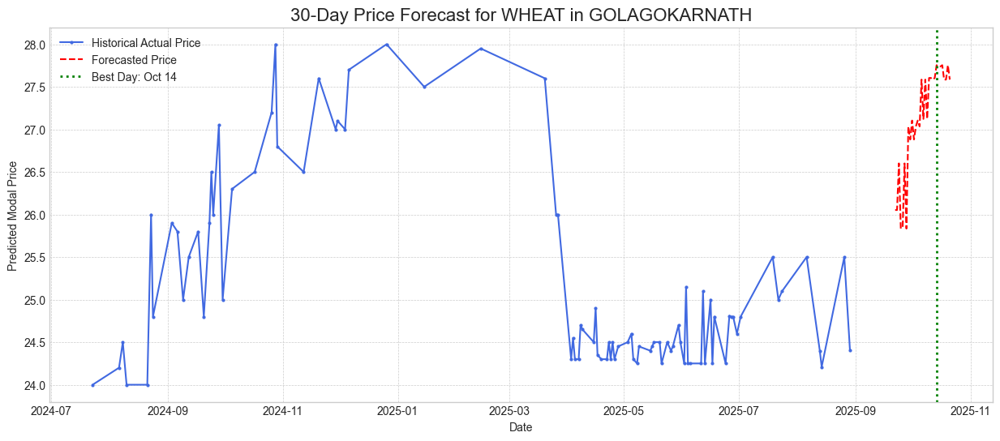


--- Results for APMC: AURAIYA ---
💰 Best day to sell is: Monday, October 06, 2025
📈 With a predicted price of: 27.75


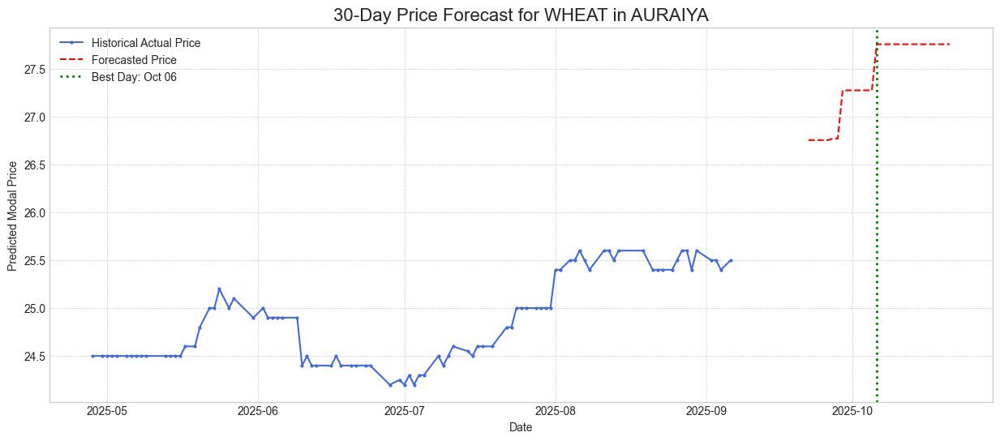


--- Results for APMC: AJUHA ---
💰 Best day to sell is: Sunday, October 19, 2025
📈 With a predicted price of: 27.75


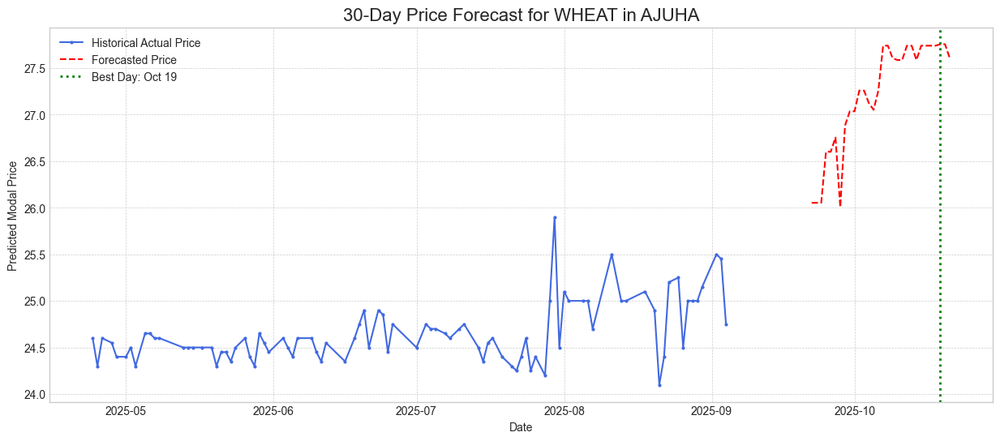


--- Results for APMC: KANPUR ---
💰 Best day to sell is: Monday, October 13, 2025
📈 With a predicted price of: 27.58


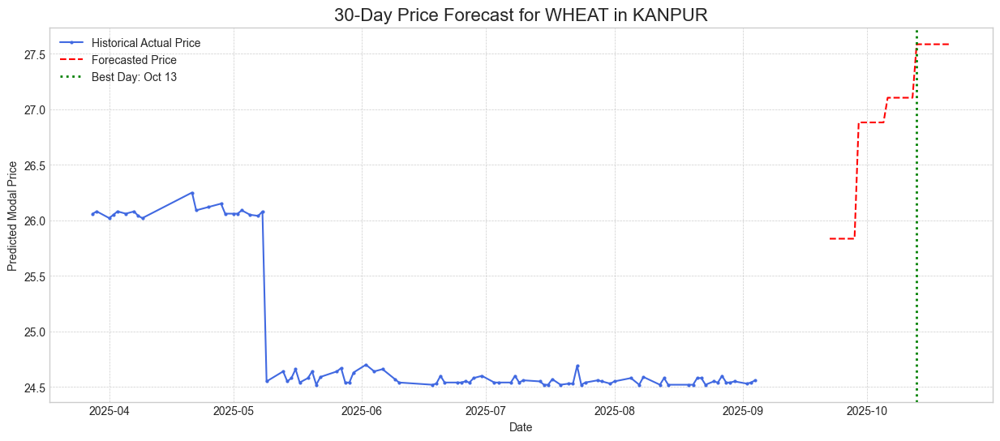


--- Results for APMC: MAURANIPUR ---
💰 Best day to sell is: Tuesday, October 07, 2025
📈 With a predicted price of: 27.74


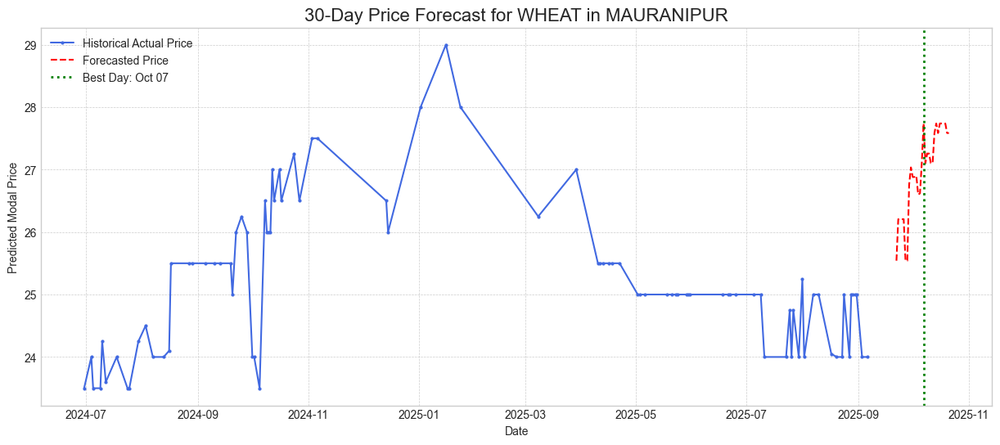


--- Results for APMC: TUNDLA ---
💰 Best day to sell is: Sunday, October 19, 2025
📈 With a predicted price of: 28.26


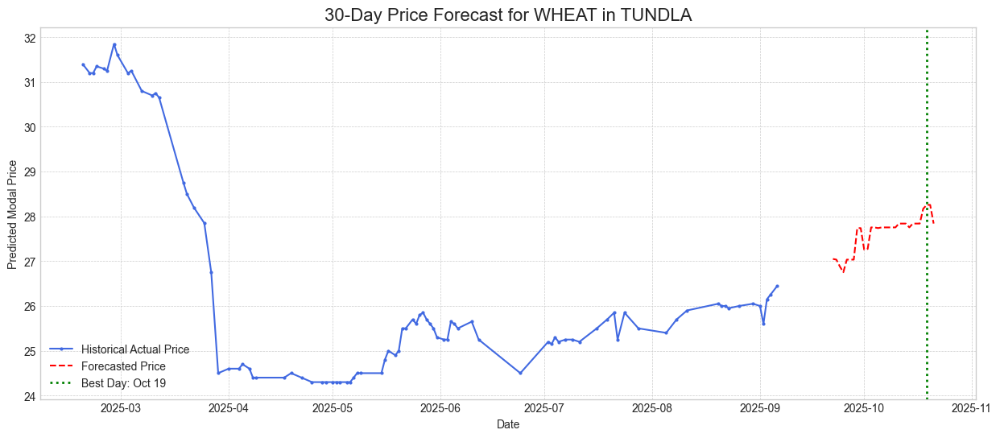


--- Results for APMC: BHARUASUMERPUR ---
💰 Best day to sell is: Monday, October 13, 2025
📈 With a predicted price of: 30.51


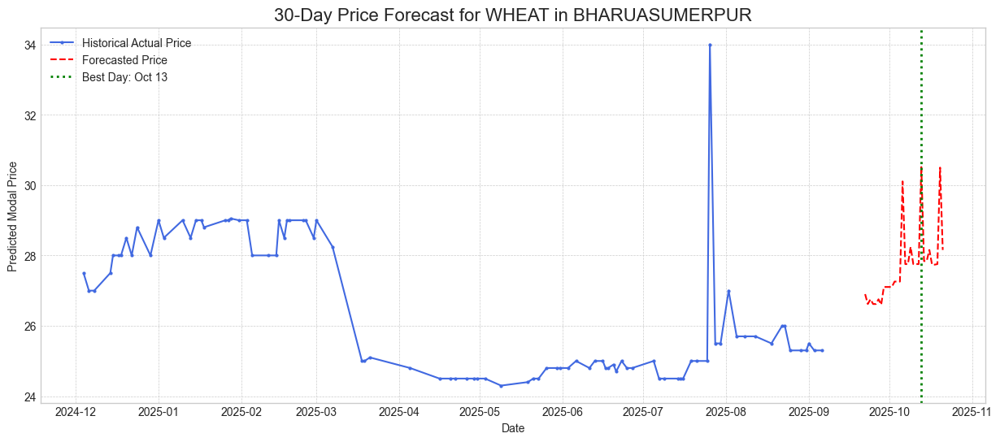


--- Results for APMC: FATEHPUR SIKRI ---
💰 Best day to sell is: Monday, October 06, 2025
📈 With a predicted price of: 27.75


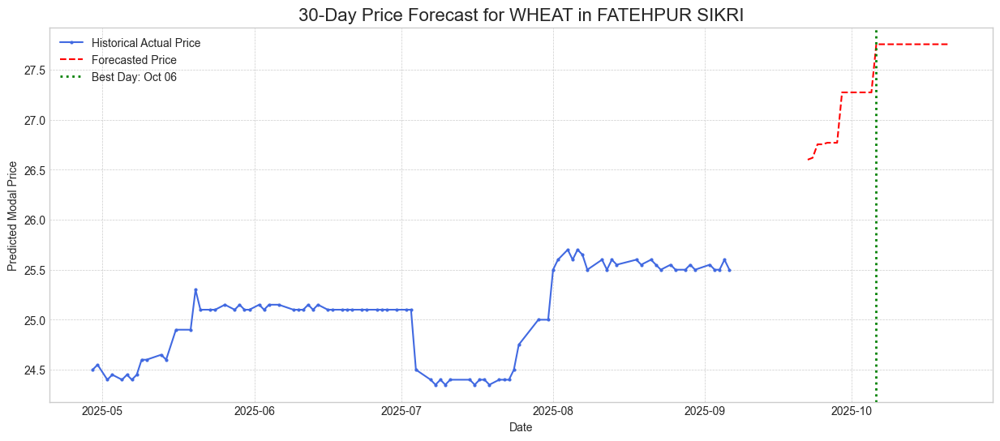


--- Results for APMC: KONCH ---
💰 Best day to sell is: Tuesday, October 07, 2025
📈 With a predicted price of: 27.74


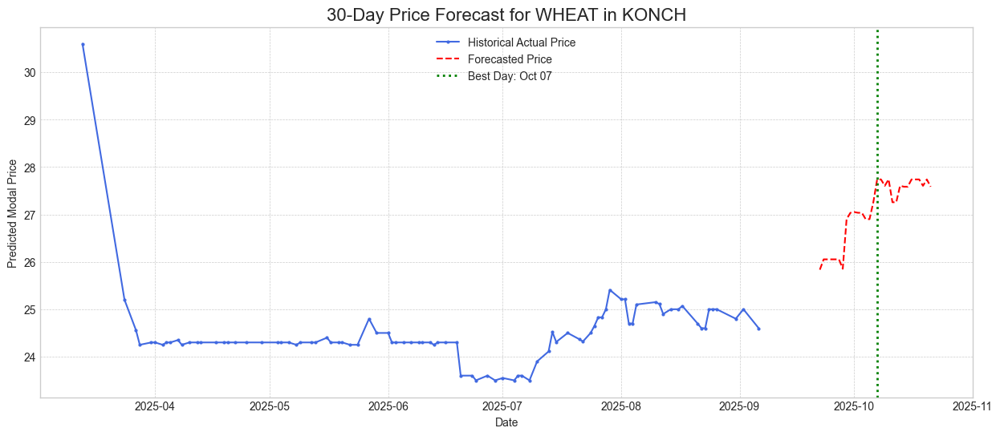


--- Results for APMC: RATH ---
💰 Best day to sell is: Monday, October 13, 2025
📈 With a predicted price of: 27.58


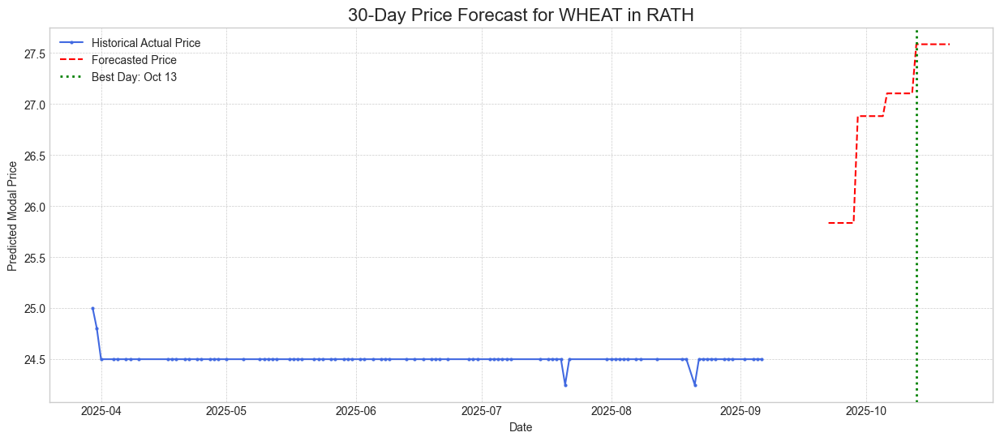


--- Results for APMC: BANGARMAU ---
💰 Best day to sell is: Sunday, October 19, 2025
📈 With a predicted price of: 27.75


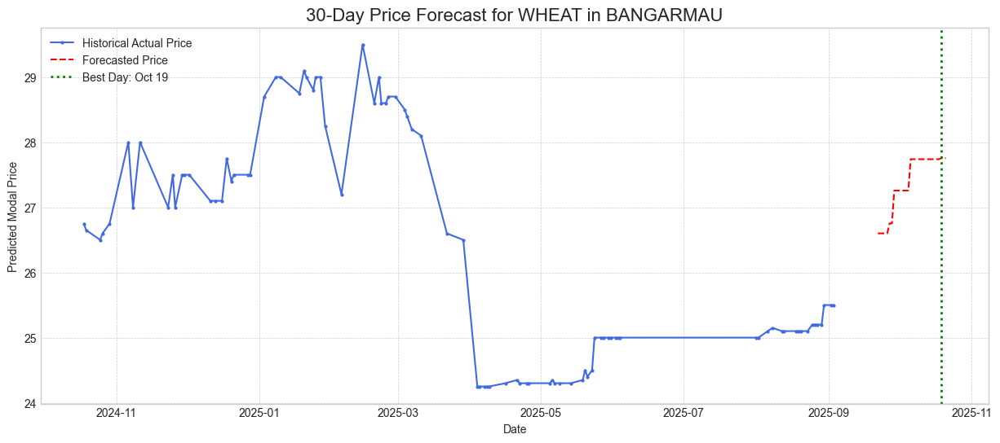


--- Results for APMC: SHAHBAD HARDOI ---
💰 Best day to sell is: Tuesday, October 21, 2025
📈 With a predicted price of: 27.84


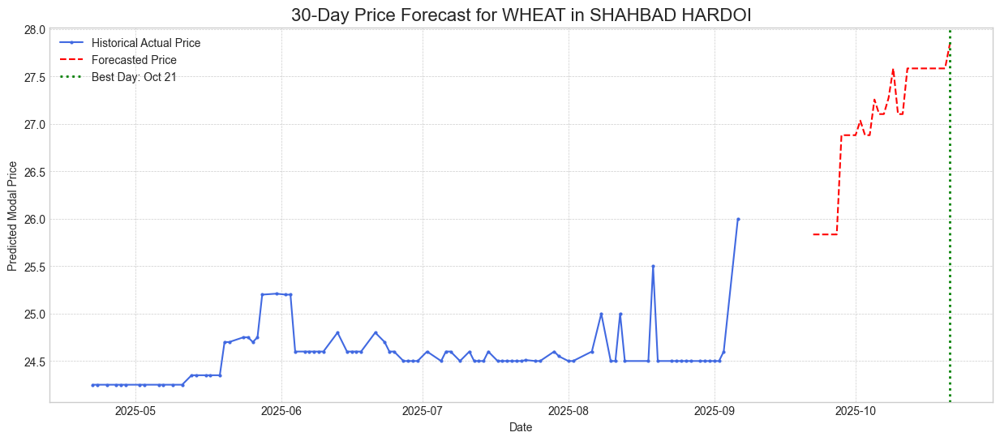


--- Results for APMC: KASGANJ ---
💰 Best day to sell is: Friday, October 10, 2025
📈 With a predicted price of: 27.74


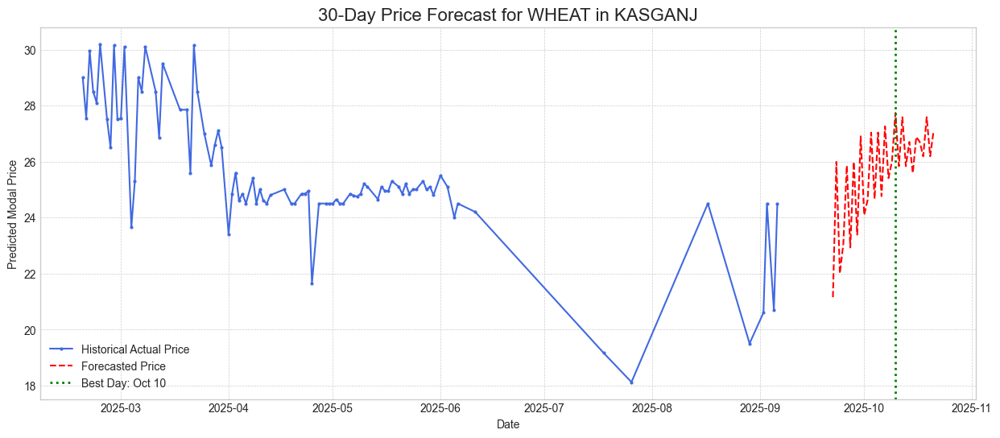


--- Results for APMC: TULSIPUR APMC ---
💰 Best day to sell is: Monday, October 13, 2025
📈 With a predicted price of: 27.58


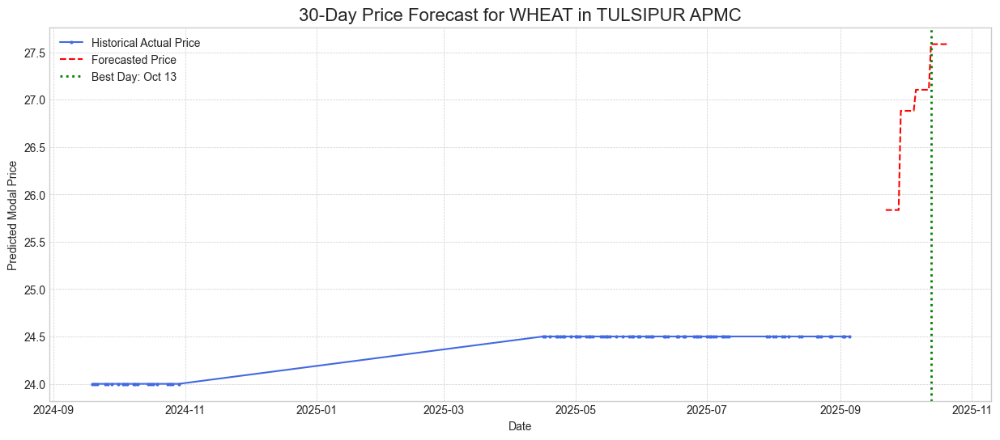


--- Results for APMC: JAIS ---
💰 Best day to sell is: Saturday, October 18, 2025
📈 With a predicted price of: 28.17


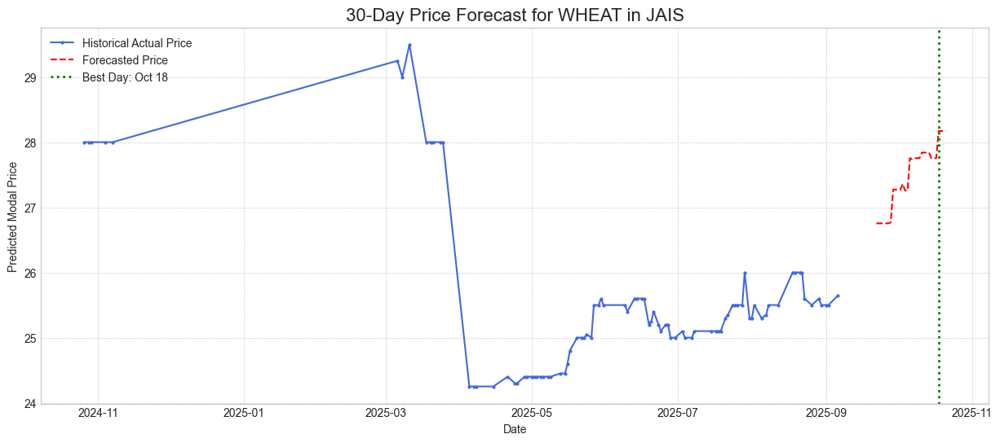


--- Results for APMC: SAHIYAPUR ---
💰 Best day to sell is: Tuesday, October 21, 2025
📈 With a predicted price of: 27.75


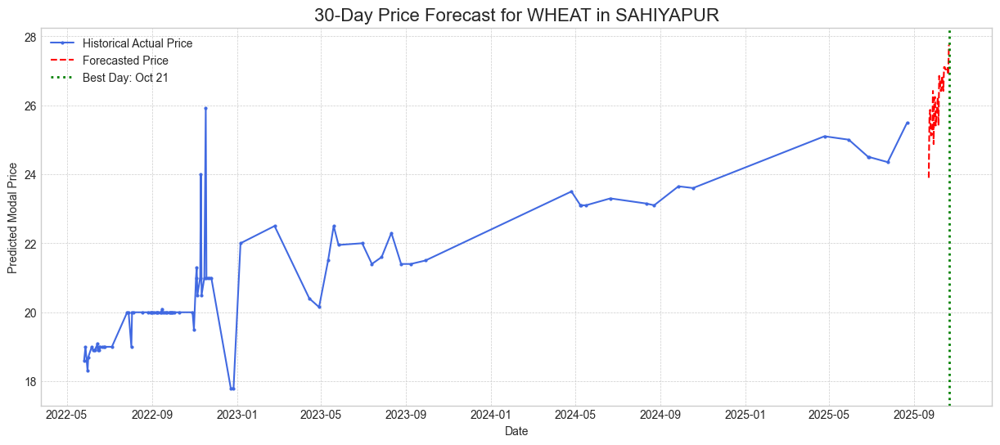


--- Results for APMC: CHARRA ---
💰 Best day to sell is: Thursday, October 09, 2025
📈 With a predicted price of: 27.75


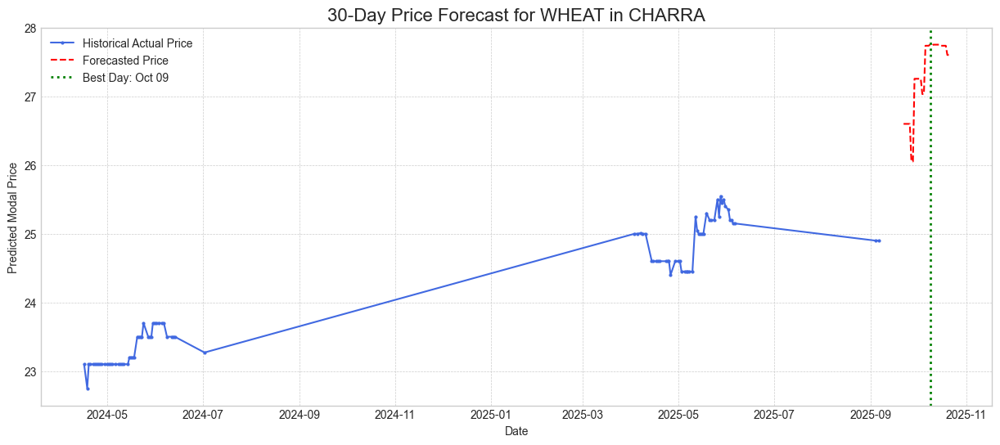


--- Results for APMC: ETAH ---
💰 Best day to sell is: Monday, October 06, 2025
📈 With a predicted price of: 27.60


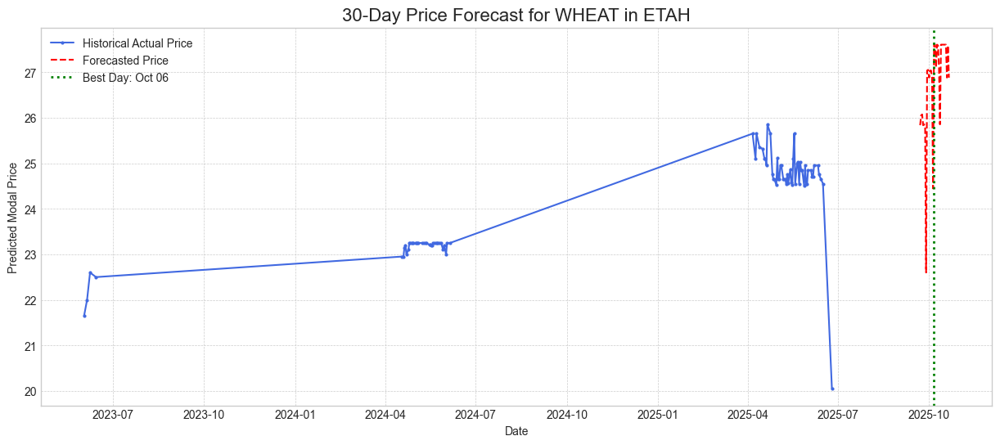


--- Results for APMC: SAFDARGANJ ---
💰 Best day to sell is: Monday, October 06, 2025
📈 With a predicted price of: 27.74


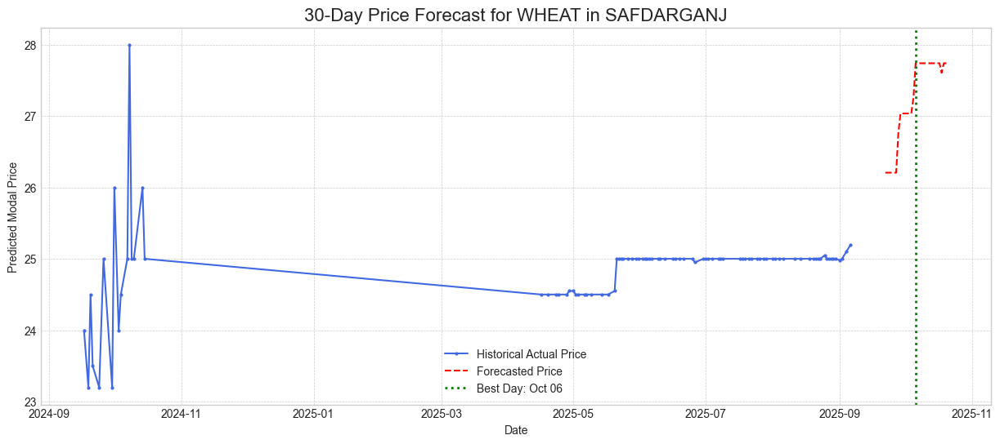


--- Results for APMC: MAINPURI ---
💰 Best day to sell is: Sunday, October 19, 2025
📈 With a predicted price of: 27.58


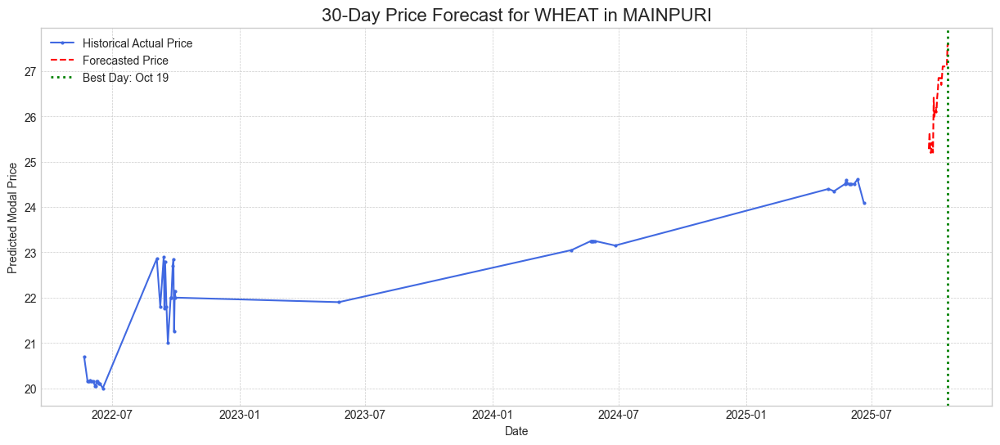


--- Results for APMC: SULTANPUR ---
💰 Best day to sell is: Monday, October 13, 2025
📈 With a predicted price of: 27.74


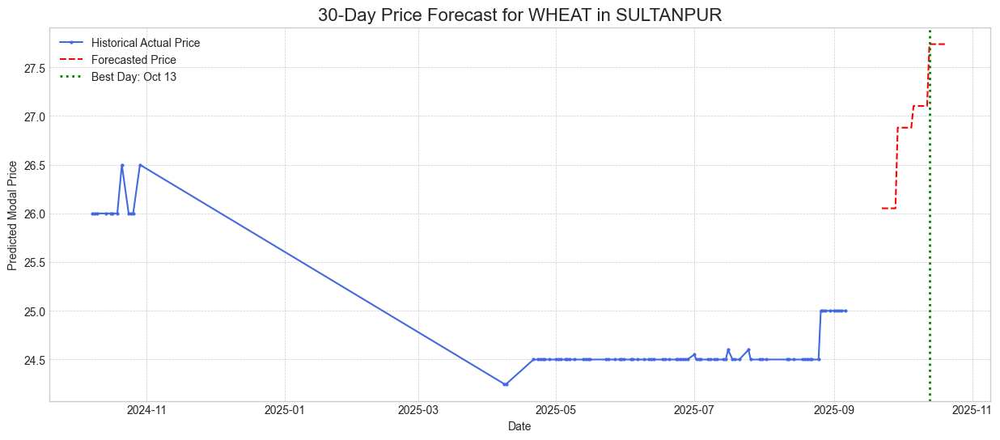


--- Results for APMC: NAWABGANJ APMC ---
💰 Best day to sell is: Monday, October 20, 2025
📈 With a predicted price of: 28.24


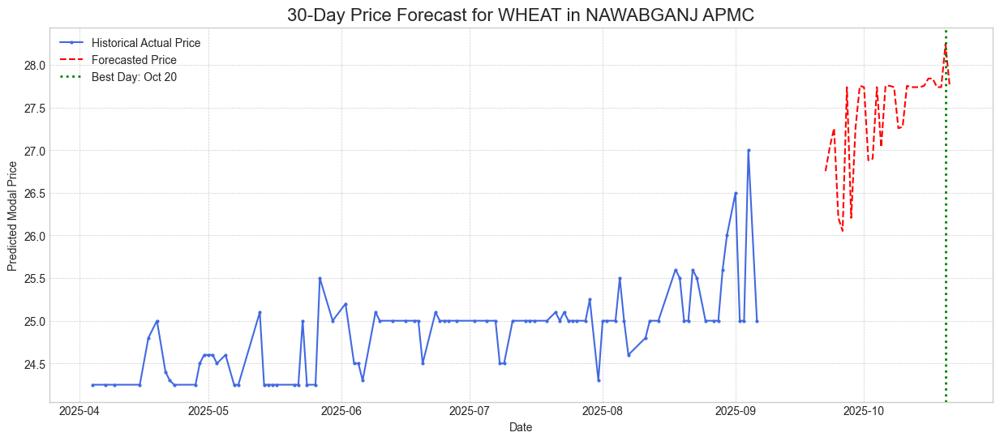


--- Results for APMC: KHAIR ---
💰 Best day to sell is: Friday, October 17, 2025
📈 With a predicted price of: 27.75


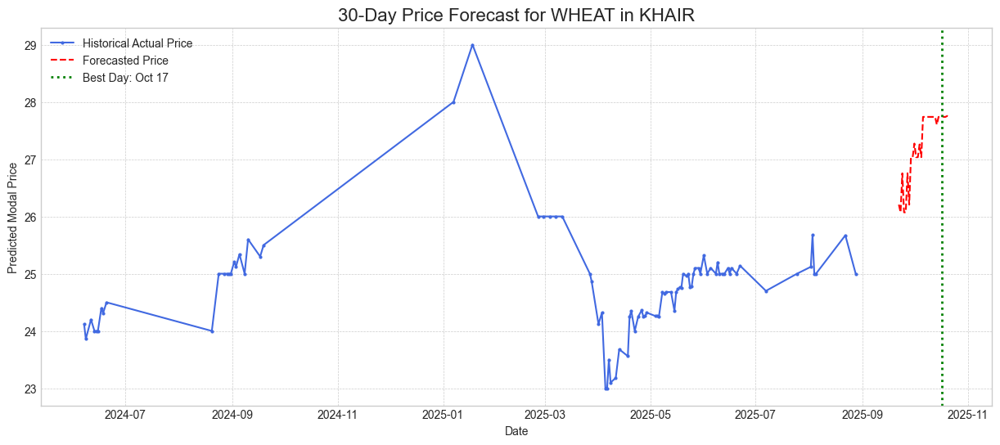


--- Results for APMC: KARWI APMC ---
💰 Best day to sell is: Monday, October 13, 2025
📈 With a predicted price of: 27.58


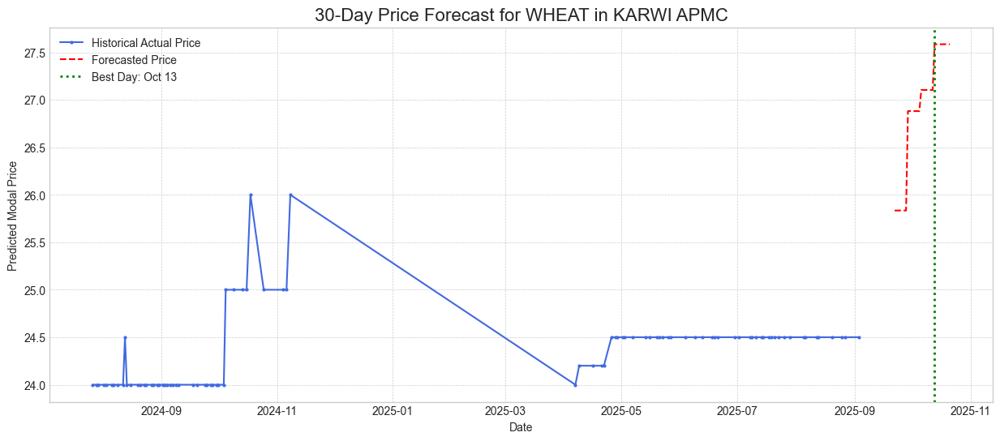


--- Results for APMC: FIROZABAD APMC ---
💰 Best day to sell is: Thursday, October 09, 2025
📈 With a predicted price of: 28.93


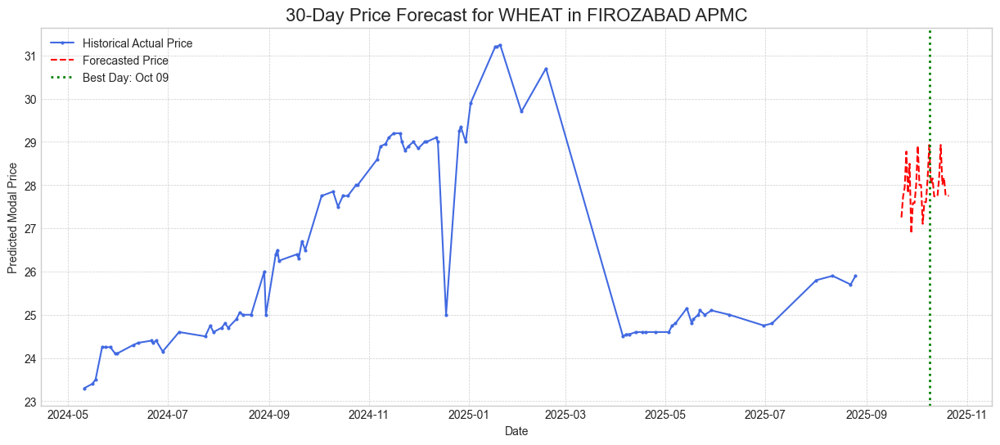


--- Results for APMC: TIKUNIYA ---
💰 Best day to sell is: Wednesday, October 15, 2025
📈 With a predicted price of: 27.74


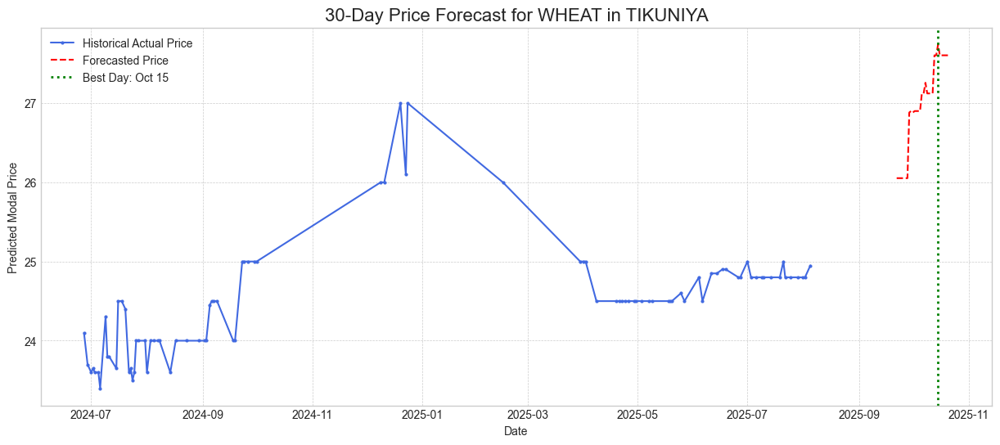


--- Results for APMC: ATARRA APMC ---
💰 Best day to sell is: Tuesday, October 21, 2025
📈 With a predicted price of: 27.74


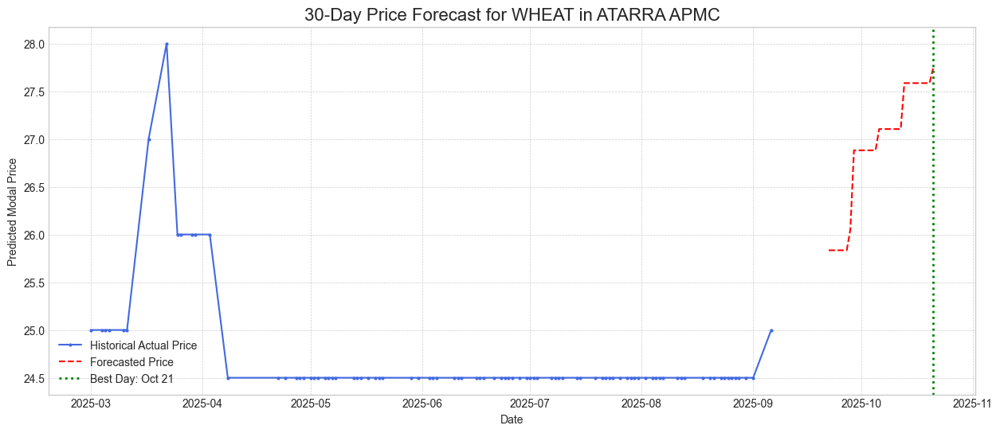


--- Results for APMC: CHAUBEPUR ---
💰 Best day to sell is: Monday, October 06, 2025
📈 With a predicted price of: 27.74


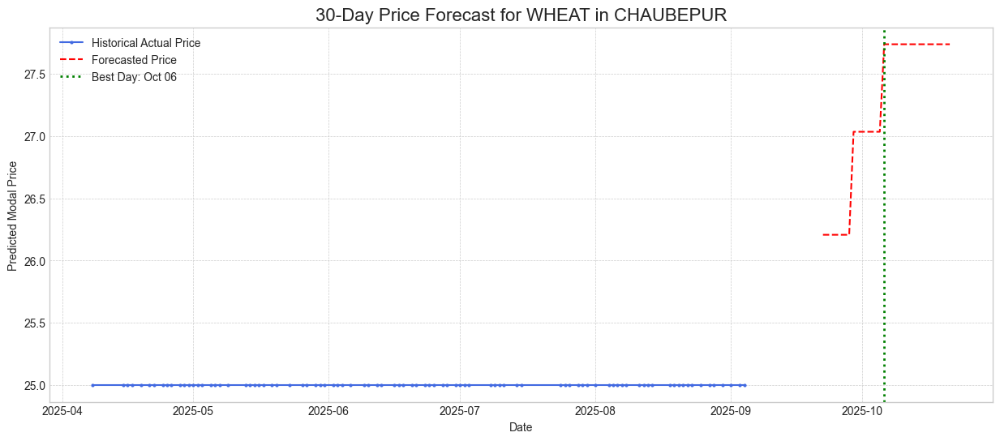


--- Results for APMC: BILSI ---
💰 Best day to sell is: Monday, October 20, 2025
📈 With a predicted price of: 27.84


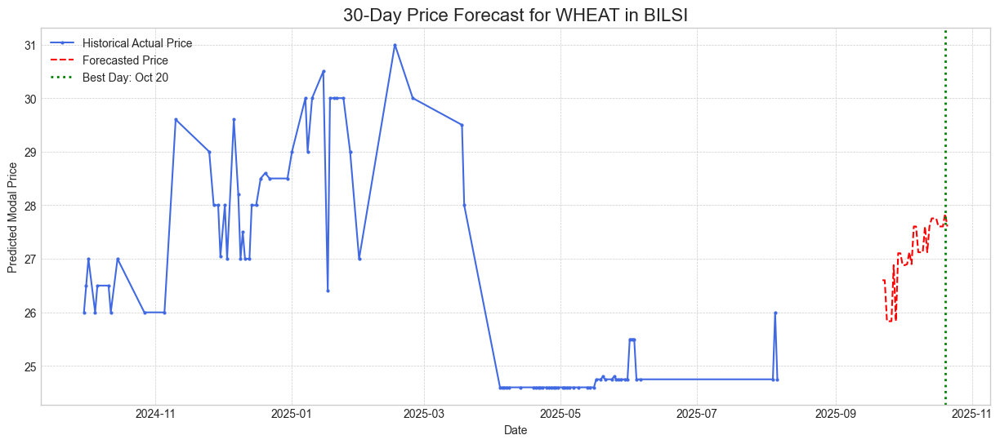


--- Results for APMC: RAE BARELI ---
💰 Best day to sell is: Tuesday, October 21, 2025
📈 With a predicted price of: 27.74


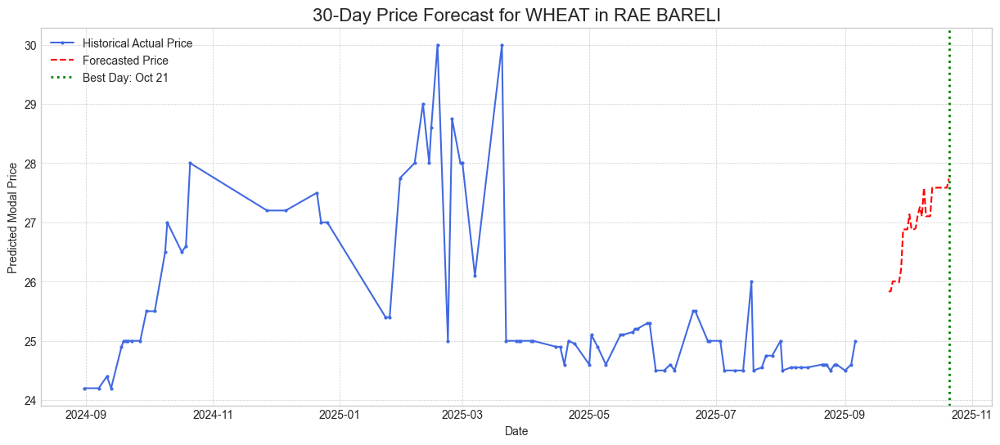


--- Results for APMC: JHANSI ---
💰 Best day to sell is: Monday, October 20, 2025
📈 With a predicted price of: 26.09


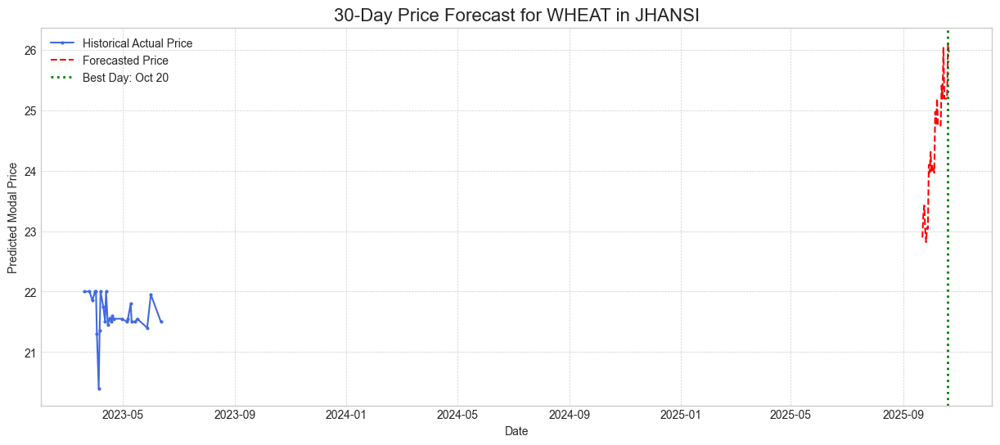


--- Results for APMC: BINDIKI ---
💰 Best day to sell is: Tuesday, October 07, 2025
📈 With a predicted price of: 28.17


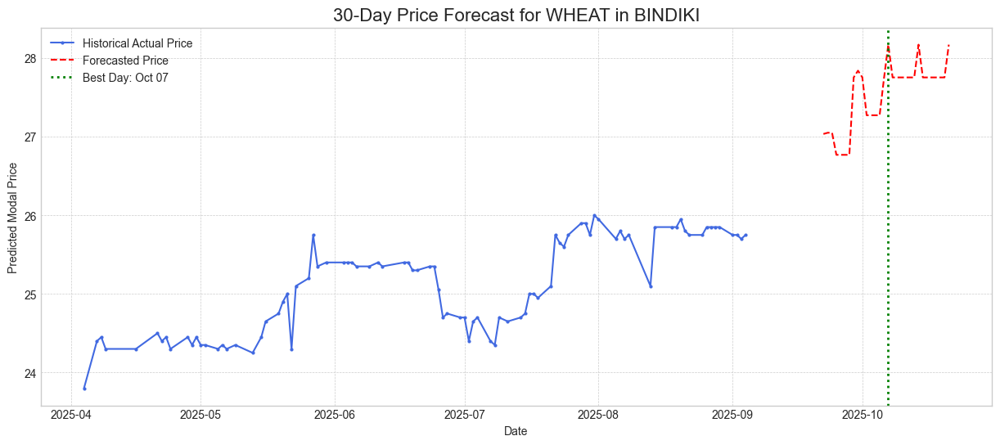


--- Results for APMC: MILAK ---
💰 Best day to sell is: Monday, October 06, 2025
📈 With a predicted price of: 27.74


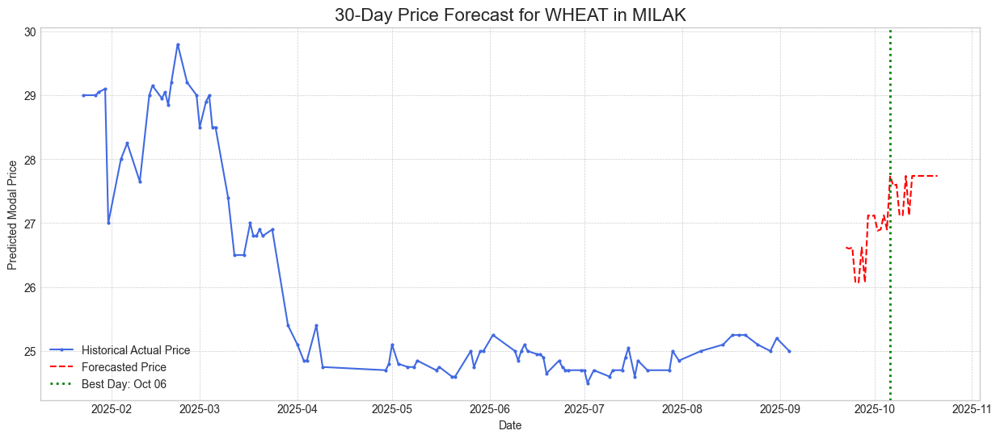


--- Results for APMC: KAIMGANJ ---
💰 Best day to sell is: Monday, October 13, 2025
📈 With a predicted price of: 27.58


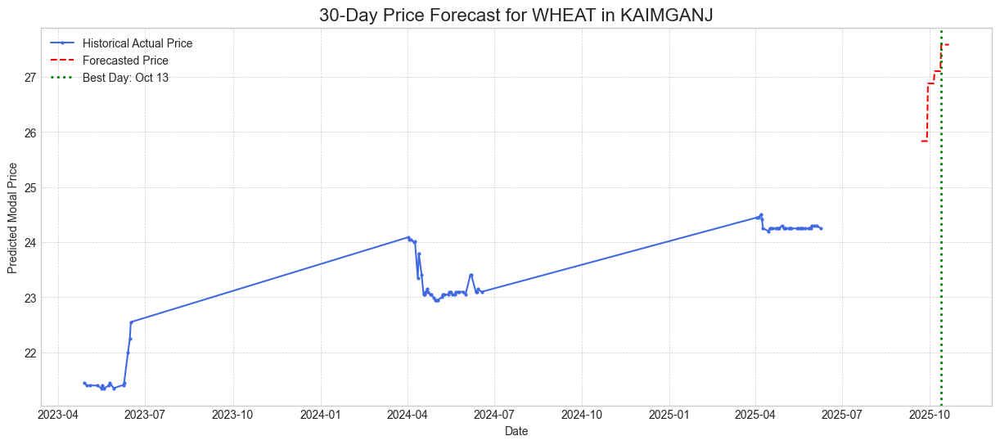


--- Results for APMC: SHAHJAHANPUR ---
💰 Best day to sell is: Saturday, October 18, 2025
📈 With a predicted price of: 28.16


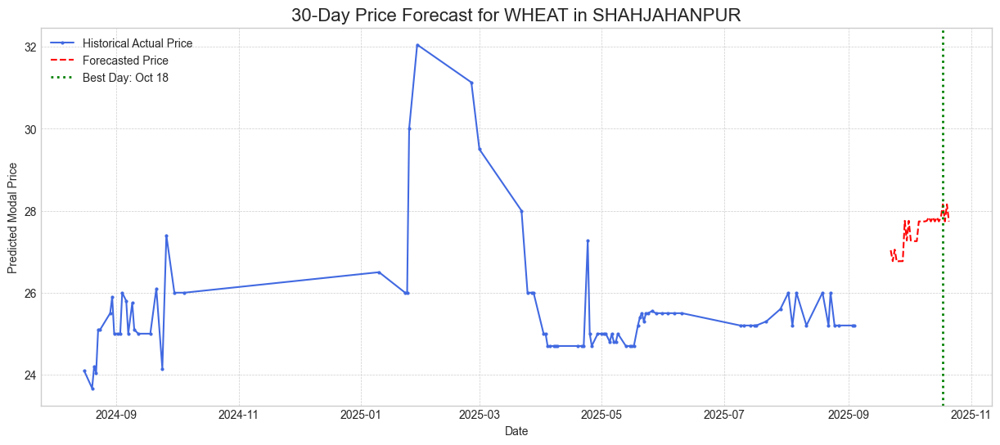


--- Results for APMC: ETAWAH ---
💰 Best day to sell is: Friday, October 17, 2025
📈 With a predicted price of: 27.74


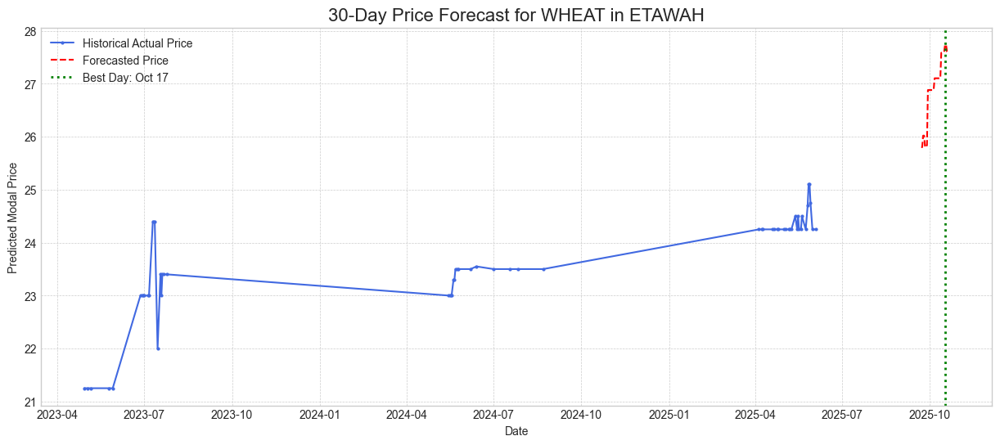


--- Results for APMC: RAMPUR BILASPUR ---
💰 Best day to sell is: Wednesday, October 15, 2025
📈 With a predicted price of: 27.75


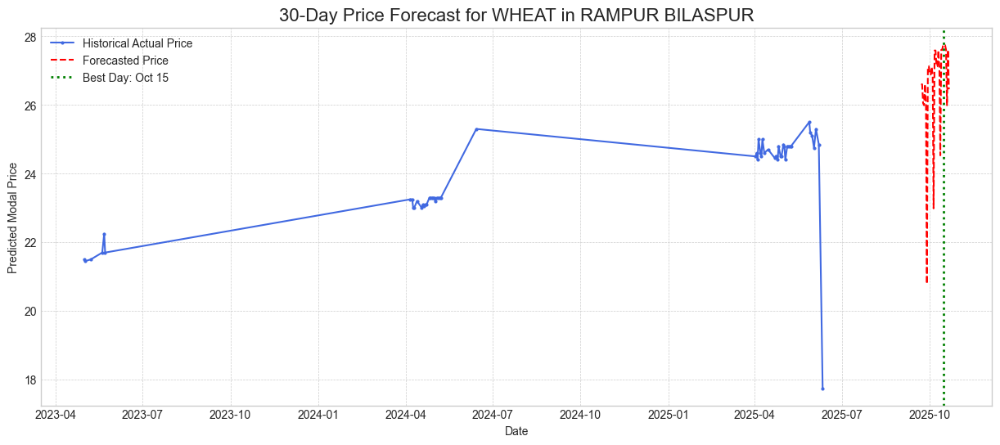


--- Results for APMC: GONDA ---
💰 Best day to sell is: Monday, October 20, 2025
📈 With a predicted price of: 27.75


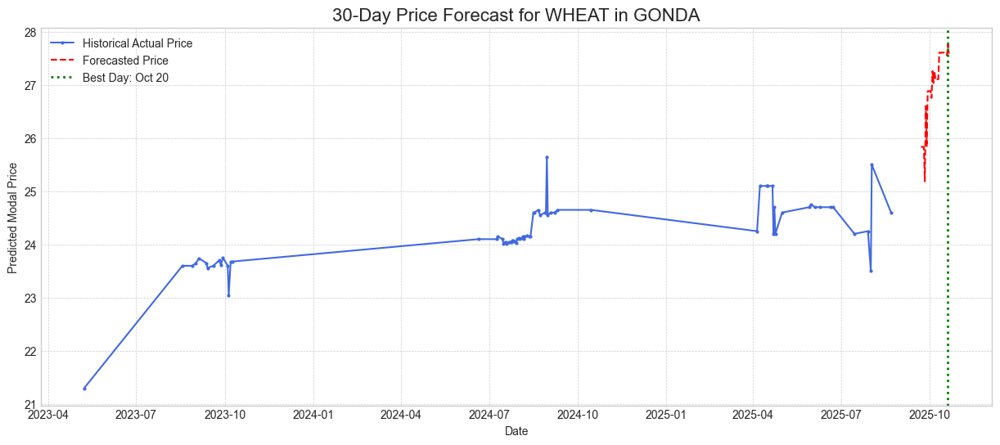


--- Results for APMC: JAHANGIRABAD ---
💰 Best day to sell is: Saturday, October 18, 2025
📈 With a predicted price of: 27.84


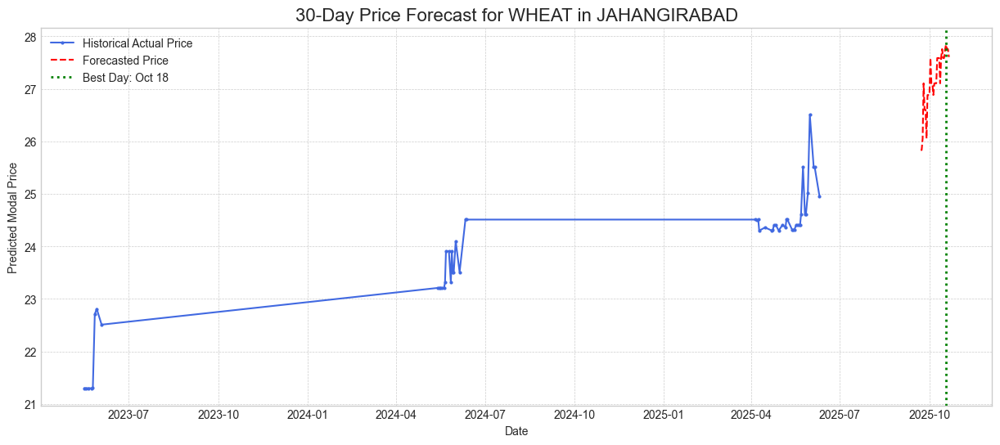


--- Results for APMC: HATHRAS ---
💰 Best day to sell is: Monday, October 13, 2025
📈 With a predicted price of: 27.58


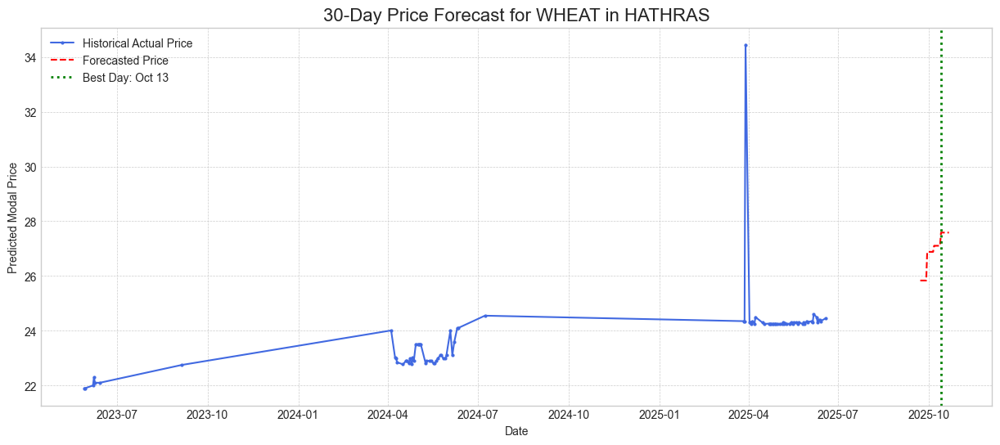


--- Results for APMC: MOHAMADABAD APMC ---
💰 Best day to sell is: Monday, October 13, 2025
📈 With a predicted price of: 27.60


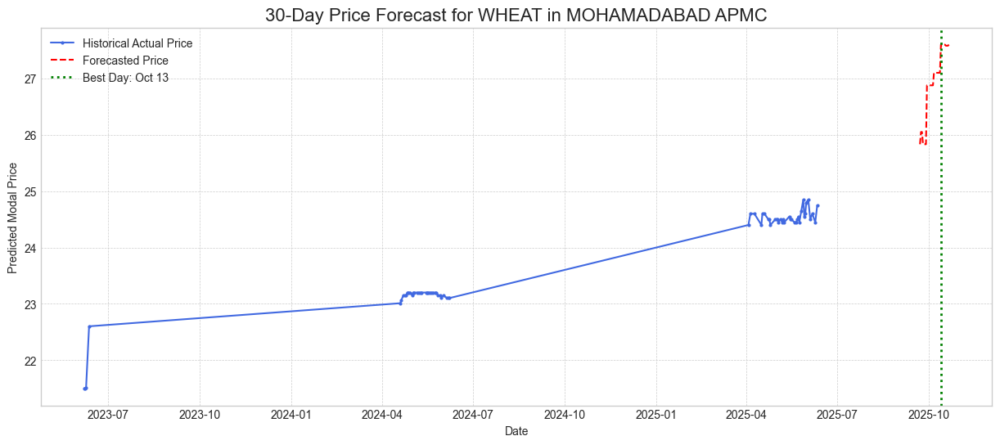


--- Results for APMC: BHARTHANA ---
💰 Best day to sell is: Saturday, October 18, 2025
📈 With a predicted price of: 27.60


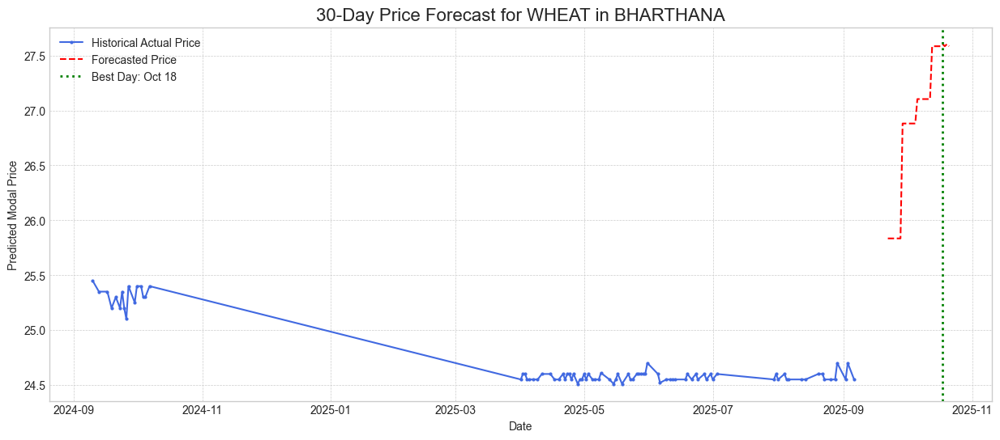


--- Results for APMC: BULANDSHAHAR ---
💰 Best day to sell is: Wednesday, October 15, 2025
📈 With a predicted price of: 28.26


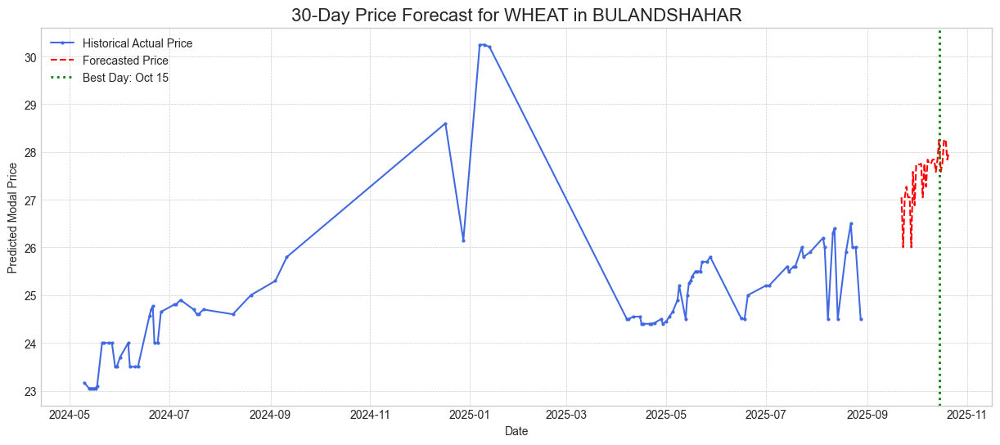


--- Results for APMC: ACHHALDA APMC ---
💰 Best day to sell is: Monday, October 13, 2025
📈 With a predicted price of: 27.58


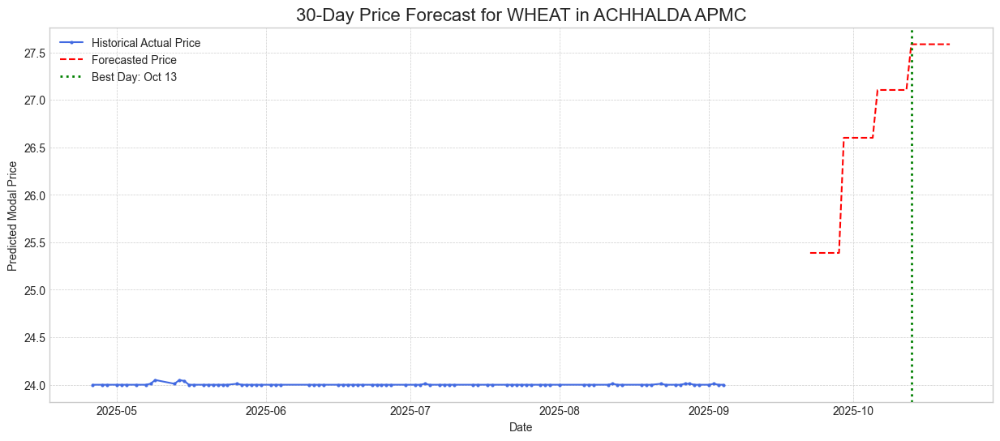


--- Results for APMC: JALALABAD APMC ---
💰 Best day to sell is: Tuesday, October 14, 2025
📈 With a predicted price of: 27.74


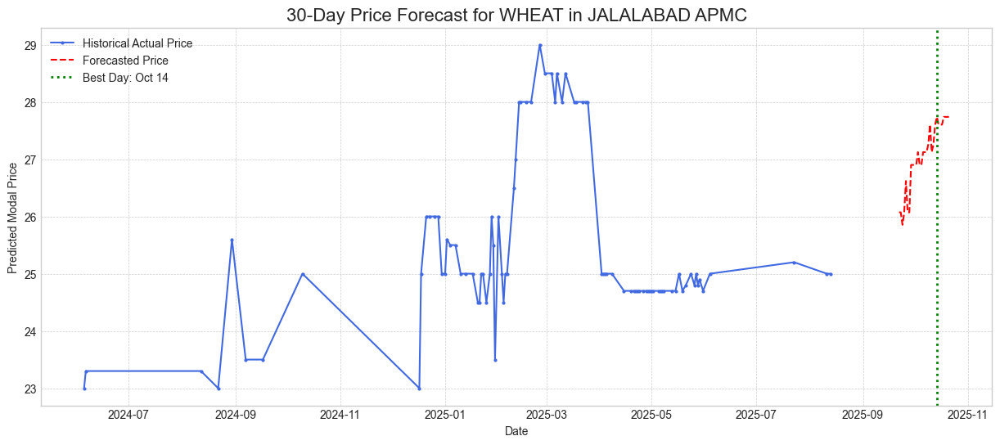


--- Results for APMC: POWAYAN ---
💰 Best day to sell is: Sunday, October 19, 2025
📈 With a predicted price of: 28.00


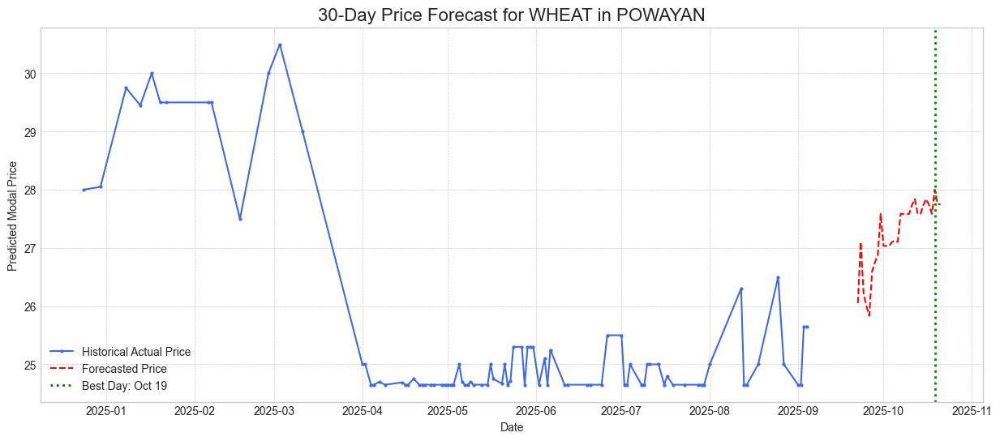


--- Results for APMC: MUZZAFFARNAGAR ---
💰 Best day to sell is: Tuesday, October 21, 2025
📈 With a predicted price of: 27.74


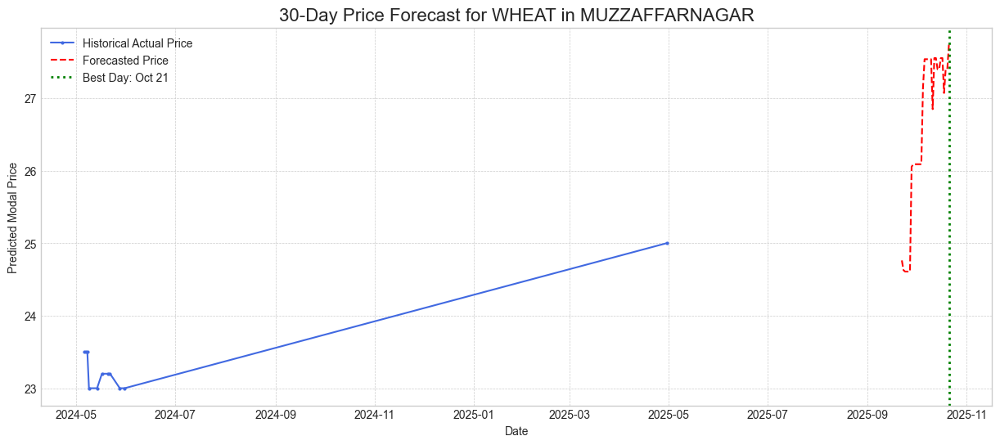


--- Results for APMC: MAHOBA ---
💰 Best day to sell is: Monday, October 13, 2025
📈 With a predicted price of: 29.63


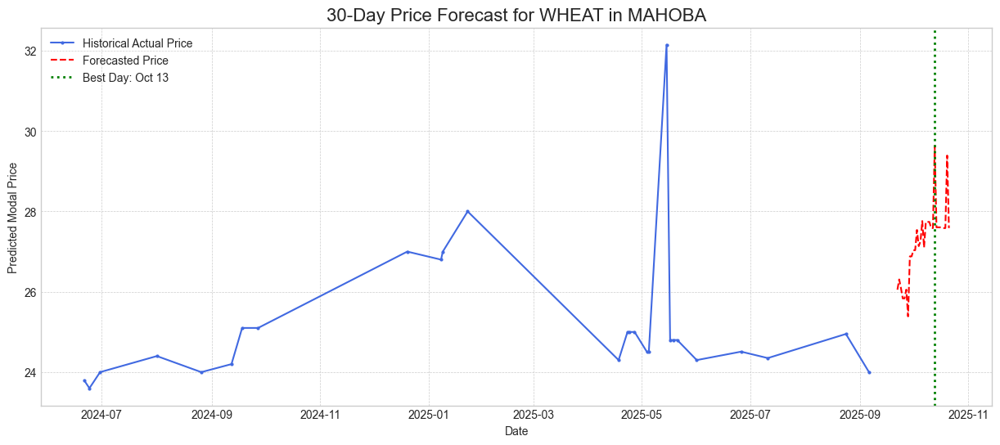


--- Results for APMC: HARDOI ---
💰 Best day to sell is: Tuesday, October 07, 2025
📈 With a predicted price of: 27.74


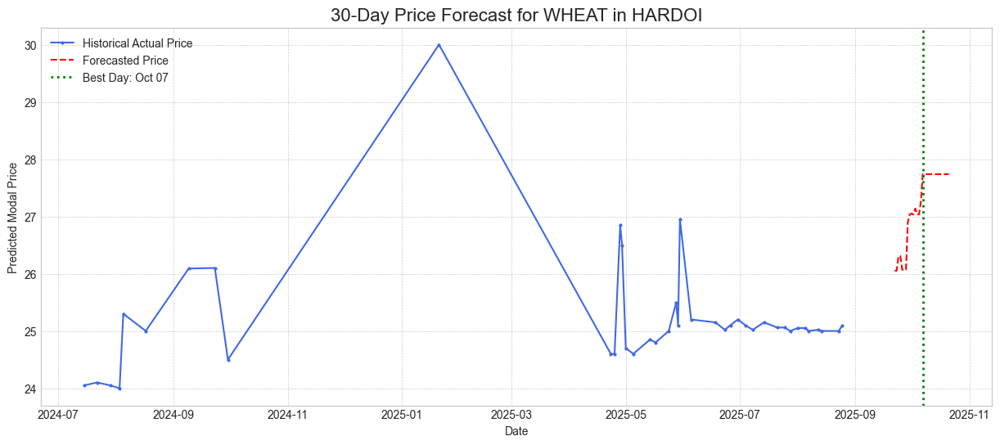


--- Results for APMC: PARTAWAL ---
💰 Best day to sell is: Saturday, October 18, 2025
📈 With a predicted price of: 34.42


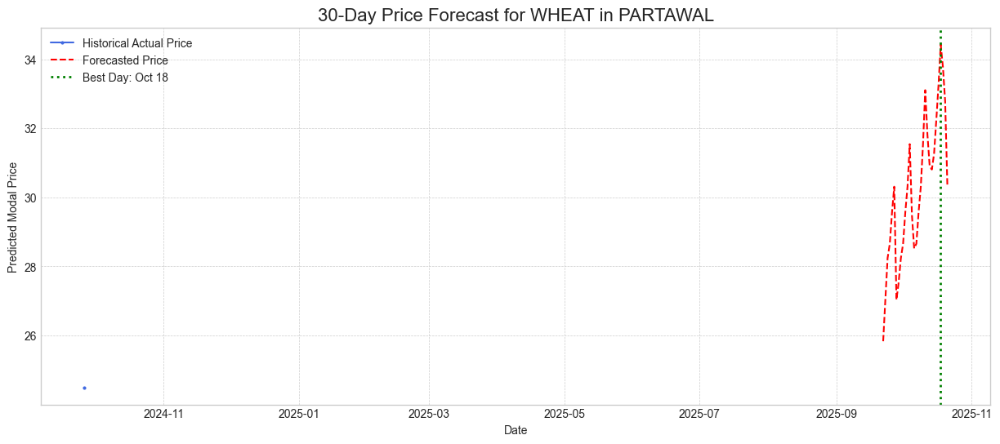


--- Results for APMC: HASANPUR APMC ---
💰 Best day to sell is: Tuesday, October 21, 2025
📈 With a predicted price of: 29.06


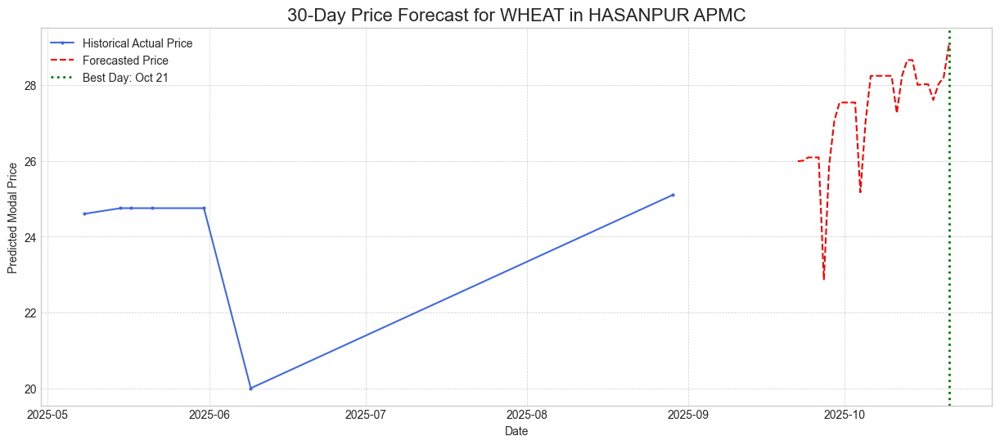


--- Results for APMC: GHIROR ---
💰 Best day to sell is: Thursday, October 16, 2025
📈 With a predicted price of: 28.93


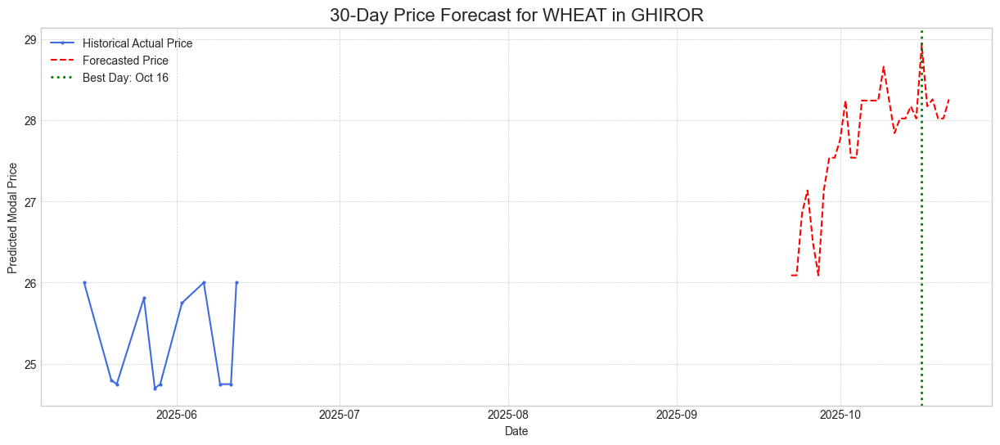


--- Results for APMC: CHIBRAMAU ---
💰 Best day to sell is: Monday, October 20, 2025
📈 With a predicted price of: 28.91


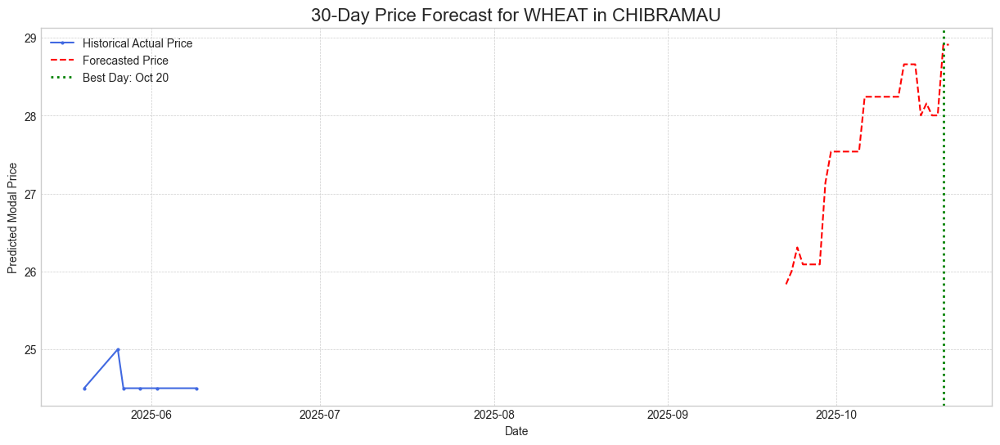


--- Results for APMC: UJHANI ---
💰 Best day to sell is: Monday, October 20, 2025
📈 With a predicted price of: 29.06


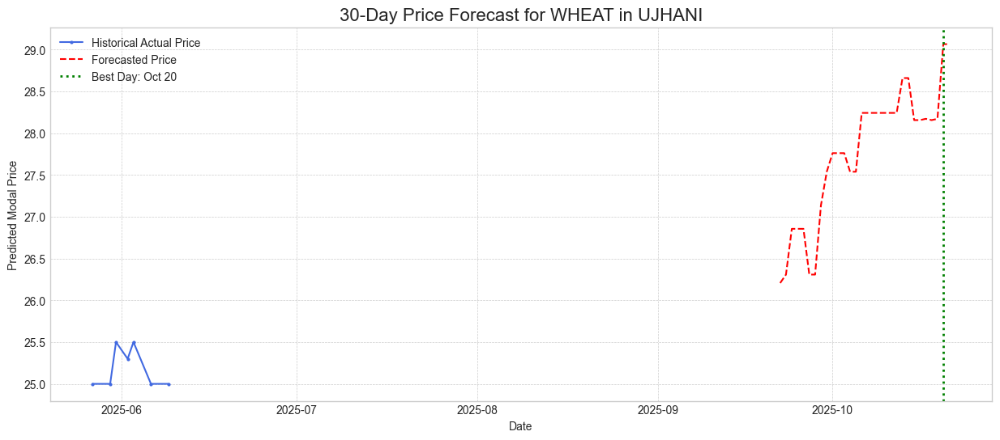


--- Results for APMC: CHARKHARI ---
💰 Best day to sell is: Wednesday, October 15, 2025
📈 With a predicted price of: 30.31


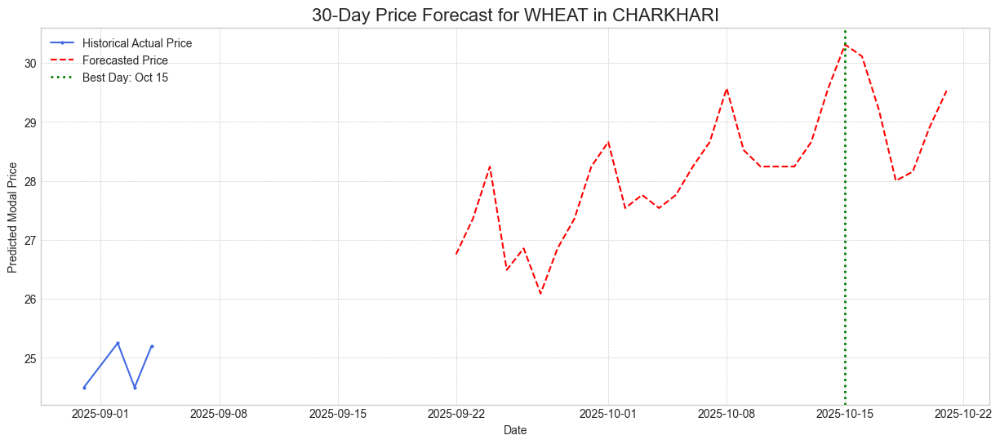

In [31]:
# --- Example 2: Find the best selling date for ALL APMCs of a commodity in a state ---
predictor.find_best_selling_date(
    commodity='WHEAT',
    state='UTTAR PRADESH'
)

### Trully Final

In [35]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import xgboost as xgb
from sklearn.metrics import mean_absolute_error, r2_score

class CommodityPricePredictor:
    """
    Trains a single, global XGBoost model to predict prices, find optimal 
    selling dates, and run historical backtests.
    """
    def __init__(self, df):
        if not isinstance(df.index, pd.DatetimeIndex):
            raise TypeError("DataFrame index must be a DatetimeIndex.")
        self.df_full = df.copy()
        self.model = None
        self.mappers = {}
        self.prepared_data = None
        self.feature_names = []
        print("✅ Predictor initialized in Single-Model Mode.")

    def _prepare_data(self):
        # (This method remains unchanged)
        df = self.df_full.copy()
        for col in ['commodity', 'state', 'apmc']:
            df[f'{col}_code'] = df[col].astype('category').cat.codes
            self.mappers[col] = dict(enumerate(df[col].astype('category').cat.categories))
        df['dayofweek'] = df.index.dayofweek
        df['dayofyear'] = df.index.dayofyear
        df['month'] = df.index.month
        df['year'] = df.index.year
        df['weekofyear'] = df.index.isocalendar().week.astype(int)
        df = df.sort_index()
        grouped = df.groupby(['commodity_code', 'state_code', 'apmc_code'])
        df['price_lag_7'] = grouped['modal_price'].shift(7)
        df['price_lag_30'] = grouped['modal_price'].shift(30)
        df['rolling_mean_30'] = grouped['modal_price'].shift(1).rolling(window=30).mean()
        self.prepared_data = df.dropna()
        print("✅ Data preparation and feature engineering complete.")

    def train(self):
        # (This method remains unchanged)
        self._prepare_data()
        train_df = self.prepared_data.loc[self.prepared_data.index < '2024-01-01']
        test_df = self.prepared_data.loc[self.prepared_data.index >= '2024-01-01']
        print(f"Training data from {train_df.index.min().date()} to {train_df.index.max().date()}")
        print(f"Testing data from {test_df.index.min().date()} to {test_df.index.max().date()}")
        self.feature_names = [
            'dayofweek', 'dayofyear', 'month', 'year', 'weekofyear',
            'commodity_code', 'state_code', 'apmc_code',
            'price_lag_7', 'price_lag_30', 'rolling_mean_30'
        ]
        TARGET = 'modal_price'
        X_train, y_train = train_df[self.feature_names], train_df[TARGET]
        X_test, y_test = test_df[self.feature_names], test_df[TARGET]
        self.model = xgb.XGBRegressor(n_estimators=1000, learning_rate=0.01, eval_metric='mae', early_stopping_rounds=25, n_jobs=-1)
        print("--- Training Global Model ---")
        self.model.fit(X_train, y_train, eval_set=[(X_test, y_test)], verbose=100)
        print("✅ Global model trained.")
        self.evaluate(test_df)

    def evaluate(self, test_df):
        # (This method remains unchanged)
        TARGET = 'modal_price'
        X_test, y_test = test_df[self.feature_names], test_df[TARGET]
        predictions = self.model.predict(X_test)
        r2 = r2_score(y_test, predictions)
        mae = mean_absolute_error(y_test, predictions)
        print(f"\n--- Global Model Evaluation (on 2024+ data) ---")
        print(f"R-squared (R²): {r2:.3f}")
        print(f"Mean Absolute Error (MAE): {mae:.2f}")
        print("---------------------------------------------")

    def predict(self, prediction_date_str, commodity, state, apmc):
        # (This method remains unchanged)
        if self.model is None: return print("❌ Error: Model has not been trained yet.")
        prediction_date = pd.to_datetime(prediction_date_str).normalize()
        mask = (self.prepared_data.index == prediction_date) & (self.prepared_data['commodity'] == commodity) & (self.prepared_data['state'] == state) & (self.prepared_data['apmc'] == apmc)
        target_row = self.prepared_data[mask]
        if not target_row.empty:
            print(f"🔍 Found historical data for {prediction_date.date()}. Running in evaluation mode.")
            actual_price = target_row['modal_price'].values[0]
            input_features = target_row[self.feature_names]
            predicted_price = self.model.predict(input_features)[0]
            error = abs(actual_price - predicted_price)
            print(f"\n--- Single Point Evaluation ---\n  Actual Price:    {actual_price:.2f}\n  Predicted Price: {predicted_price:.2f}\n  Absolute Error:  {error:.2f}\n-----------------------------")
            return predicted_price
        else:
            print(f"🔮 No historical data found. Running in prediction mode.")
            series_mask = (self.prepared_data['commodity'] == commodity) & (self.prepared_data['state'] == state) & (self.prepared_data['apmc'] == apmc)
            series_data = self.prepared_data[series_mask]
            if series_data.empty: return print(f"❌ Error: Cannot predict. The combination of '{commodity}' in '{apmc}', '{state}' was not found in the trained dataset.")
            input_df = pd.DataFrame(index=[prediction_date])
            input_df['dayofweek'], input_df['dayofyear'], input_df['month'], input_df['year'] = input_df.index.dayofweek, input_df.index.dayofyear, input_df.index.month, input_df.index.year
            input_df['weekofyear'] = input_df.index.isocalendar().week.astype(int)
            reverse_mappers = {col: {v: k for k, v in self.mappers[col].items()} for col in self.mappers}
            try:
                input_df['commodity_code'], input_df['state_code'], input_df['apmc_code'] = reverse_mappers['commodity'][commodity], reverse_mappers['state'][state], reverse_mappers['apmc'][apmc]
            except KeyError as e: return print(f"❌ Error: Unknown category '{e.args[0]}'.")
            last_known_data = series_data.iloc[-1]
            input_df['price_lag_7'], input_df['price_lag_30'], input_df['rolling_mean_30'] = last_known_data['modal_price'], last_known_data['modal_price'], last_known_data['rolling_mean_30']
            predicted_price = self.model.predict(input_df[self.feature_names])[0]
            print(f"📈 Predicted price for {commodity} in {apmc}, {state} on {prediction_date.date()}: {predicted_price:.2f}")
            return predicted_price

    def find_best_selling_date(self, commodity, state, apmc=None, forecast_days=30):
        # (This method remains unchanged)
        if self.model is None: return print("❌ Error: Model has not been trained yet.")
        print(f"\nForecasting next {forecast_days} days for '{commodity}' in '{state}'...")
        if apmc: apmc_list = [apmc]
        else:
            mask = (self.prepared_data['commodity'] == commodity) & (self.prepared_data['state'] == state)
            apmc_list = self.prepared_data[mask]['apmc'].unique()
            if len(apmc_list) == 0: return print(f"❌ Error: No historical data found for '{commodity}' in '{state}'.")
            print(f"No specific APMC provided. Analyzing {len(apmc_list)} APMC(s).")
        for current_apmc in apmc_list:
            try:
                series_mask = (self.prepared_data['commodity'] == commodity) & (self.prepared_data['state'] == state) & (self.prepared_data['apmc'] == current_apmc)
                history_orig = self.prepared_data[series_mask].copy()
                if history_orig.empty: print(f"\n--- Skipping {current_apmc} (No training data) ---"); continue
                history_recursive = history_orig.copy()
                future_dates = pd.date_range(start=pd.Timestamp.now().normalize() + pd.Timedelta(days=1), periods=forecast_days)
                predictions = []
                for date in future_dates:
                    last_known_row = history_recursive.iloc[-1]
                    input_df = pd.DataFrame(index=[date])
                    input_df['dayofweek'], input_df['dayofyear'], input_df['month'], input_df['year'] = date.dayofweek, date.dayofyear, date.month, date.year
                    input_df['weekofyear'] = date.isocalendar().week
                    input_df['commodity_code'], input_df['state_code'], input_df['apmc_code'] = last_known_row['commodity_code'], last_known_row['state_code'], last_known_row['apmc_code']
                    input_df['price_lag_7'] = history_recursive['modal_price'].iloc[-7] if len(history_recursive) >= 7 else last_known_row['modal_price']
                    input_df['price_lag_30'] = history_recursive['modal_price'].iloc[-30] if len(history_recursive) >= 30 else last_known_row['modal_price']
                    input_df['rolling_mean_30'] = history_recursive['modal_price'].rolling(window=30, min_periods=1).mean().iloc[-1]
                    predicted_price = self.model.predict(input_df[self.feature_names])[0]
                    predictions.append(predicted_price)
                    new_row_data = input_df[self.feature_names].iloc[0].to_dict()
                    new_row_data['modal_price'] = predicted_price
                    new_row_df = pd.DataFrame(new_row_data, index=[date])
                    history_recursive = pd.concat([history_recursive, new_row_df])
                forecast_df = pd.DataFrame({'date': future_dates, 'predicted_price': predictions})
                best_day = forecast_df.loc[forecast_df['predicted_price'].idxmax()]
                print(f"\n--- Results for APMC: {current_apmc} ---")
                print(f"💰 Best day to sell is: {best_day['date'].strftime('%A, %B %d, %Y')}")
                print(f"📈 With a predicted price of: {best_day['predicted_price']:.2f}")
                plt.figure(figsize=(15, 6))
                plt.style.use('seaborn-v0_8-whitegrid')
                plt.plot(history_orig.index[-90:], history_orig['modal_price'][-90:], label='Historical Actual Price', color='royalblue', marker='.', markersize=4)
                plt.plot(forecast_df['date'], forecast_df['predicted_price'], label='Forecasted Price', color='red', linestyle='--')
                plt.axvline(x=best_day['date'], color='green', linestyle=':', lw=2, label=f"Best Day: {best_day['date'].strftime('%b %d')}")
                plt.title(f"30-Day Price Forecast for {commodity} in {current_apmc}", fontsize=16)
                plt.xlabel("Date"), plt.ylabel("Predicted Modal Price"), plt.legend(), plt.grid(True, which='both', linestyle='--', linewidth=0.5), plt.show()
            except Exception as e:
                print(f"\n--- Could not generate forecast for {current_apmc}: {e} ---")

    # <<< METHOD UPDATED: `apmc` is now optional >>>
    def backtest_forecast(self, start_date_str, commodity, state, apmc=None, forecast_days=30):
        if self.model is None: return print("❌ Error: Model has not been trained yet.")
        
        start_date = pd.to_datetime(start_date_str).normalize()
        print(f"\n--- Backtesting {forecast_days}-day forecast for '{commodity}' in '{state}' starting from {start_date.date()} ---")

        # Determine which APMCs to run the backtest for
        if apmc:
            apmc_list = [apmc]
        else:
            mask = (self.prepared_data['commodity'] == commodity) & (self.prepared_data['state'] == state)
            apmc_list = self.prepared_data[mask]['apmc'].unique()
            if len(apmc_list) == 0: return print(f"❌ Error: No historical data found for '{commodity}' in '{state}'.")
            print(f"No specific APMC provided. Analyzing {len(apmc_list)} APMC(s).")
        
        # Loop through each APMC
        for current_apmc in apmc_list:
            try:
                print(f"\n--- Running backtest for APMC: {current_apmc} ---")
                series_mask = (self.prepared_data['commodity'] == commodity) & \
                              (self.prepared_data['state'] == state) & \
                              (self.prepared_data['apmc'] == current_apmc)
                series_data = self.prepared_data[series_mask]

                history_orig = series_data[series_data.index < start_date].copy()
                if history_orig.empty: 
                    print(f"Skipping {current_apmc}: Not enough historical data before {start_date.date()}.")
                    continue
                
                history_recursive = history_orig.copy()
                forecast_dates = pd.date_range(start=start_date, periods=forecast_days)
                
                predictions = []
                for date in forecast_dates:
                    last_known_row = history_recursive.iloc[-1]
                    input_df = pd.DataFrame(index=[date])
                    input_df['dayofweek'], input_df['dayofyear'], input_df['month'], input_df['year'] = date.dayofweek, date.dayofyear, date.month, date.year
                    input_df['weekofyear'] = date.isocalendar().week
                    input_df['commodity_code'], input_df['state_code'], input_df['apmc_code'] = last_known_row['commodity_code'], last_known_row['state_code'], last_known_row['apmc_code']
                    input_df['price_lag_7'] = history_recursive['modal_price'].iloc[-7] if len(history_recursive) >= 7 else last_known_row['modal_price']
                    input_df['price_lag_30'] = history_recursive['modal_price'].iloc[-30] if len(history_recursive) >= 30 else last_known_row['modal_price']
                    input_df['rolling_mean_30'] = history_recursive['modal_price'].rolling(window=30, min_periods=1).mean().iloc[-1]
                    
                    predicted_price = self.model.predict(input_df[self.feature_names])[0]
                    predictions.append(predicted_price)

                    new_row_data = input_df[self.feature_names].iloc[0].to_dict()
                    new_row_data['modal_price'] = predicted_price
                    new_row_df = pd.DataFrame(new_row_data, index=[date])
                    history_recursive = pd.concat([history_recursive, new_row_df])

                forecast_df = pd.DataFrame({'date': forecast_dates, 'predicted_price': predictions})
                actuals_df = series_data[series_data.index.isin(forecast_dates)]

                if not actuals_df.empty:
                    comparison_df = forecast_df.merge(actuals_df[['modal_price']], left_on='date', right_index=True, how='inner')
                    if not comparison_df.empty:
                        mae = mean_absolute_error(comparison_df['modal_price'], comparison_df['predicted_price'])
                        r2 = r2_score(comparison_df['modal_price'], comparison_df['predicted_price'])
                        print(f"📊 Backtest Evaluation ({len(comparison_df)}-day period): MAE = {mae:.2f}, R² = {r2:.3f}")

                plt.figure(figsize=(15, 6))
                plt.style.use('seaborn-v0_8-whitegrid')
                plt.plot(history_orig.index[-90:], history_orig['modal_price'][-90:], label='Historical Price', color='royalblue', marker='.', markersize=4)
                plt.plot(forecast_df['date'], forecast_df['predicted_price'], label='Forecasted Price', color='red', linestyle='--')
                if not actuals_df.empty:
                    plt.plot(actuals_df.index, actuals_df['modal_price'], label='Actual Price', color='green', marker='o', markersize=5, linestyle=':')
                
                plt.title(f"Backtest Forecast vs. Actual for {commodity} in {current_apmc}", fontsize=16)
                plt.xlabel("Date"), plt.ylabel("Modal Price"), plt.legend(), plt.grid(True, which='both', linestyle='--', linewidth=0.5), plt.show()

            except Exception as e:
                print(f"\n--- Could not generate backtest for {current_apmc}: {e} ---")

In [36]:
predictor = CommodityPricePredictor(df_final)
predictor.train()



✅ Predictor initialized in Single-Model Mode.
✅ Data preparation and feature engineering complete.
Training data from 2021-01-31 to 2023-12-31
Testing data from 2024-01-01 to 2025-09-06
--- Training Global Model ---
[0]	validation_0-mae:95.62219
[100]	validation_0-mae:45.75789
[200]	validation_0-mae:30.61478
[300]	validation_0-mae:26.57391
[400]	validation_0-mae:25.84329
[418]	validation_0-mae:25.84929
✅ Global model trained.

--- Global Model Evaluation (on 2024+ data) ---
R-squared (R²): 0.662
Mean Absolute Error (MAE): 25.84
---------------------------------------------



--- Backtesting 30-day forecast for 'WHEAT' in 'UTTAR PRADESH' starting from 2024-03-01 ---
No specific APMC provided. Analyzing 67 APMC(s).

--- Running backtest for APMC: URAI ---
📊 Backtest Evaluation (4-day period): MAE = 2.29, R² = -2.960


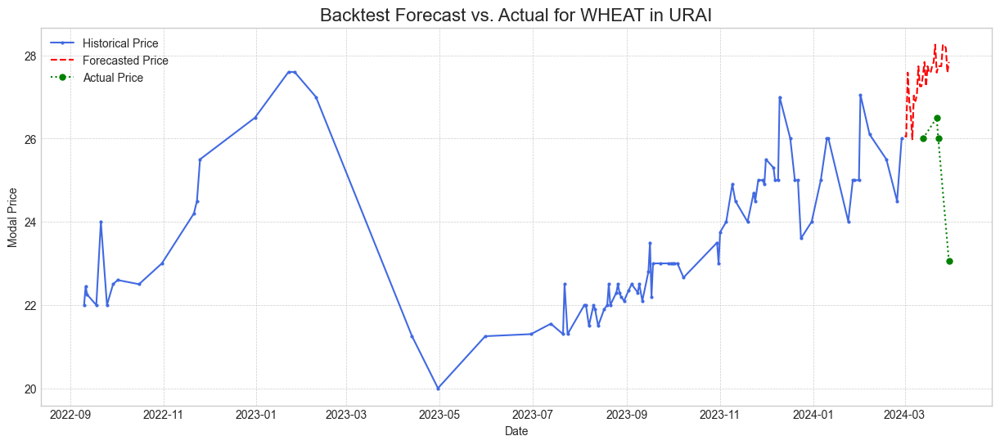


--- Running backtest for APMC: JALAUN ---
📊 Backtest Evaluation (18-day period): MAE = 2.18, R² = -8.815


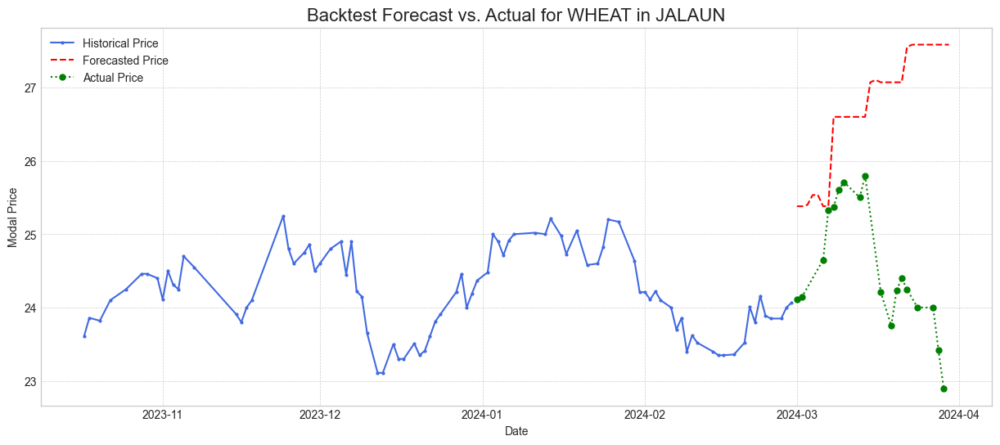


--- Running backtest for APMC: MUSKERA ---
📊 Backtest Evaluation (10-day period): MAE = 3.17, R² = -30.375


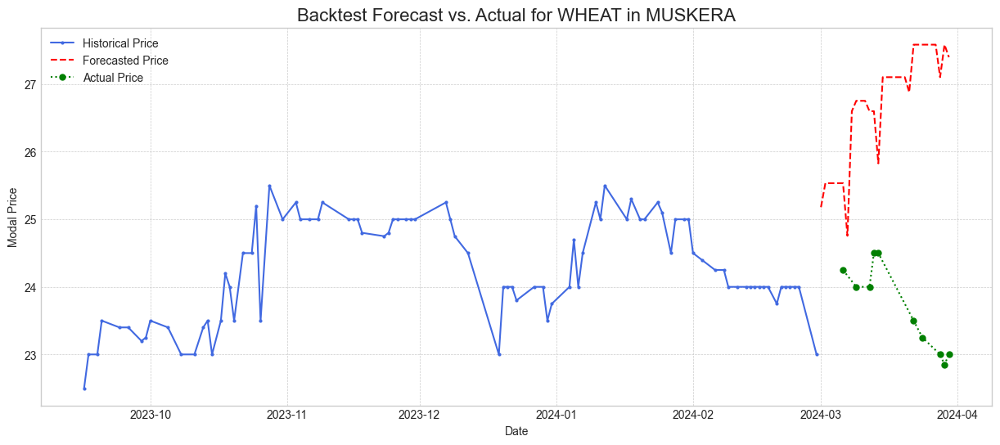


--- Running backtest for APMC: GHAZIABAD ---
📊 Backtest Evaluation (2-day period): MAE = 3.25, R² = -179.105


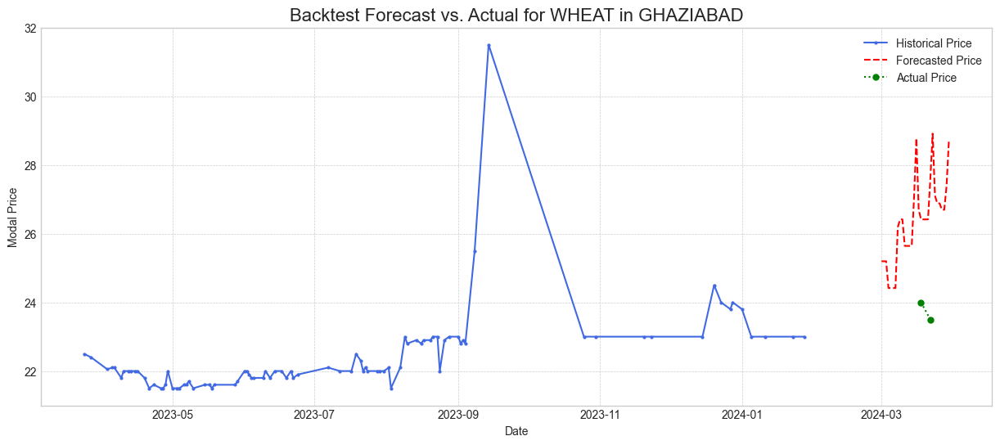


--- Running backtest for APMC: BAHRAICH ---
📊 Backtest Evaluation (15-day period): MAE = 2.19, R² = -22.184


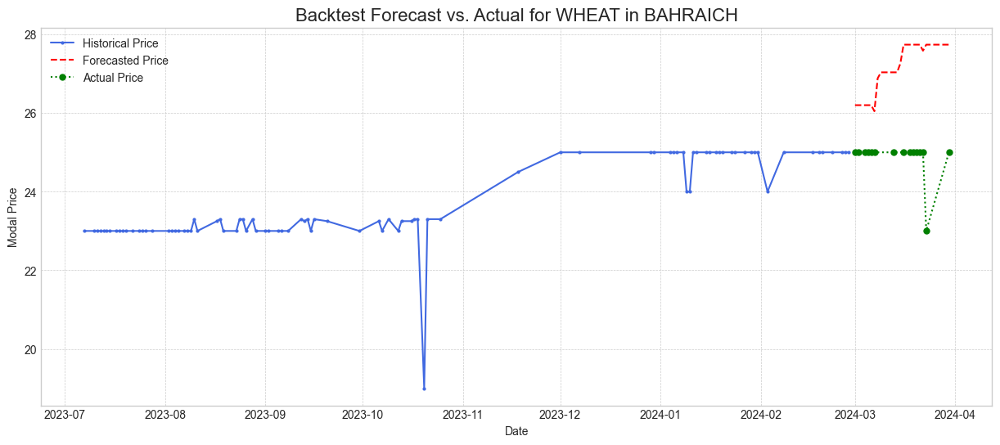


--- Running backtest for APMC: ACHNERA ---


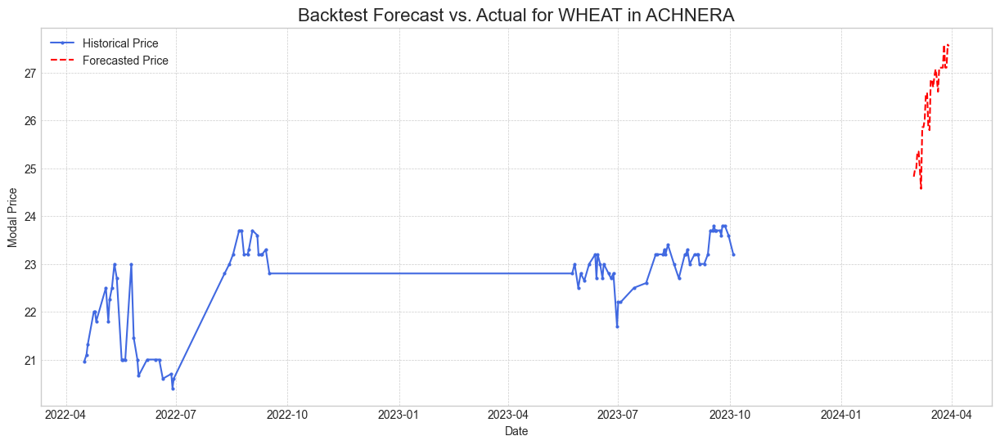


--- Running backtest for APMC: MAHMUDABAD ---


C:\Users\WELCOME\AppData\Roaming\Python\Python313\site-packages\sklearn\metrics\_regression.py:1283: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


📊 Backtest Evaluation (1-day period): MAE = 4.58, R² = nan


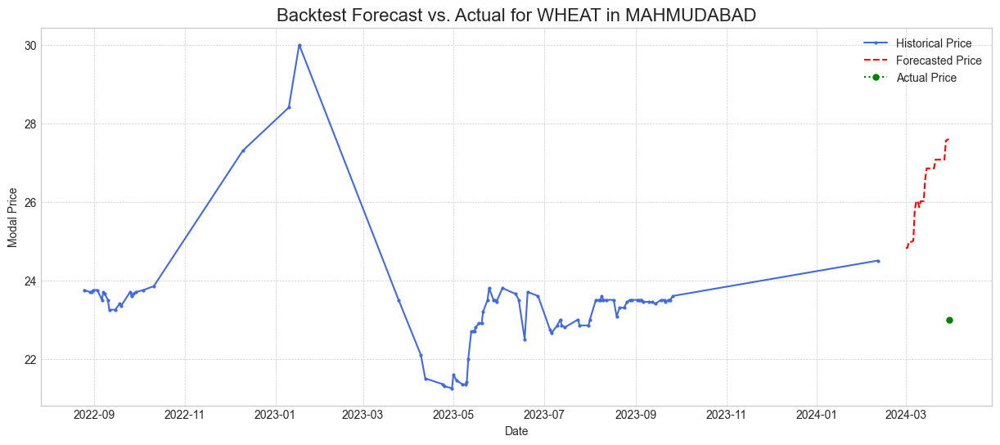


--- Running backtest for APMC: SHIKOHABAD ---


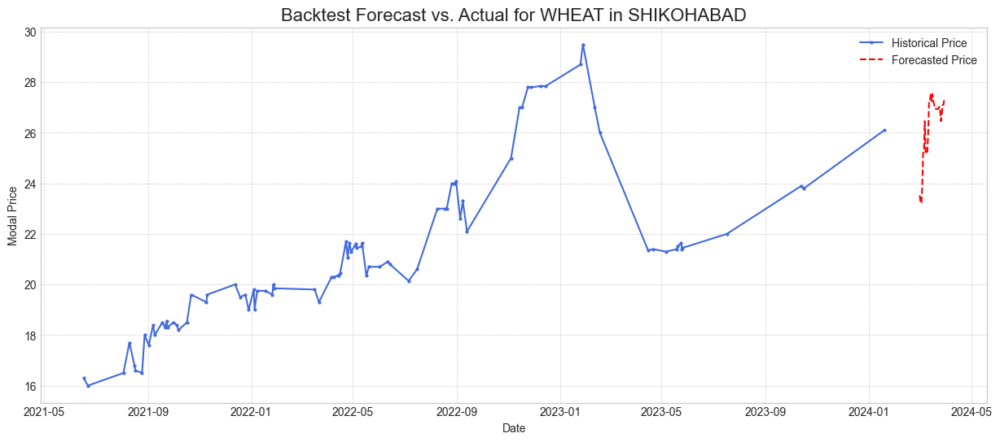


--- Running backtest for APMC: LAKHIMPUR ---
📊 Backtest Evaluation (22-day period): MAE = 2.11, R² = -25.205


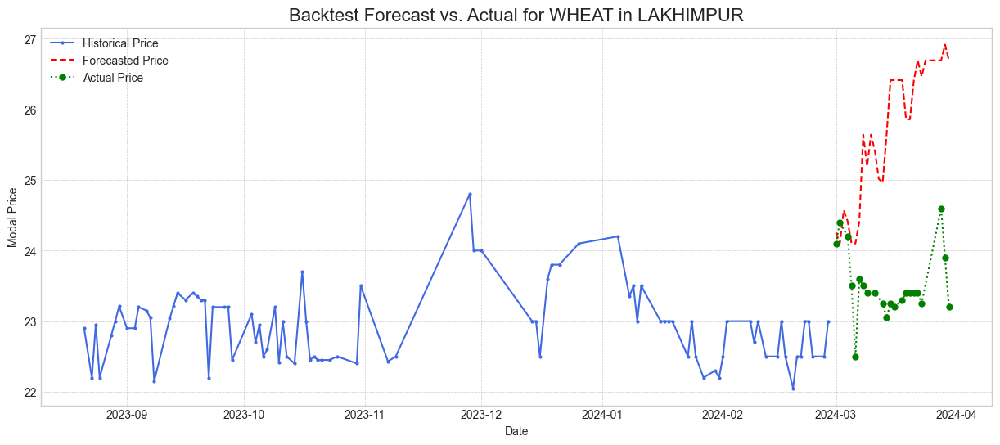


--- Running backtest for APMC: MADHOGANJ ---
📊 Backtest Evaluation (14-day period): MAE = 2.73, R² = -283.318


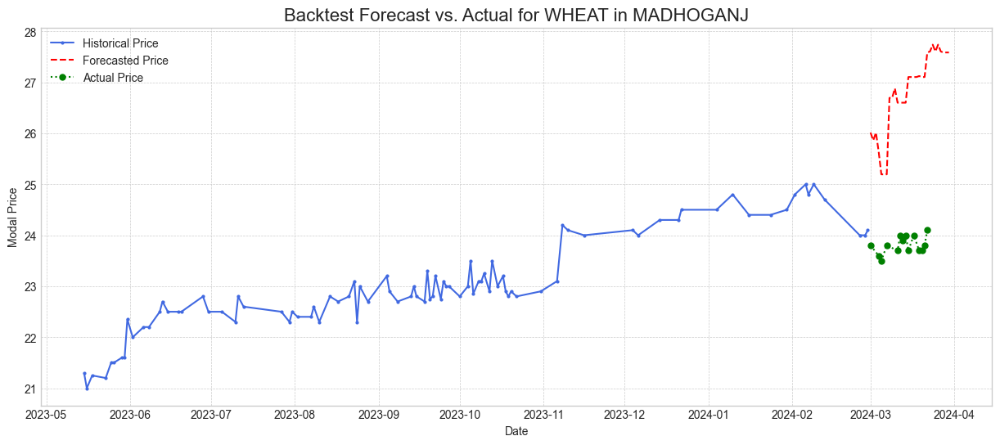


--- Running backtest for APMC: SITAPUR ---


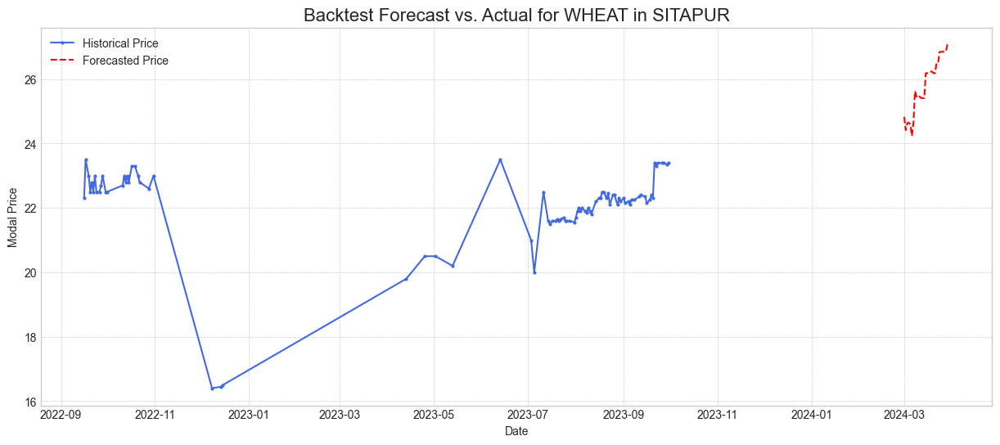


--- Running backtest for APMC: BASTI ---
📊 Backtest Evaluation (15-day period): MAE = 2.94, R² = 0.000


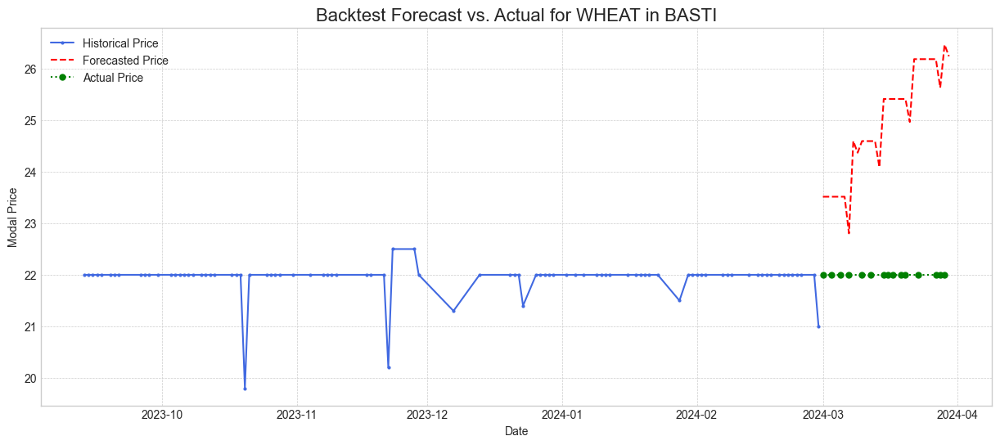


--- Running backtest for APMC: GOLAGOKARNATH ---


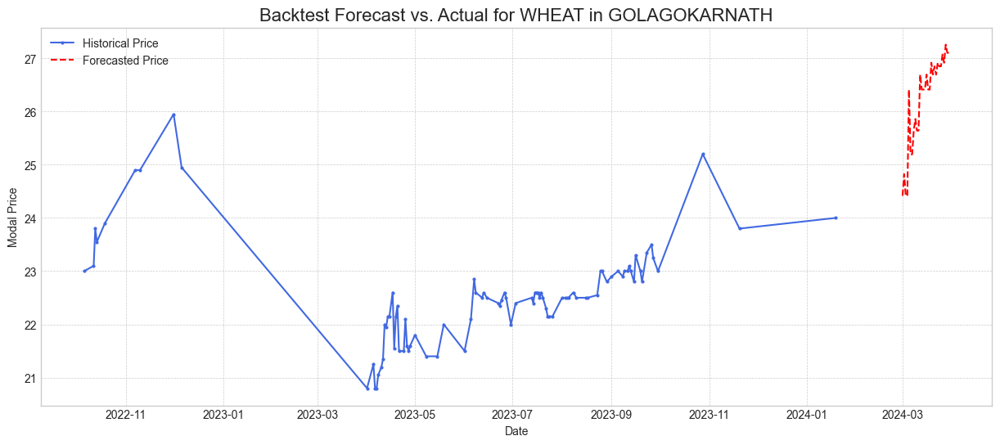


--- Running backtest for APMC: AURAIYA ---


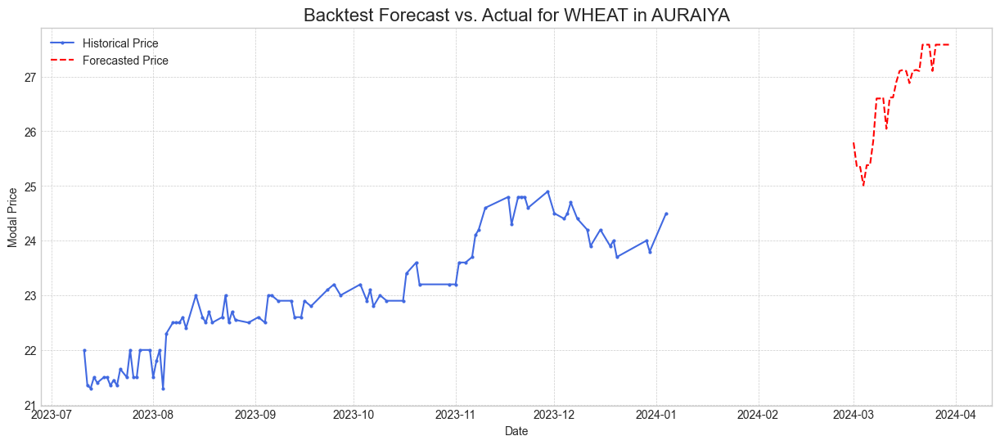


--- Running backtest for APMC: AJUHA ---


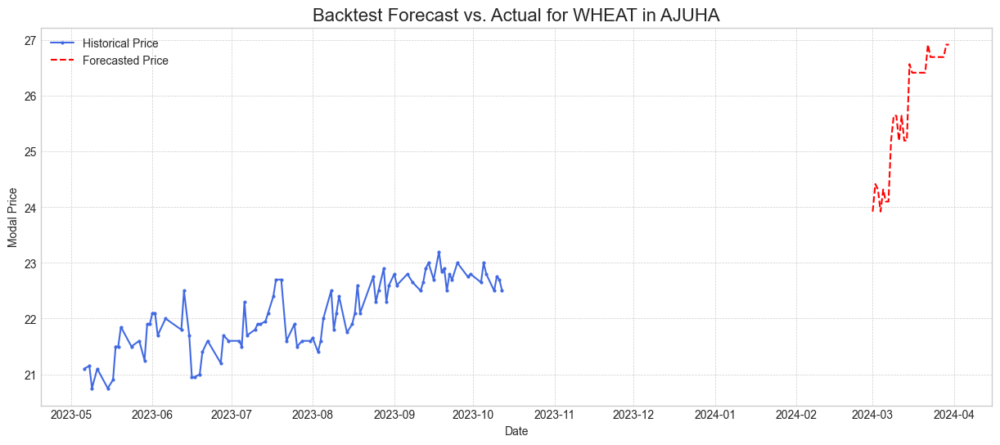


--- Running backtest for APMC: KANPUR ---
📊 Backtest Evaluation (4-day period): MAE = 4.87, R² = -152.720


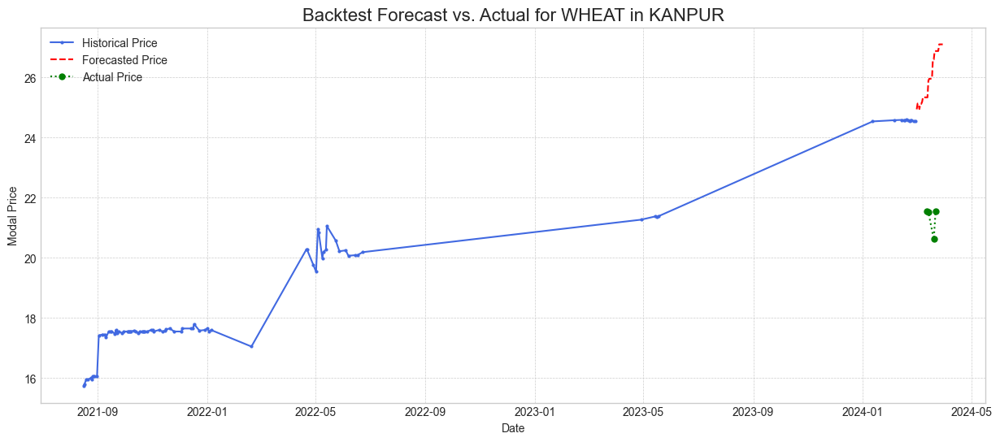


--- Running backtest for APMC: MAURANIPUR ---


C:\Users\WELCOME\AppData\Roaming\Python\Python313\site-packages\sklearn\metrics\_regression.py:1283: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


📊 Backtest Evaluation (1-day period): MAE = 2.86, R² = nan


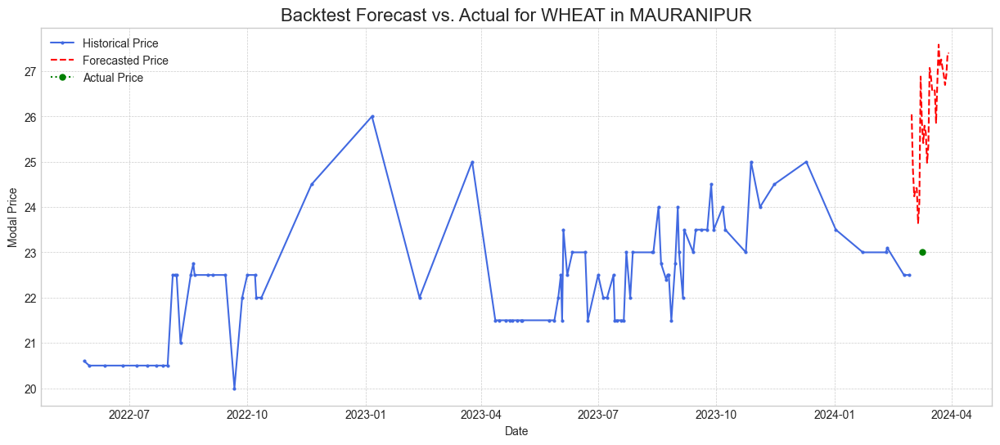


--- Running backtest for APMC: TUNDLA ---
📊 Backtest Evaluation (9-day period): MAE = 1.05, R² = -6.924


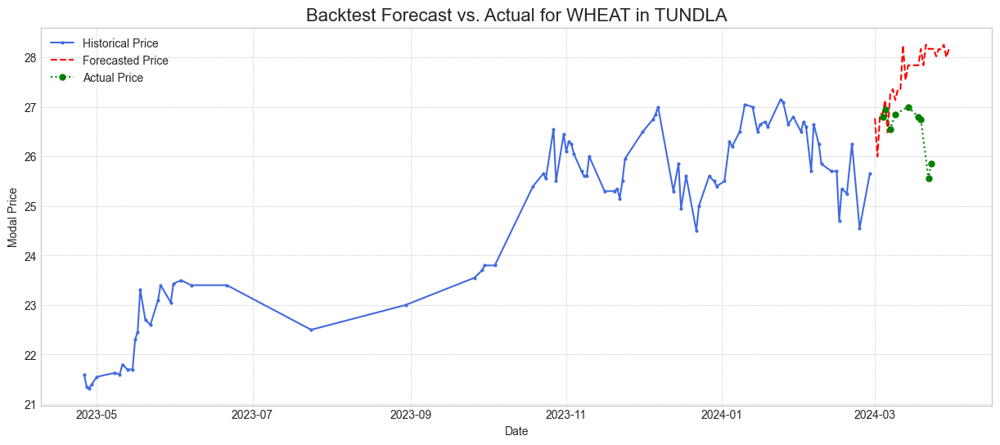


--- Running backtest for APMC: BHARUASUMERPUR ---
📊 Backtest Evaluation (4-day period): MAE = 4.27, R² = 0.000


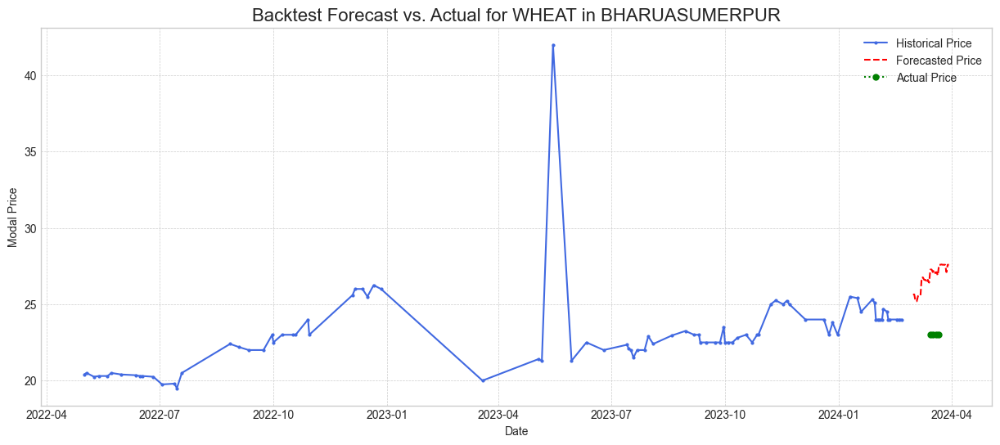


--- Running backtest for APMC: FATEHPUR SIKRI ---


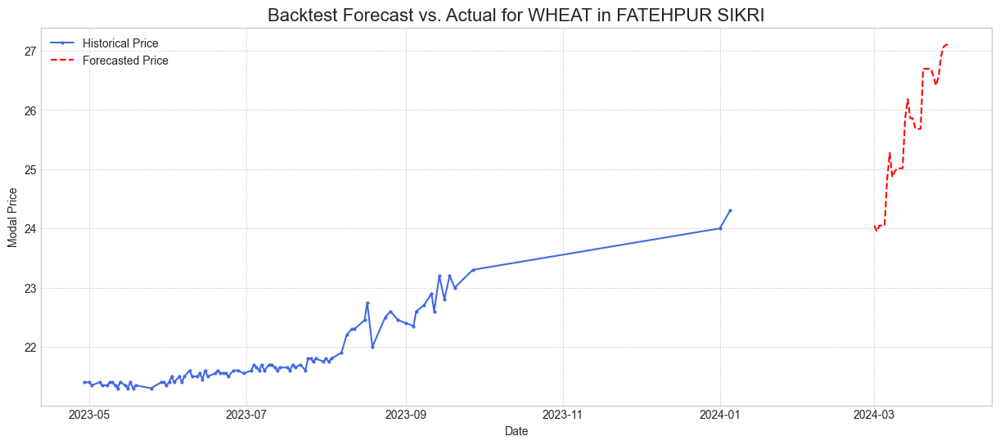


--- Running backtest for APMC: KONCH ---
📊 Backtest Evaluation (8-day period): MAE = 4.12, R² = -0.017


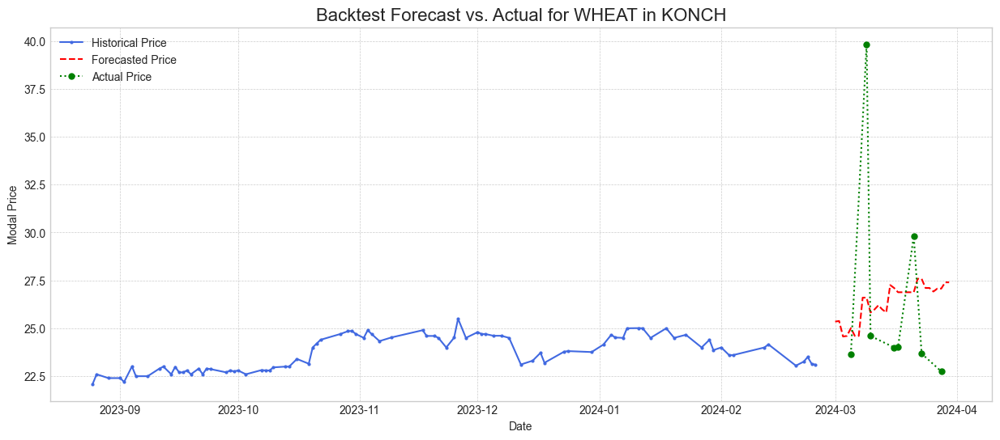


--- Running backtest for APMC: RATH ---


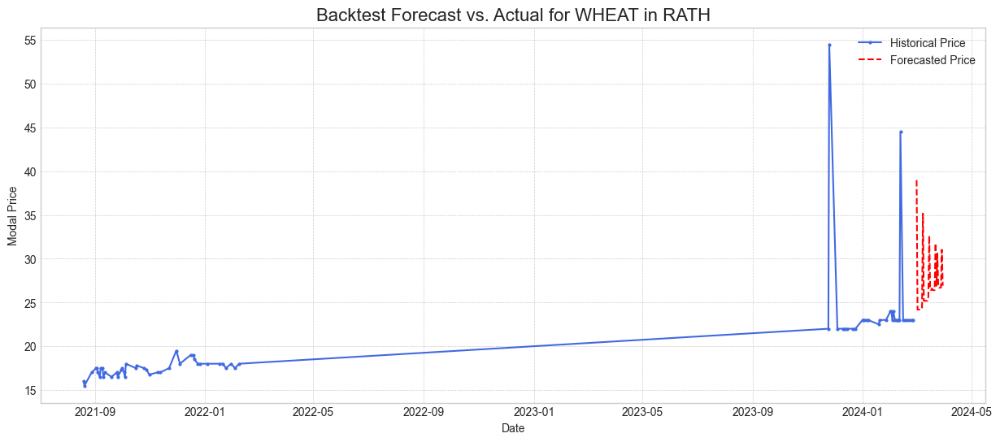


--- Running backtest for APMC: BANGARMAU ---
📊 Backtest Evaluation (8-day period): MAE = 2.35, R² = -5574.530


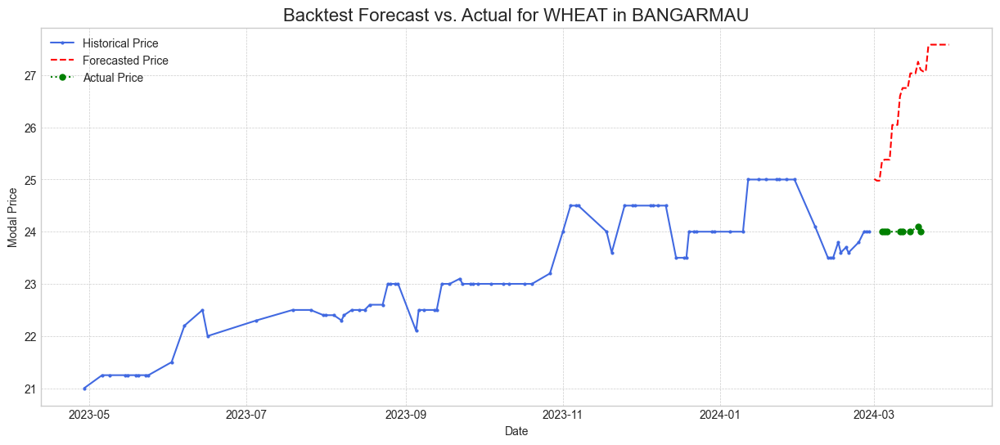


--- Running backtest for APMC: SHAHBAD HARDOI ---
📊 Backtest Evaluation (2-day period): MAE = 3.79, R² = 0.000


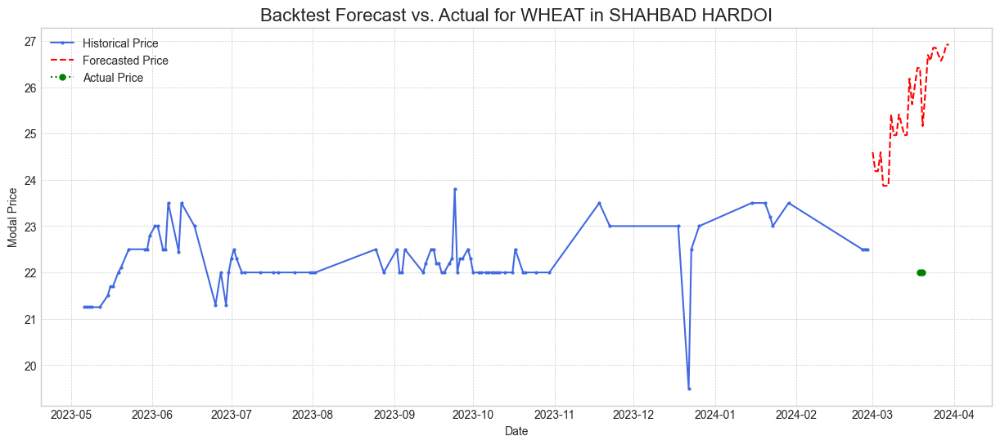


--- Running backtest for APMC: KASGANJ ---
📊 Backtest Evaluation (18-day period): MAE = 3.87, R² = -0.049


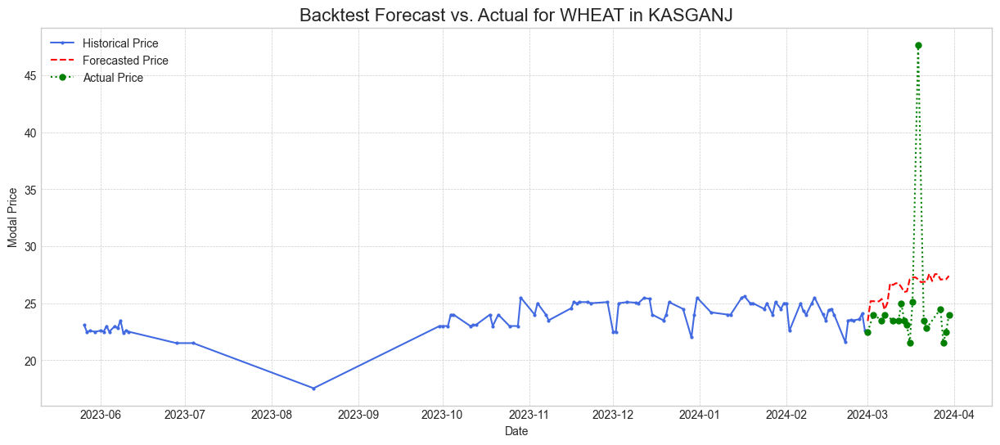


--- Running backtest for APMC: TULSIPUR APMC ---


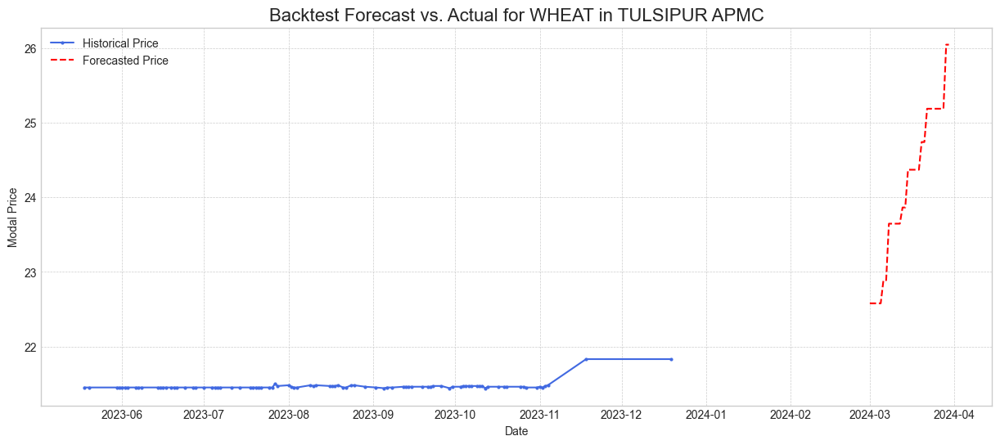


--- Running backtest for APMC: JAIS ---


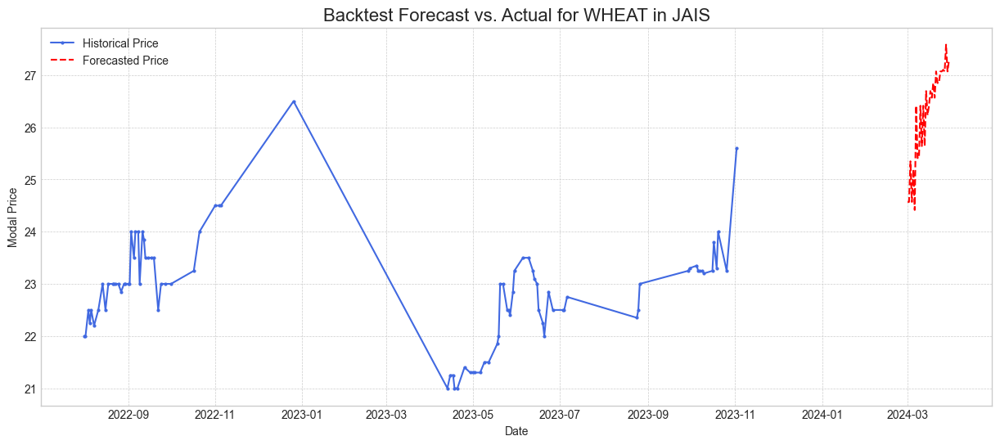


--- Running backtest for APMC: SAHIYAPUR ---


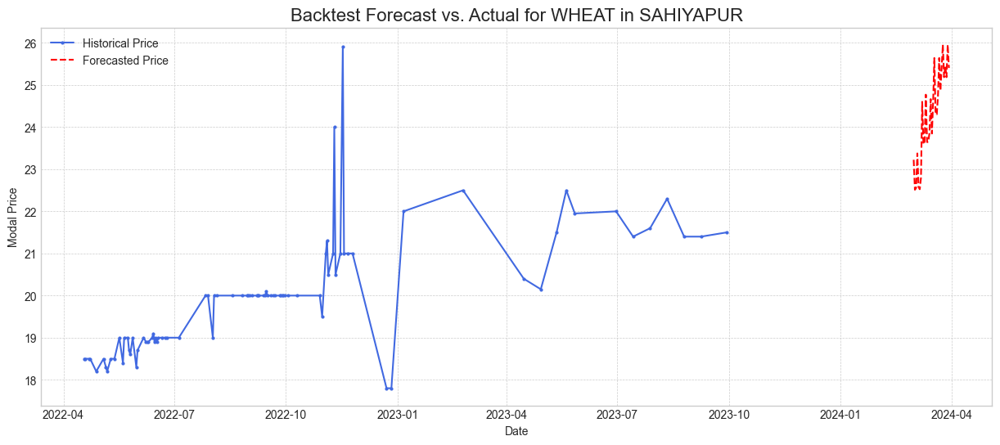


--- Running backtest for APMC: CHARRA ---


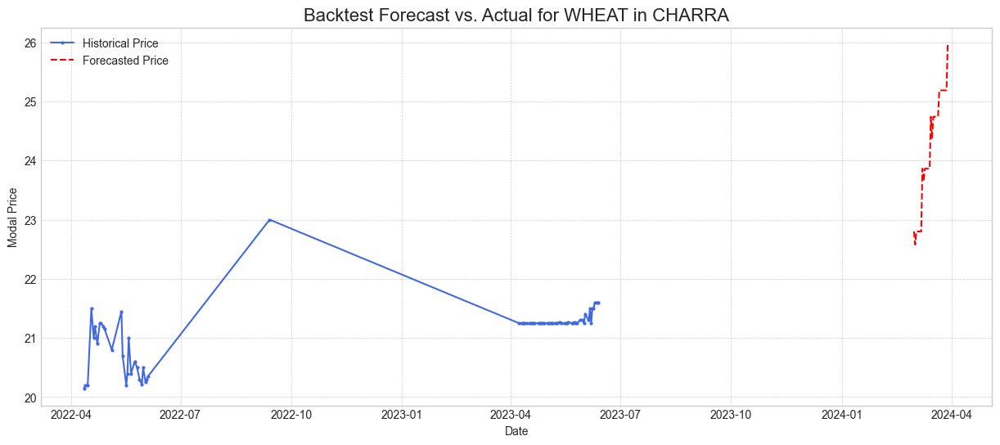


--- Running backtest for APMC: ETAH ---


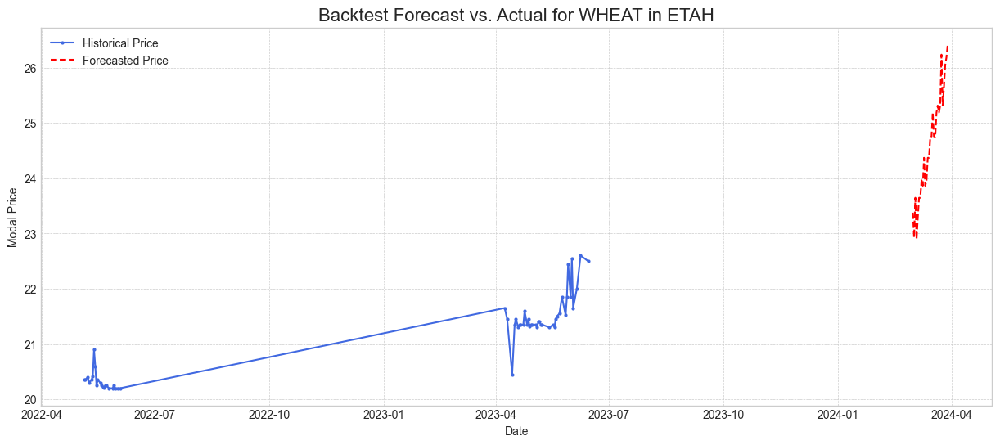


--- Running backtest for APMC: SAFDARGANJ ---


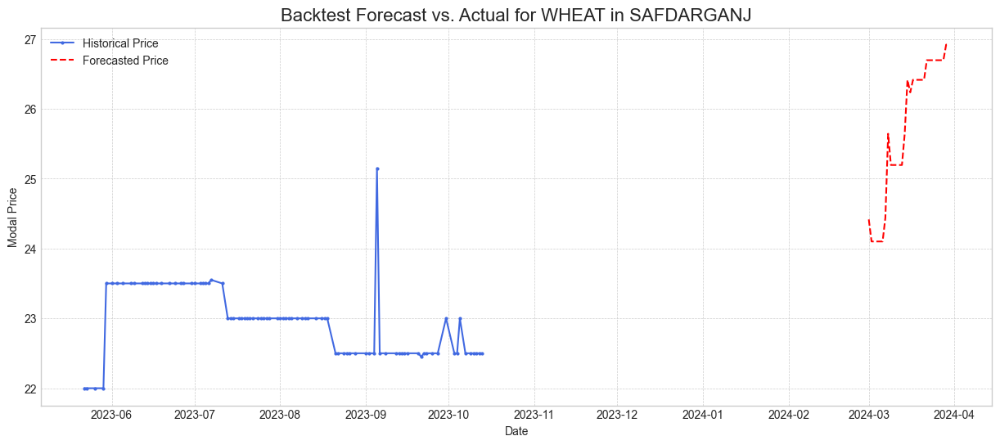


--- Running backtest for APMC: MAINPURI ---


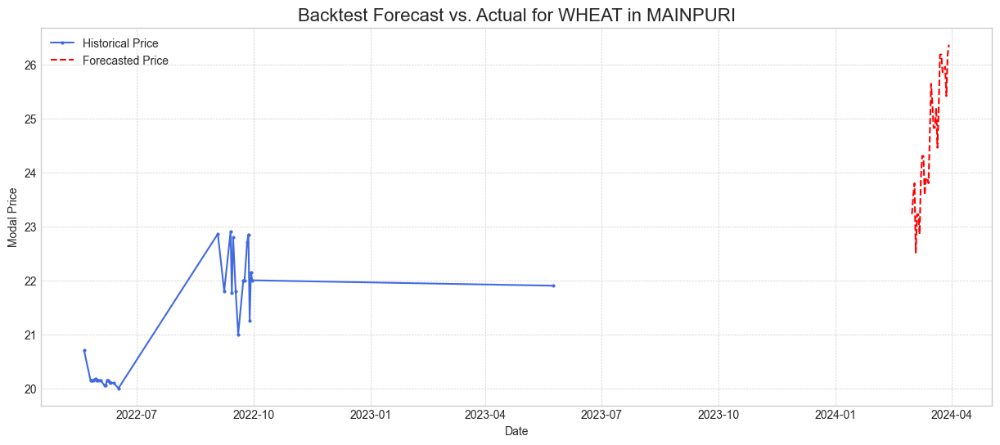


--- Running backtest for APMC: SULTANPUR ---


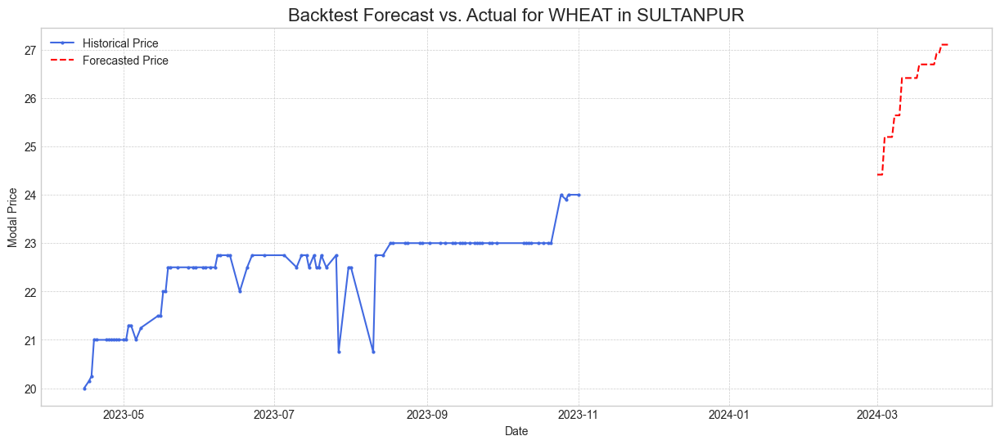


--- Running backtest for APMC: NAWABGANJ APMC ---
📊 Backtest Evaluation (15-day period): MAE = 2.90, R² = -21.130


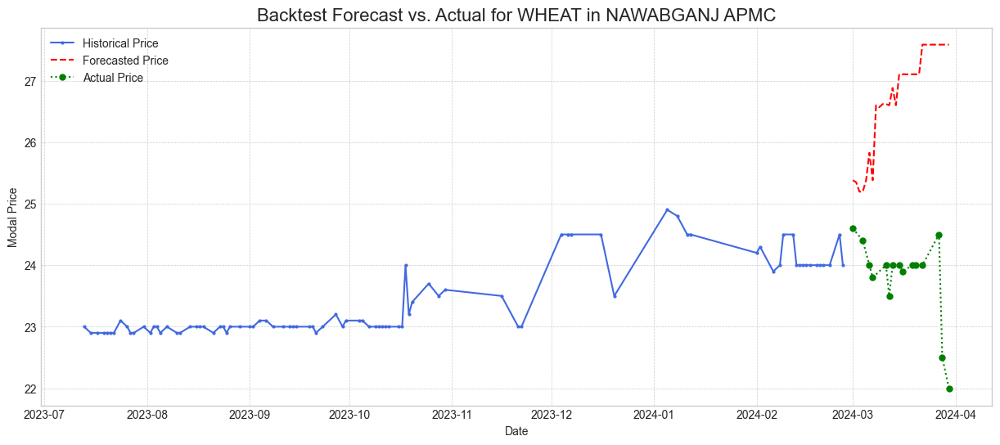


--- Running backtest for APMC: KHAIR ---
📊 Backtest Evaluation (3-day period): MAE = 2.39, R² = -37.094


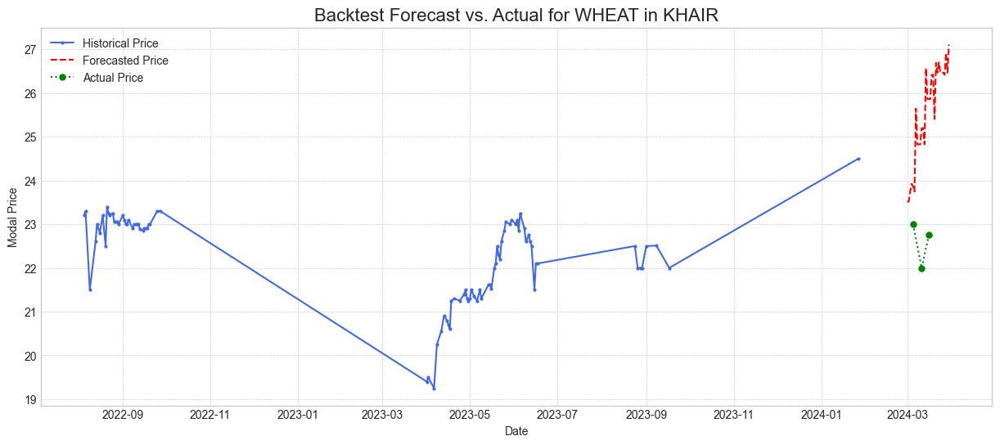


--- Running backtest for APMC: KARWI APMC ---
📊 Backtest Evaluation (2-day period): MAE = 4.10, R² = -1085.802


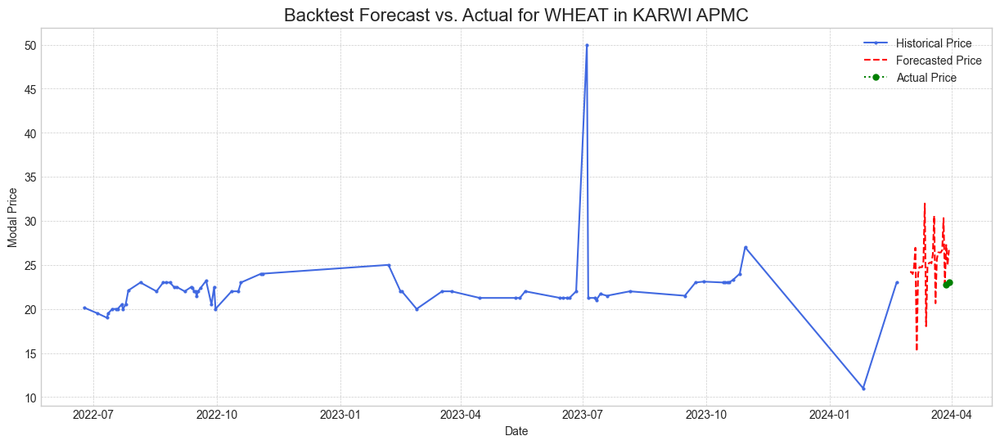


--- Running backtest for APMC: FIROZABAD APMC ---
📊 Backtest Evaluation (5-day period): MAE = 0.90, R² = -11.615


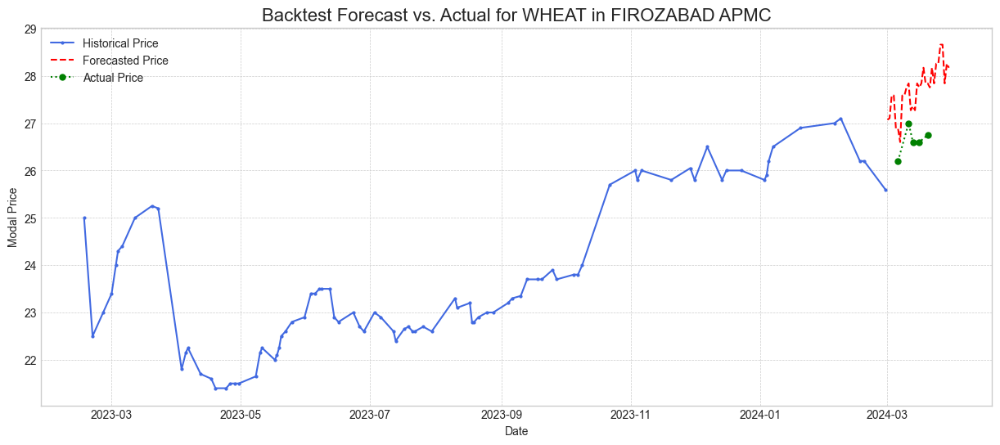


--- Running backtest for APMC: TIKUNIYA ---


C:\Users\WELCOME\AppData\Roaming\Python\Python313\site-packages\sklearn\metrics\_regression.py:1283: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


📊 Backtest Evaluation (1-day period): MAE = 4.72, R² = nan


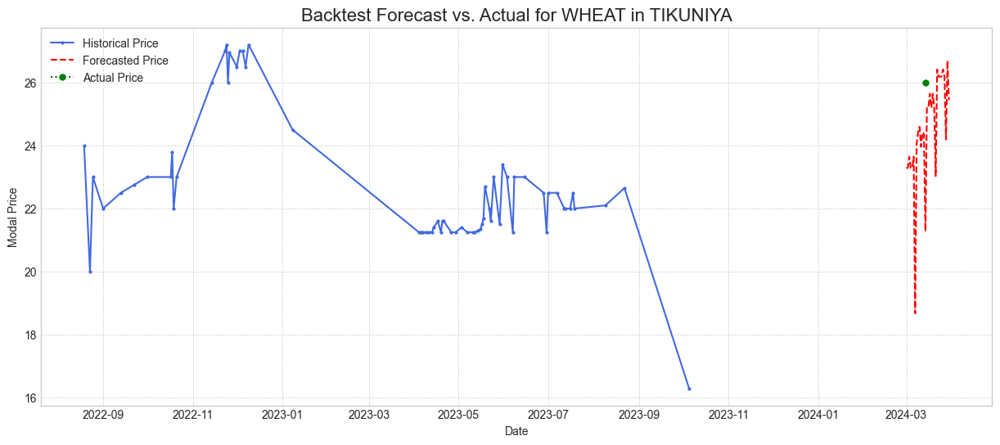


--- Running backtest for APMC: ATARRA APMC ---
📊 Backtest Evaluation (8-day period): MAE = 3.15, R² = 0.000


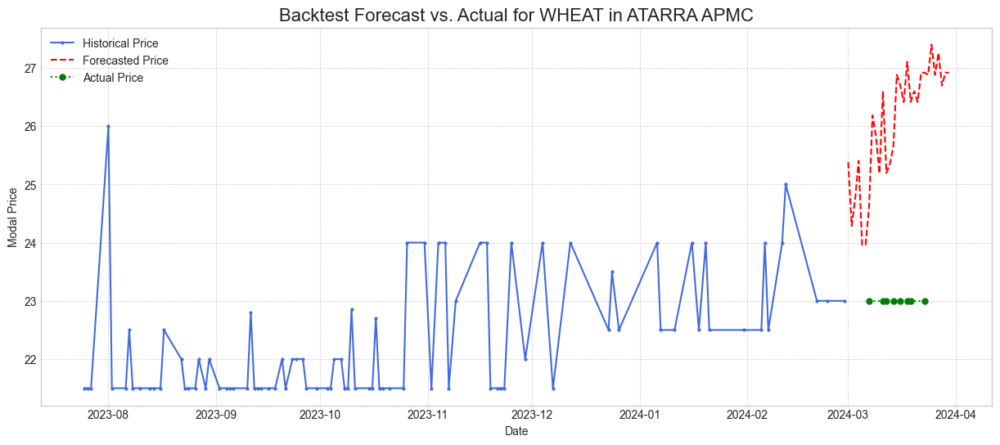


--- Running backtest for APMC: CHAUBEPUR ---
📊 Backtest Evaluation (2-day period): MAE = 2.91, R² = 0.000


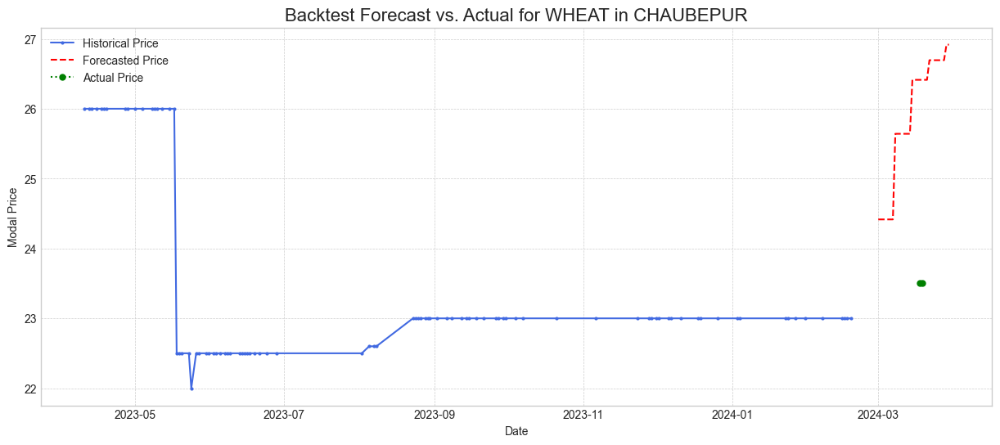


--- Running backtest for APMC: BILSI ---
📊 Backtest Evaluation (12-day period): MAE = 1.88, R² = -3.656


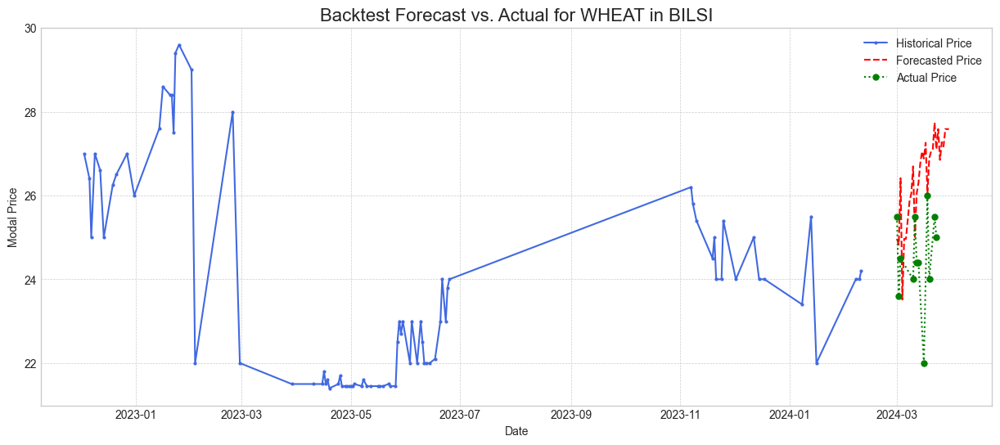


--- Running backtest for APMC: RAE BARELI ---
📊 Backtest Evaluation (3-day period): MAE = 3.83, R² = 0.000


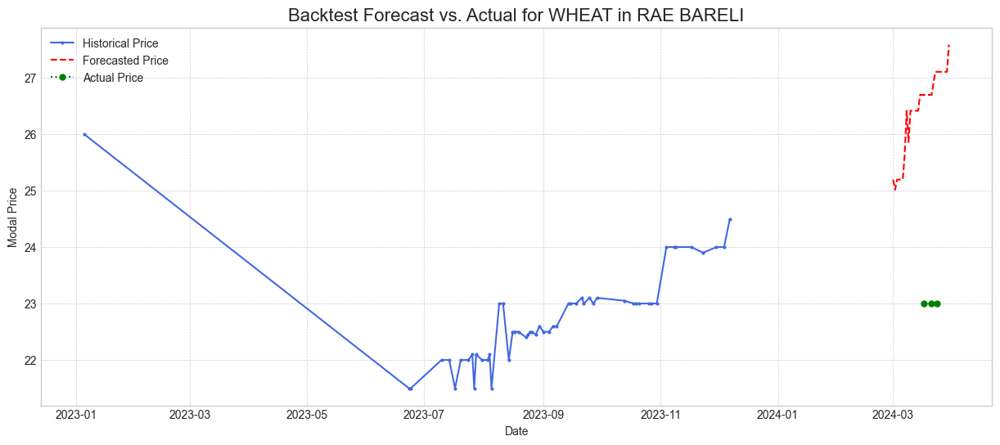


--- Running backtest for APMC: JHANSI ---


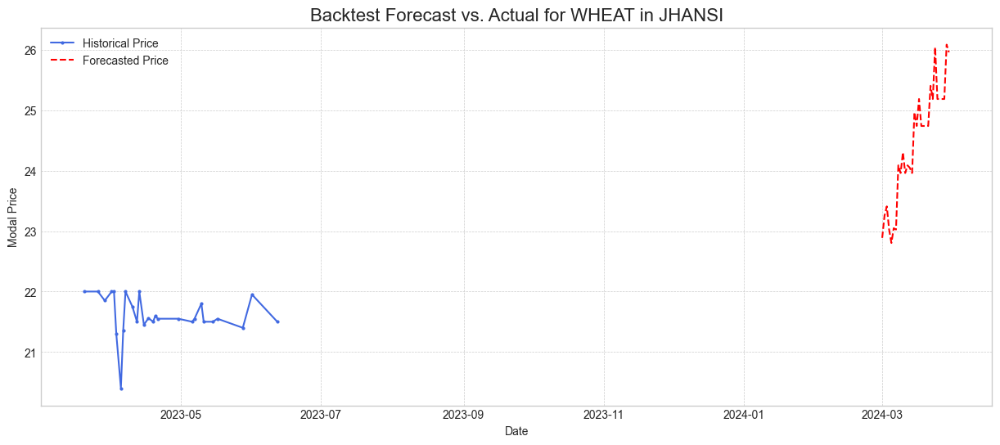


--- Running backtest for APMC: BINDIKI ---


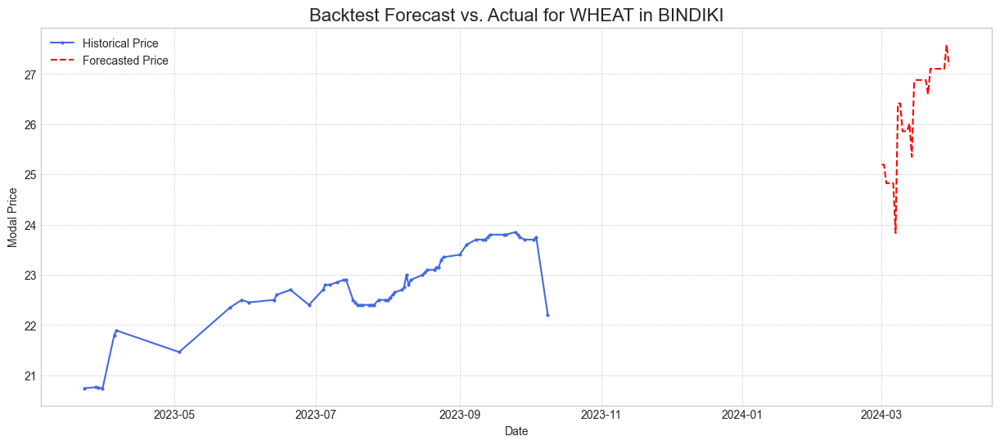


--- Running backtest for APMC: MILAK ---
📊 Backtest Evaluation (5-day period): MAE = 1.66, R² = -36.427


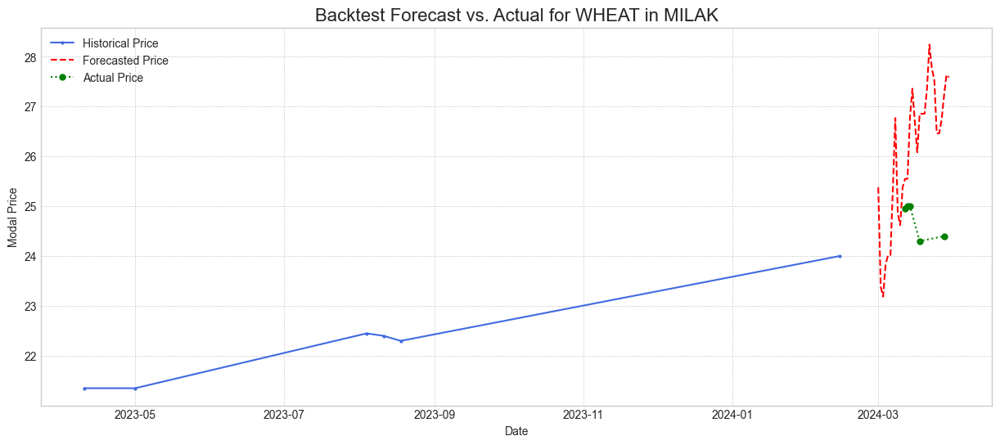


--- Running backtest for APMC: KAIMGANJ ---


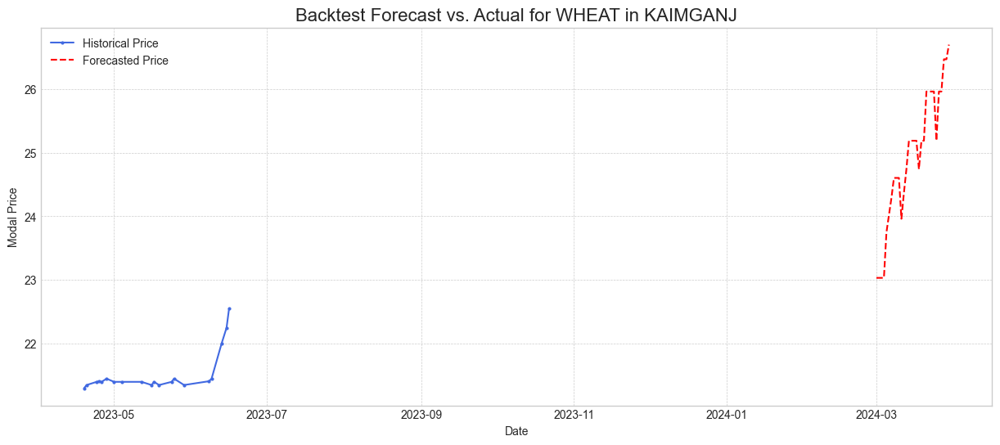


--- Running backtest for APMC: SHAHJAHANPUR ---


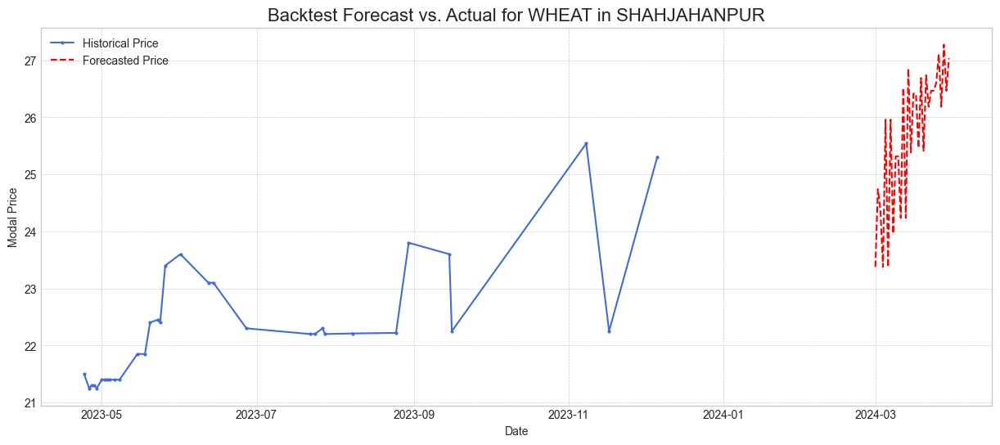


--- Running backtest for APMC: ETAWAH ---


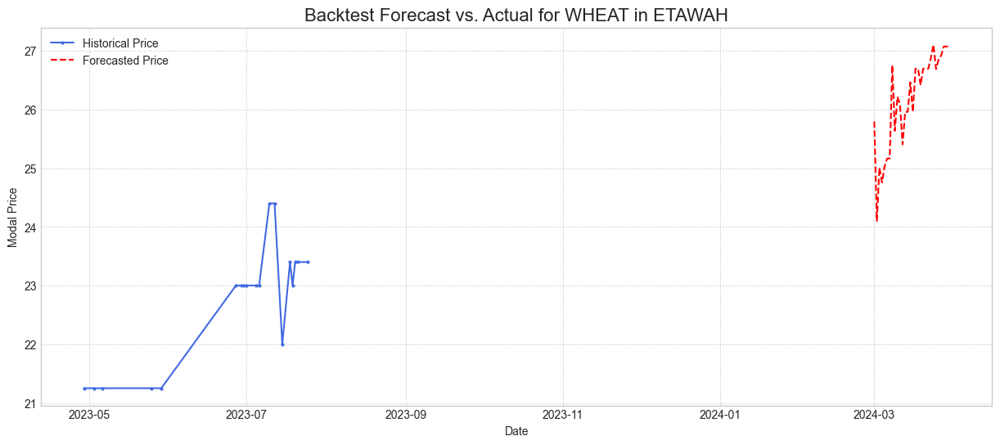


--- Running backtest for APMC: RAMPUR BILASPUR ---


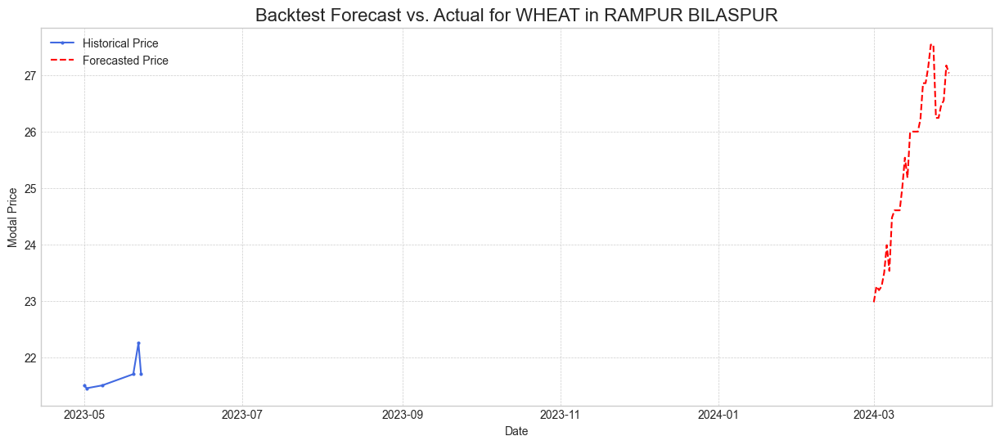


--- Running backtest for APMC: GONDA ---


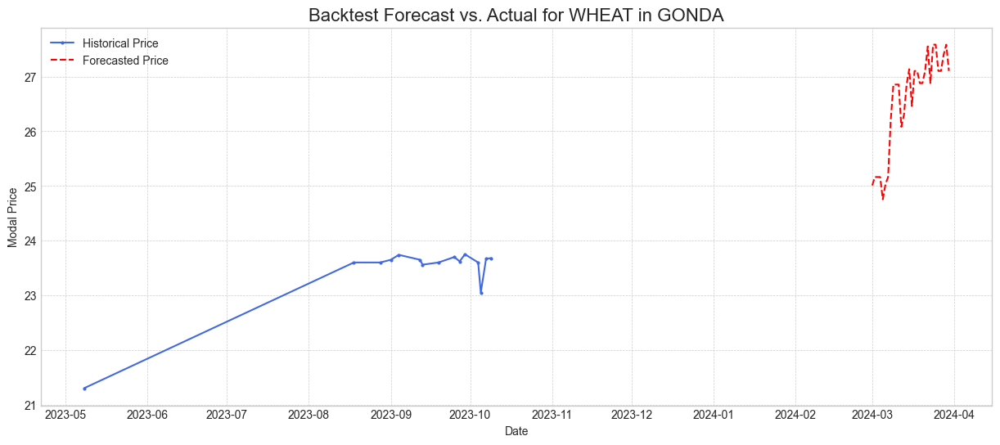


--- Running backtest for APMC: JAHANGIRABAD ---


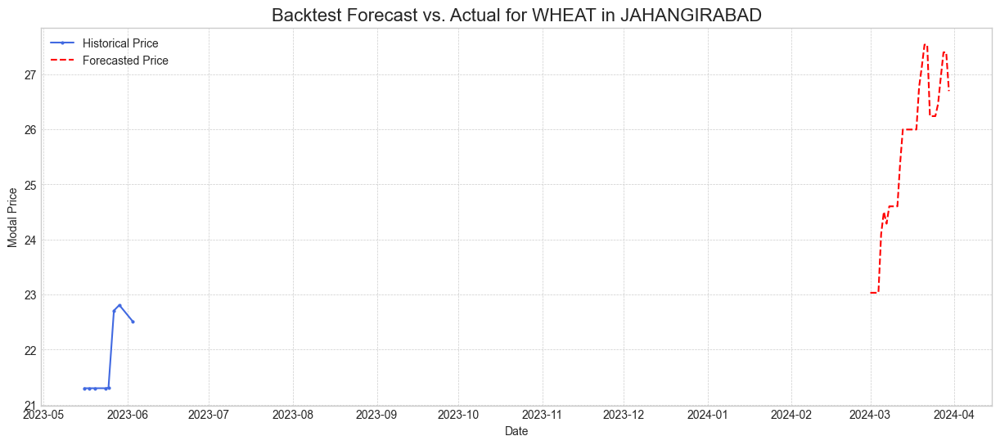


--- Running backtest for APMC: HATHRAS ---


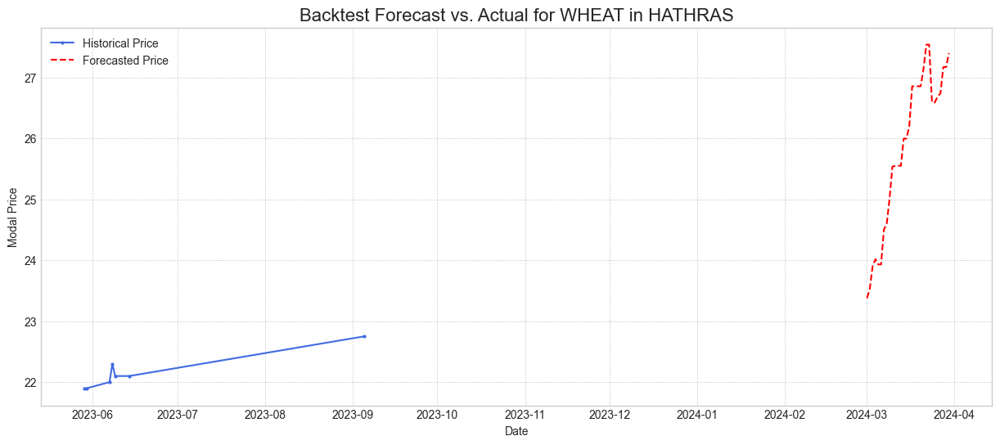


--- Running backtest for APMC: MOHAMADABAD APMC ---


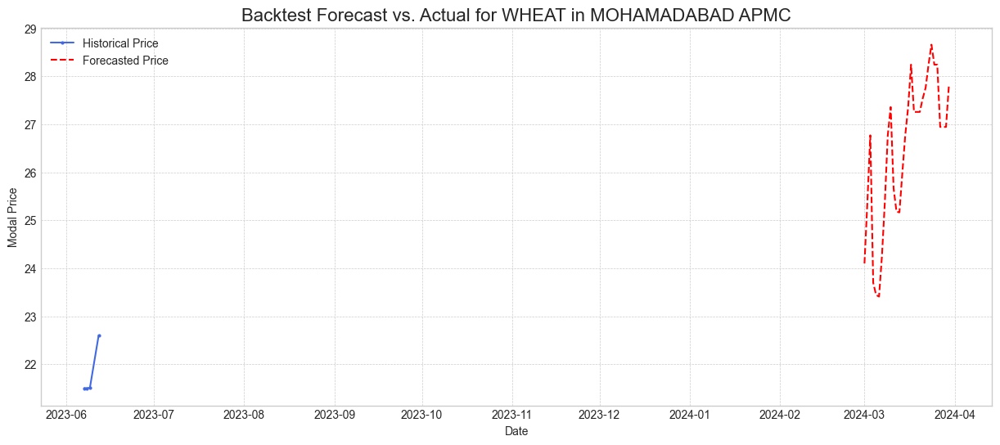


--- Running backtest for APMC: BHARTHANA ---


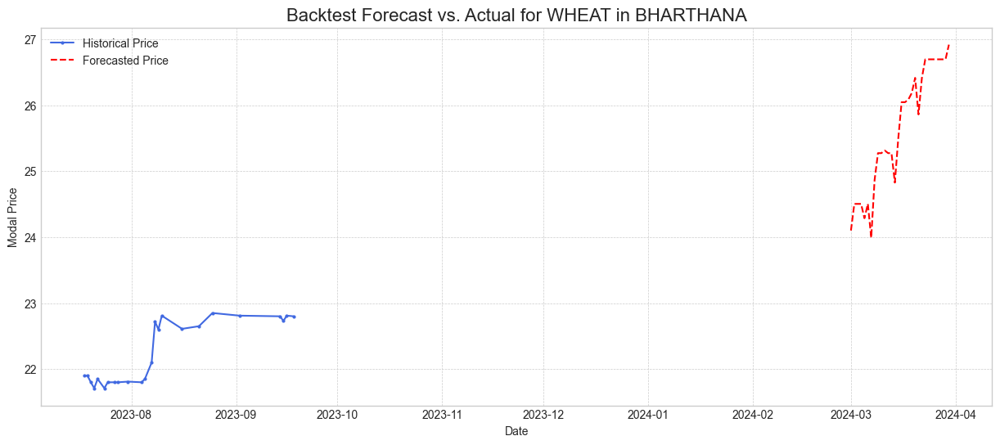


--- Running backtest for APMC: BULANDSHAHAR ---


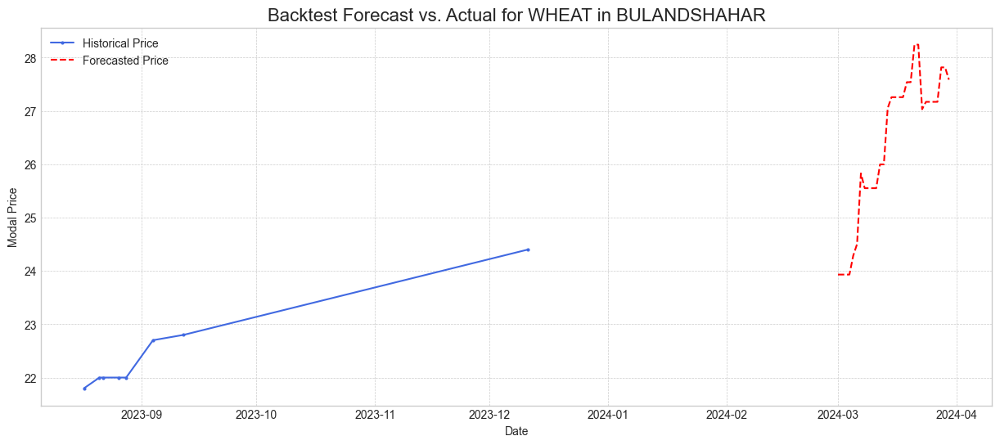


--- Running backtest for APMC: ACHHALDA APMC ---


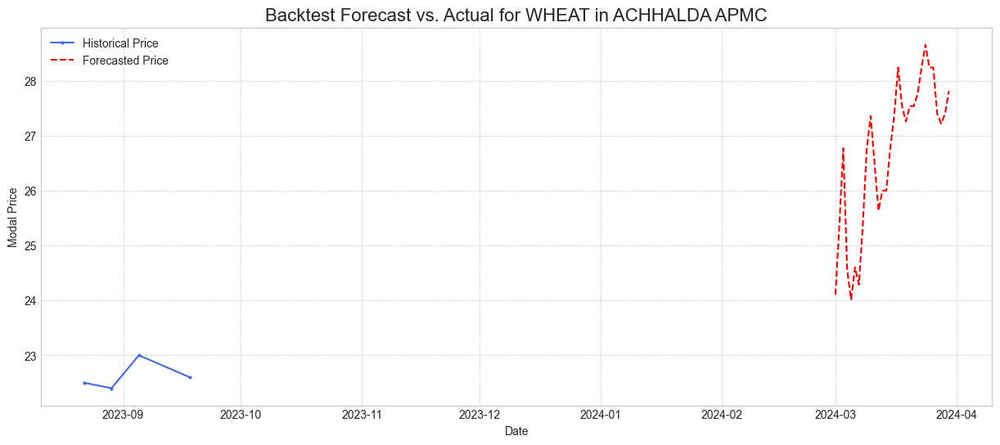


--- Running backtest for APMC: JALALABAD APMC ---
Skipping JALALABAD APMC: Not enough historical data before 2024-03-01.

--- Running backtest for APMC: POWAYAN ---
Skipping POWAYAN: Not enough historical data before 2024-03-01.

--- Running backtest for APMC: MUZZAFFARNAGAR ---
Skipping MUZZAFFARNAGAR: Not enough historical data before 2024-03-01.

--- Running backtest for APMC: MAHOBA ---
Skipping MAHOBA: Not enough historical data before 2024-03-01.

--- Running backtest for APMC: HARDOI ---
Skipping HARDOI: Not enough historical data before 2024-03-01.

--- Running backtest for APMC: PARTAWAL ---
Skipping PARTAWAL: Not enough historical data before 2024-03-01.

--- Running backtest for APMC: HASANPUR APMC ---
Skipping HASANPUR APMC: Not enough historical data before 2024-03-01.

--- Running backtest for APMC: GHIROR ---
Skipping GHIROR: Not enough historical data before 2024-03-01.

--- Running backtest for APMC: CHIBRAMAU ---
Skipping CHIBRAMAU: Not enough historical data before 

In [37]:
# Simply leave out the 'apmc' parameter
predictor.backtest_forecast(
    start_date_str='2024-03-01',
    commodity='WHEAT',
    state='UTTAR PRADESH'
)

## FINAL FINALLL

In [38]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import xgboost as xgb
from sklearn.metrics import mean_absolute_error, r2_score

class CommodityPricePredictor:
    """
    Trains a separate, high-performance model for each commodity and provides
    forecasting, optimal selling date analysis, and historical backtesting tools.
    """
    def __init__(self, df):
        if not isinstance(df.index, pd.DatetimeIndex):
            raise TypeError("DataFrame index must be a DatetimeIndex.")
        self.df_full = df.copy()
        self.models = {}  # Stores a unique model for each commodity
        self.feature_names = {} # Stores feature list for each model
        print("✅ Predictor initialized in high-accuracy (multi-model) mode.")

    def _create_features(self, df):
        """Creates time-series features for the given dataframe."""
        df = df.copy()
        df['dayofweek'] = df.index.dayofweek
        df['dayofyear'] = df.index.dayofyear
        df['month'] = df.index.month
        df['year'] = df.index.year
        df['quarter'] = df.index.quarter
        df['weekofyear'] = df.index.isocalendar().week.astype(int)
        df['price_lag_7'] = df['modal_price'].shift(7)
        df['price_lag_30'] = df['modal_price'].shift(30)
        df['rolling_mean_30'] = df['modal_price'].shift(1).rolling(window=30).mean()
        df['rolling_std_30'] = df['modal_price'].shift(1).rolling(window=30).std()
        return df.dropna()

    def train(self, commodity):
        """Trains a new XGBoost model for a specific commodity."""
        print(f"\n--- Training model for: {commodity} ---")
        df_commodity = self.df_full[self.df_full['commodity'] == commodity]
        if df_commodity.empty:
            return print(f"⚠️ Warning: No data found for {commodity}. Skipping.")

        # Aggregate data to get a single average price per day for this commodity
        df_daily = df_commodity.groupby(df_commodity.index).agg({'modal_price': 'mean'})
        
        df_featured = self._create_features(df_daily)
        self.feature_names[commodity] = [col for col in df_featured.columns if col != 'modal_price']

        train_df = df_featured.loc[df_featured.index < '2024-01-01']
        test_df = df_featured.loc[df_featured.index >= '2024-01-01']

        if test_df.empty or train_df.empty:
            return print(f"⚠️ Warning: Not enough data to split for {commodity}.")

        print(f"Training data from {train_df.index.min().date()} to {train_df.index.max().date()}")
        print(f"Testing data from {test_df.index.min().date()} to {test_df.index.max().date()}")

        TARGET = 'modal_price'
        X_train, y_train = train_df[self.feature_names[commodity]], train_df[TARGET]
        X_test, y_test = test_df[self.feature_names[commodity]], test_df[TARGET]

        model = xgb.XGBRegressor(n_estimators=1000, learning_rate=0.01, eval_metric='mae', early_stopping_rounds=25)
        model.fit(X_train, y_train, eval_set=[(X_test, y_test)], verbose=False)
        
        self.models[commodity] = model
        print(f"✅ Model for {commodity} trained and stored.")
        self.evaluate(commodity, test_df)

    def evaluate(self, commodity, test_df):
        """Evaluates the commodity-specific model."""
        if commodity not in self.models: return print(f"❌ Error: Model for {commodity} not found.")
        
        model = self.models[commodity]
        predictions = model.predict(test_df[self.feature_names[commodity]])
        r2 = r2_score(test_df['modal_price'], predictions)
        mae = mean_absolute_error(test_df['modal_price'], predictions)

        print(f"\n--- Evaluation Results for {commodity} ---")
        print(f"R-squared (R²): {r2:.3f}")
        print(f"Mean Absolute Error (MAE): {mae:.2f}")
        print("--------------------------------------")

        plt.figure(figsize=(15, 6))
        plt.style.use('seaborn-v0_8-whitegrid')
        plt.plot(test_df.index, test_df['modal_price'], label='Actual Price', color='green')
        plt.plot(test_df.index, predictions, label='Predicted Price', color='red', linestyle='--')
        plt.title(f'{commodity} Average Price: Actual vs. Predicted (2024 onwards)', fontsize=16)
        plt.xlabel('Date'), plt.ylabel('Modal Price'), plt.legend(), plt.show()

    def find_best_selling_date(self, commodity, forecast_days=30):
        """Finds the best future day to sell a specific commodity."""
        if commodity not in self.models: return print(f"❌ Error: Model for {commodity} not found.")
        
        print(f"\n--- Forecasting next {forecast_days} days for '{commodity}' ---")
        model = self.models[commodity]
        df_commodity = self.df_full[self.df_full['commodity'] == commodity]
        history_orig = df_commodity.groupby(df_commodity.index).agg({'modal_price': 'mean'})
        
        history_recursive = self._create_features(history_orig.copy())
        future_dates = pd.date_range(start=pd.Timestamp.now().normalize() + pd.Timedelta(days=1), periods=forecast_days)
        predictions = []

        for date in future_dates:
            input_df = pd.DataFrame(index=[date])
            # Re-create features for the new date using the history
            full_history_for_features = pd.concat([history_recursive, input_df])
            featured_input_row = self._create_features(full_history_for_features).iloc[-1:]

            predicted_price = model.predict(featured_input_row[self.feature_names[commodity]])[0]
            predictions.append(predicted_price)
            
            # Add prediction to history for the next loop
            new_row = pd.DataFrame({'modal_price': [predicted_price]}, index=[date])
            history_recursive = pd.concat([history_recursive, new_row])

        forecast_df = pd.DataFrame({'date': future_dates, 'predicted_price': predictions})
        best_day = forecast_df.loc[forecast_df['predicted_price'].idxmax()]

        print(f"💰 Best day to sell is: {best_day['date'].strftime('%A, %B %d, %Y')}")
        print(f"📈 With a predicted average price of: {best_day['predicted_price']:.2f}")
        
        plt.figure(figsize=(15, 6))
        plt.plot(history_orig.index[-90:], history_orig['modal_price'][-90:], label='Historical Avg. Price', color='royalblue')
        plt.plot(forecast_df['date'], forecast_df['predicted_price'], label='Forecasted Avg. Price', color='red', linestyle='--')
        plt.axvline(x=best_day['date'], color='green', linestyle=':', lw=2, label=f"Best Day: {best_day['date'].strftime('%b %d')}")
        plt.title(f"30-Day Avg. Price Forecast for {commodity}", fontsize=16)
        plt.xlabel("Date"), plt.ylabel("Modal Price"), plt.legend(), plt.grid(True), plt.show()

    def backtest_forecast(self, start_date_str, commodity, forecast_days=30):
        """Runs a historical forecast for a commodity to compare with actuals."""
        if commodity not in self.models: return print(f"❌ Error: Model for {commodity} not found.")

        start_date = pd.to_datetime(start_date_str).normalize()
        print(f"\n--- Backtesting {forecast_days}-day forecast for '{commodity}' starting from {start_date.date()} ---")

        model = self.models[commodity]
        df_commodity = self.df_full[self.df_full['commodity'] == commodity]
        df_daily = df_commodity.groupby(df_commodity.index).agg({'modal_price': 'mean'})

        history_orig = df_daily[df_daily.index < start_date]
        if history_orig.empty: return print(f"❌ Error: Not enough data before {start_date.date()} to run a backtest.")
        
        history_recursive = self._create_features(history_orig.copy())
        forecast_dates = pd.date_range(start=start_date, periods=forecast_days)
        predictions = []

        for date in forecast_dates:
            input_df = pd.DataFrame(index=[date])
            full_history_for_features = pd.concat([history_recursive, input_df])
            featured_input_row = self._create_features(full_history_for_features).iloc[-1:]

            predicted_price = model.predict(featured_input_row[self.feature_names[commodity]])[0]
            predictions.append(predicted_price)
            
            new_row = pd.DataFrame({'modal_price': [predicted_price]}, index=[date])
            history_recursive = pd.concat([history_recursive, new_row])

        forecast_df = pd.DataFrame({'date': forecast_dates, 'predicted_price': predictions})
        actuals_df = df_daily[df_daily.index.isin(forecast_dates)]

        if not actuals_df.empty:
            comparison_df = forecast_df.merge(actuals_df, left_on='date', right_index=True, how='inner')
            mae = mean_absolute_error(comparison_df['modal_price'], comparison_df['predicted_price'])
            r2 = r2_score(comparison_df['modal_price'], comparison_df['predicted_price'])
            print(f"\n📊 Backtest Evaluation ({len(comparison_df)}-day period): MAE = {mae:.2f}, R² = {r2:.3f}")

        plt.figure(figsize=(15, 6))
        plt.plot(history_orig.index[-90:], history_orig['modal_price'][-90:], label='Historical Price', color='royalblue')
        plt.plot(forecast_df['date'], forecast_df['predicted_price'], label='Forecasted Price', color='red', linestyle='--')
        if not actuals_df.empty:
            plt.plot(actuals_df.index, actuals_df['modal_price'], label='Actual Price', color='green', marker='o', markersize=5)
        plt.title(f"Backtest Forecast vs. Actual for {commodity}", fontsize=16)
        plt.xlabel("Date"), plt.ylabel("Modal Price"), plt.legend(), plt.grid(True), plt.show()

✅ Predictor initialized in high-accuracy (multi-model) mode.

--- Training model for: CABBAGE ---
Training data from 2021-01-31 to 2023-12-31
Testing data from 2024-01-01 to 2025-09-06
✅ Model for CABBAGE trained and stored.

--- Evaluation Results for CABBAGE ---
R-squared (R²): 0.692
Mean Absolute Error (MAE): 2.11
--------------------------------------


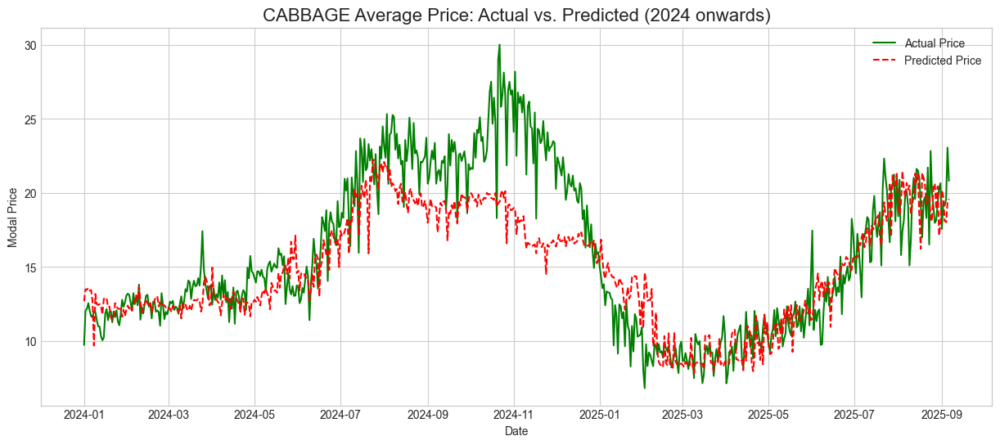


--- Training model for: WHEAT ---
Training data from 2021-01-31 to 2023-12-31
Testing data from 2024-01-01 to 2025-09-06
✅ Model for WHEAT trained and stored.

--- Evaluation Results for WHEAT ---
R-squared (R²): 0.079
Mean Absolute Error (MAE): 1.07
--------------------------------------


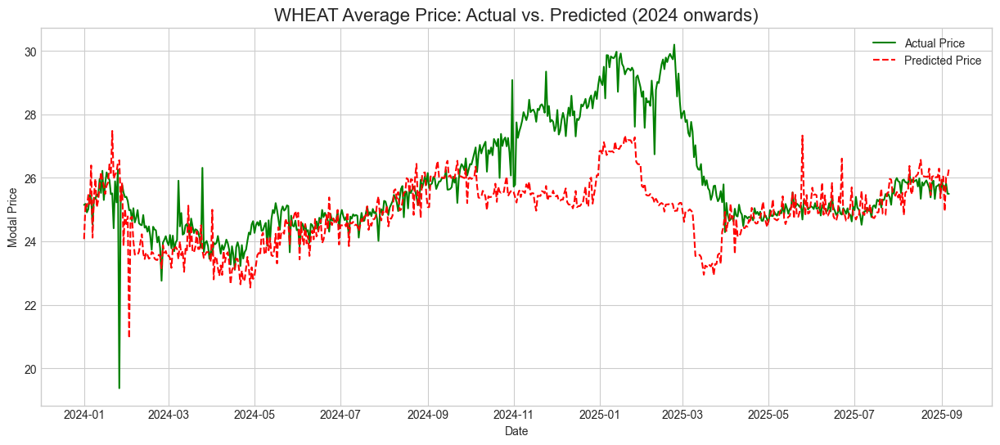


--- Forecasting next 30 days for 'CABBAGE' ---
💰 Best day to sell is: Sunday, September 28, 2025
📈 With a predicted average price of: 20.32


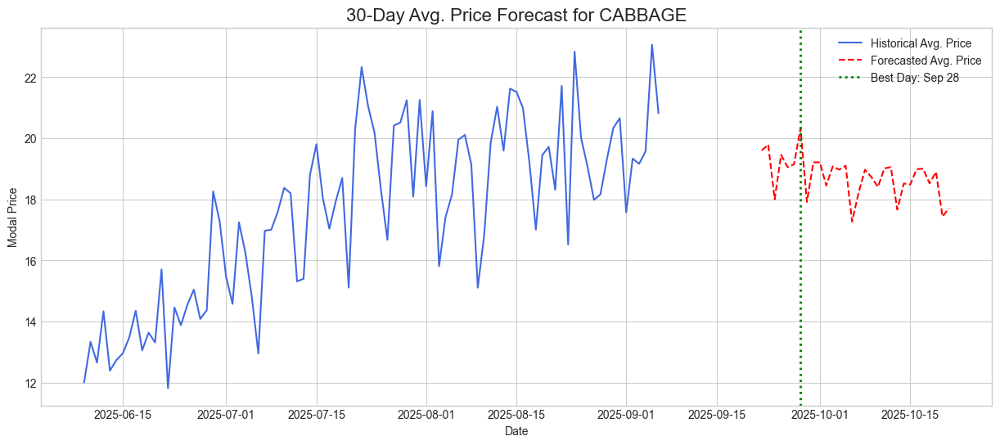


--- Backtesting 30-day forecast for 'WHEAT' starting from 2024-03-01 ---

📊 Backtest Evaluation (30-day period): MAE = 1.60, R² = -8.396


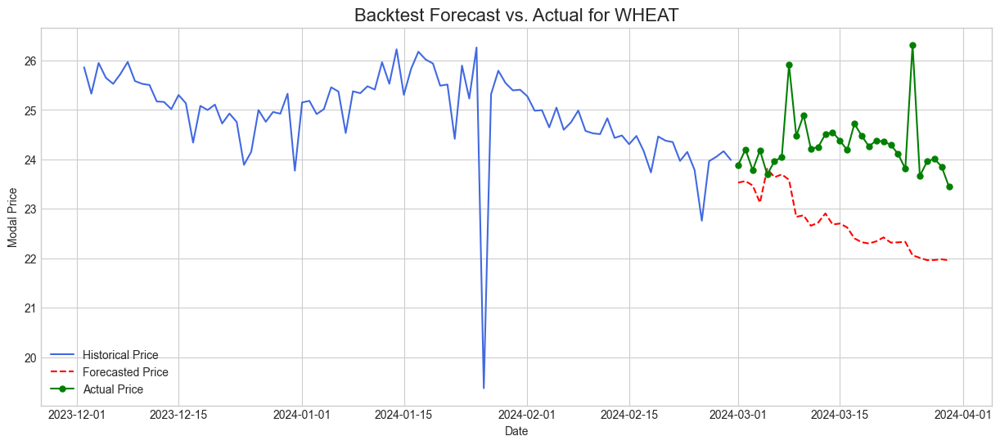

In [39]:
# Assuming 'df_final' is your loaded DataFrame with a DatetimeIndex
predictor = CommodityPricePredictor(df_final)

predictor.train(commodity='CABBAGE')
predictor.train(commodity='WHEAT')

predictor.find_best_selling_date(commodity='CABBAGE')

predictor.backtest_forecast(
    start_date_str='2024-03-01',
    commodity='WHEAT'
)